In [1]:
%cd work/cx26_milestoning_convergence_testing
%ls -lh

/data/wesley/cx26_milestoning_convergence_testing
total 23G
-rw-r--r-- 1 wesley wesley 9.0M Oct 21 10:11 Check_Milestone_Convergence-Copy1.ipynb
-rw-r--r-- 1 wesley wesley 9.9M Dec 18 09:13 Check_Milestone_Convergence.cAMP.ipynb
-rw-r--r-- 1 wesley wesley 8.8M Oct 15 16:04 Check_Milestone_Convergence.ipynb
-rw-r--r-- 1 wesley wesley 8.5M Nov 25 16:41 Check_Milestone_Convergence.pot.ipynb
-rw-r--r-- 1 wesley wesley 5.1G Dec  2 09:30 Convergence_Data.cAMP.csv
-rw-r--r-- 1 wesley wesley 575M Nov 25 15:05 Convergence_Data.pot.csv
-rw-r--r-- 1 wesley wesley 1.7G Dec  2 09:33 Convergence_Mean_Data.cAMP.csv
-rw-r--r-- 1 wesley wesley 457M Nov 25 15:06 Convergence_Mean_Data.pot.csv
-rw-r--r-- 1 wesley wesley 441M Nov 25 15:47 Count_Data.cAMP.csv
-rw-r--r-- 1 wesley wesley 363M Oct  4 03:05 Count_Data.csv
-rw-r--r-- 1 wesley wesley  48M Nov 25 10:32 Count_Data.pot.csv
-rw-r--r-- 1 wesley wesley 830M Nov 25 15:19 Nij_Convergence_RMSD_Data.pot.csv
-rw-r--r-- 1 wesley wesley 2.1G Nov 25 15:45 Nij_

In [44]:
!pwd

/data/wesley/cx26_milestoning_convergence_testing


In [55]:
import numpy as np
import pandas as pd
import scipy as sp

import sys
import os
import gc
import tqdm
#from tqdm import notebook
import itertools
import copy

tqbar=tqdm.tqdm_notebook

import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns

import bokeh

import plotly as ply
from plotly.subplots import make_subplots
from plotly import graph_objs as go
ply.io.renderers.default="notebook" #"colab"

import analysis_functions

import ipywidgets as widgets
from ipywidgets import interact

In [56]:
indexedSimulationData=pd.read_csv('Simulation_Milestone_Coordinate_Data.cAMP_newTransit_final.version.csv')
indexedSimulationData.head()

,Window,Rep,Time,Rst06_X,Rst06_Y,Rst07_Z,Rst08_Z,X_Index,R
0,0,1,0.0,4.291,17.350,107.903,10.456,0,17.872750
1,0,1,500.0,4.117,17.984,108.105,10.275,0,18.449226
2,0,1,1000.0,4.162,17.821,108.509,9.857,0,18.300554
3,0,1,1500.0,4.621,17.773,107.792,10.539,0,18.363909
4,0,1,2000.0,4.761,17.909,108.495,9.874,0,18.531039


In [36]:
milestoneData=analysis_functions.add_indexed_milestoning_analysis_columns(
    indexedSimulationData,
    windowColumn='Window',xIndexColumn='X_Index',frameCol='Frame',
    repColumn='Rep',groupingColumn=None,verbose=True,
    verboseLevel=0
)
milestoneData.head()

/data/wesley/cx26_milestoning_convergence_testing/analysis_functions.py:424: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/data/wesley/cx26_milestoning_convergence_testing/analysis_functions.py:434: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



--- --- --- Grouping Name: 0 --- --- ---
	--- --- Window Name: 0 --- ---
		--- Replica Name: 1 2 3 4 5 6 ---
	--- --- ------ --- ---
	--- --- Window Name: 1 --- ---
		--- Replica Name: 1 2 3 4 5 6 7 8 ---
	--- --- ------ --- ---
	--- --- Window Name: 2 --- ---
		--- Replica Name: 1 3 4 5 6 7 8 9 10 11 12 13 ---
	--- --- ------ --- ---
	--- --- Window Name: 3 --- ---
		--- Replica Name: 1 2 3 4 5 ---
	--- --- ------ --- ---
	--- --- Window Name: 4 --- ---
		--- Replica Name: 2 4 5 6 7 8 9 ---
	--- --- ------ --- ---
	--- --- Window Name: 5 --- ---
		--- Replica Name: 1 3 4 5 6 7 ---
	--- --- ------ --- ---
	--- --- Window Name: 6 --- ---
		--- Replica Name: 1 3 4 5 6 7 8 9 10 ---
	--- --- ------ --- ---
	--- --- Window Name: 7 --- ---
		--- Replica Name: 2 4 5 6 7 8 9 10 ---
	--- --- ------ --- ---
	--- --- Window Name: 8 --- ---
		--- Replica Name: 1 3 4 5 6 7 8 9 10 11 ---
	--- --- ------ --- ---
	--- --- Window Name: 9 --- ---
		--- Replica Name: 6 7 8 9 10 11 12 13 ---
	--- --- ----

,Window,X_Index,Group,Rep,Frame,Escape_Vector,Reentry_Vector
0,0,0,0,1,0,0,-1
1,0,0,0,1,1,0,-1
2,0,0,0,1,2,0,-1
3,0,0,0,1,3,0,-1
4,0,0,0,1,4,0,-1


In [38]:
milestoneBins=milestoneData.Window.sort_values().unique()
forwardAnalysisData=analysis_functions.compute_analysis_group_Qdata(
      groupDataFrame=milestoneData,
      windowColumn="Window",
      binSet=milestoneBins,
      sourceWindows=None,sinkWindows=None,
      repColumn='Rep',givePiVec=True,
      giveBins=False,giveBinMap=True,
      giveEscapeMat=True,giveCounts=True,
      giveCountsMat=True,giveEdgeMap=True,
      giveRiVec=True,giveNijMat=True,
      giveQtargets=True
)
forwardAnalysisData

Computing R and N: ( 0 : 1 2 3 4 5 6 ) ( 1 : 1 2 3 4 5 6 7 8 ) ( 2 : 1 3 4 5 6 7 8 9 10 11 12 13 ) ( 3 : 1 2 3 4 5 ) ( 4 : 2 4 5 6 7 8 9 ) ( 5 : 1 3 4 5 6 7 ) ( 6 : 1 3 4 5 6 7 8 9 10 ) ( 7 : 2 4 5 6 7 8 9 10 ) ( 8 : 1 3 4 5 6 7 8 9 10 11 ) ( 9 : 6 7 8 9 10 11 12 13 ) ( 10 : 1 2 3 4 5 6 7 8 9 10 11 ) ( 11 : 1 2 3 4 5 6 7 ) ( 12 : 1 2 3 4 5 6 ) ( 13 : 1 3 4 5 ) ( 14 : 1 2 3 4 5 6 ) ( 15 : 1 2 3 ) ( 16 : 1 2 3 4 ) ( 17 : 1 2 3 4 ) ( 18 : 1 2 3 4 ) ( 19 : 1 2 3 4 ) ( 20 : 1 ) ( 21 : 1 2 ) ( 22 : 3 ) ( 23 : 1 ) ( 24 : 3 ) ( 25 : 1 ) ( 26 : 1 ) ( 27 : 1 2 ) ( 28 : 1 ) ( 29 : 3 ) ( 30 : 1 ) ( 31 : 1 ) ( 32 : 1 ) ( 33 : 1 ) ( 34 : 1 ) ( 35 : 4 5 ) ( 36 : 1 ) ( 37 : 1 2 3 4 ) ( 38 : 1 ) ( 39 : 1 ) ( 40 : 1 ) ( 41 : 1 ) ( 42 : 1 ) ( 43 : 1 3 4 5 6 7 ) ( 44 : 1 2 3 4 5 6 ) ( 45 : 1 2 3 4 5 6 ) ( 46 : 1 2 3 ) ( 47 : 1 2 3 ) ( 48 : 1 2 ) ( 49 : 1 2 3 ) ( 50 : 1 3 4 ) ( 51 : 1 2 ) ( 52 : 1 2 3 4 5 ) 


{'Rmat': <53x53 sparse matrix of type '<class 'numpy.float64'>'
 	with 104 stored elements in Compressed Sparse Row format>,
 'Nmat': <1378x1378 sparse matrix of type '<class 'numpy.float64'>'
 	with 102 stored elements in Compressed Sparse Row format>,
 'countVec': array([ 112205,  100854,  235386,  208958,  271734,  185323,  182698,
         411141,  612676,  727381,  755311,  889348,  481876, 1572035,
         467851,  280432,  369678,  299382,  375663, 1412059,   51061,
          74192,   46812,   32699,  157106,   60112,   51256,  364684,
          13970,  233376,   69921,   41589,   32564,   29633,   69860,
         379784,  116333,  168315,  292471,   51606,   83324,   28009,
          37124,  664178,  121288,   59826,   46669,   41429,   25119,
          46809,   15506,   33627,   39649]),
 'escapeMat': <53x53 sparse matrix of type '<class 'numpy.float64'>'
 	with 157 stored elements in List of Lists format>,
 'countsMat': <53x53 sparse matrix of type '<class 'numpy.float64'>'


In [40]:
print('Copying raw simulation data')
reverseIndexedSimulationData=indexedSimulationData.copy()
print('Inverting cell indexing')
reverseIndexedSimulationData['Window']=reverseIndexedSimulationData['Window'].max() - \
    reverseIndexedSimulationData['Window']
reverseIndexedSimulationData['X_Index']=reverseIndexedSimulationData['Window'].max() - \
    reverseIndexedSimulationData['X_Index']
print('Generating milestoning analysis columns')
reverseMilestoneData=analysis_functions.add_indexed_milestoning_analysis_columns(
    reverseIndexedSimulationData,
    windowColumn='Window',xIndexColumn='X_Index',frameCol='Frame',
    repColumn='Rep',groupingColumn=None,verbose=True,
    verboseLevel=0
)
print('Running Milestoning Analysis')
reverseAnalysisData=analysis_functions.compute_analysis_group_Qdata(
      groupDataFrame=reverseMilestoneData,
      windowColumn="Window",
      binSet=milestoneBins,
      sourceWindows=None,sinkWindows=None,
      repColumn='Rep',givePiVec=True,
      giveBins=False,giveBinMap=True,
      giveEscapeMat=True,giveCounts=True,
      giveCountsMat=True,giveEdgeMap=True,
      giveRiVec=True,giveNijMat=True,
      giveQtargets=True
)
reverseAnalysisData

Copying raw simulation data
Inverting cell indexing
Generating milestoning analysis columns


/data/wesley/cx26_milestoning_convergence_testing/analysis_functions.py:424: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/data/wesley/cx26_milestoning_convergence_testing/analysis_functions.py:434: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



--- --- --- Grouping Name: 0 --- --- ---
	--- --- Window Name: 0 --- ---
		--- Replica Name: 1 2 3 4 5 ---
	--- --- ------ --- ---
	--- --- Window Name: 1 --- ---
		--- Replica Name: 1 2 ---
	--- --- ------ --- ---
	--- --- Window Name: 2 --- ---
		--- Replica Name: 1 3 4 ---
	--- --- ------ --- ---
	--- --- Window Name: 3 --- ---
		--- Replica Name: 1 2 3 ---
	--- --- ------ --- ---
	--- --- Window Name: 4 --- ---
		--- Replica Name: 1 2 ---
	--- --- ------ --- ---
	--- --- Window Name: 5 --- ---
		--- Replica Name: 1 2 3 ---
	--- --- ------ --- ---
	--- --- Window Name: 6 --- ---
		--- Replica Name: 1 2 3 ---
	--- --- ------ --- ---
	--- --- Window Name: 7 --- ---
		--- Replica Name: 1 2 3 4 5 6 ---
	--- --- ------ --- ---
	--- --- Window Name: 8 --- ---
		--- Replica Name: 1 2 3 4 5 6 ---
	--- --- ------ --- ---
	--- --- Window Name: 9 --- ---
		--- Replica Name: 1 3 4 5 6 7 ---
	--- --- ------ --- ---
	--- --- Window Name: 10 --- ---
		--- Replica Name: 1 ---
	--- --- ------ --- --

{'Rmat': <53x53 sparse matrix of type '<class 'numpy.float64'>'
 	with 104 stored elements in Compressed Sparse Row format>,
 'Nmat': <1378x1378 sparse matrix of type '<class 'numpy.float64'>'
 	with 102 stored elements in Compressed Sparse Row format>,
 'countVec': array([  39649,   33627,   15506,   46809,   25119,   41429,   46669,
          59826,  121288,  664178,   37124,   28009,   83324,   51606,
         292471,  168315,  116333,  379784,   69860,   29633,   32564,
          41589,   69921,  233376,   13970,  364684,   51256,   60112,
         157106,   32699,   46812,   74192,   51061, 1412059,  375663,
         299382,  369678,  280432,  467851, 1572035,  481876,  889348,
         755311,  727381,  612676,  411141,  182698,  185323,  271734,
         208958,  235386,  100854,  112205]),
 'escapeMat': <53x53 sparse matrix of type '<class 'numpy.float64'>'
 	with 157 stored elements in List of Lists format>,
 'countsMat': <53x53 sparse matrix of type '<class 'numpy.float64'>'


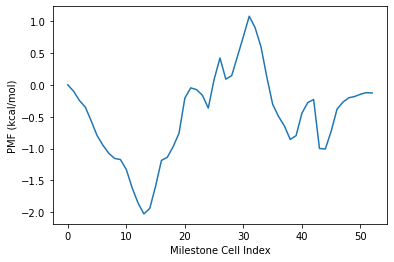

In [49]:
forwardPiVec=forwardAnalysisData['piVec']

kbT=.6 #approximiately .6 kcal/mol

forwardPMF=-kbT*np.log(forwardPiVec)
forwardPMF=forwardPMF-forwardPMF[0] #assuming first bulk cell is 0

sns.lineplot(
    x=np.arange(len(forwardPMF)),
    y=forwardPMF
)
plt.xlabel('Milestone Cell Index')
plt.ylabel('PMF (kcal/mol)')
plt.show()

In [53]:
!pwd
!ls

/data/wesley/cx26_milestoning_convergence_testing
Check_Milestone_Convergence-Copy1.ipynb
Check_Milestone_Convergence.cAMP.ipynb
Check_Milestone_Convergence.ipynb
Check_Milestone_Convergence.pot.ipynb
Convergence_Data.cAMP.csv
Convergence_Data.pot.csv
Convergence_Mean_Data.cAMP.csv
Convergence_Mean_Data.pot.csv
Count_Data.cAMP.csv
Count_Data.csv
Count_Data.pot.csv
Nij_Convergence_RMSD_Data.pot.csv
Nij_Data.cAMP.csv
Nij_Data.csv
Nij_Data.pot.csv
Ri_Data.cAMP.csv
Ri_Data.csv
Ri_Data.pot.csv
Simulation_Milestone_Coordinate_Data.K_newTransit_57win.r30.csv
Simulation_Milestone_Coordinate_Data.cAMP_newTransit.csv
Simulation_Milestone_Coordinate_Data.cAMP_newTransit_final.version.csv
Untitled.ipynb
Untitled1.ipynb
Windowed_Convergence_RMSD_Data.cAMP.csv
Windowed_Convergence_RMSD_Data.pot.csv
__pycache__
analysis_functions.py
convergence_RMSD_plotData.cAMP.csv
convergence_RMSD_plotData.pot.csv
convergence_byRep.pot.csv
correlation_data_utilities.py
milestone_MFPT_data.cAMP.csv


,MilestoneIndex,Forward,Reverse
0,0,0.000000,770.615465
1,1,0.244096,717.531002
2,2,0.894872,689.775942
3,3,1.411272,666.786185
4,4,2.091784,645.767855


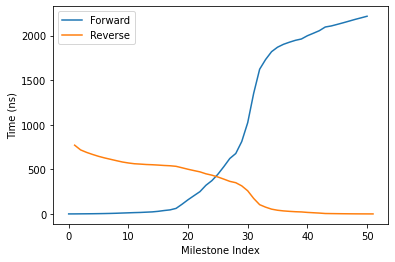

In [51]:
forwardTau=forwardAnalysisData['tauVec']
reverseTau=reverseAnalysisData['tauVec']

dt=1.0/1000.

forwardMFPT=np.max(forwardTau)-forwardTau
reverseMFPT=np.max(reverseTau)-reverseTau

milestone_MFPT_data=pd.DataFrame({
    'MilestoneIndex':np.arange(len(forwardMFPT)),
    'Forward':forwardMFPT*dt
})
milestone_MFPT_data['Reverse']=np.flip(reverseMFPT*dt)
milestone_MFPT_data.to_csv('milestone_MFPT_data.cAMP.csv',index=False)
display(milestone_MFPT_data.head())

sns.lineplot(
    x=np.arange(len(forwardMFPT)),
    y=forwardMFPT*dt,
    label='Forward'
)
sns.lineplot(
    x=len(reverseMFPT)-np.arange(len(reverseMFPT)),
    y=reverseMFPT*dt,
    label='Reverse'
)
plt.ylabel('Time (ns)')
plt.xlabel('Milestone Index')
plt.show()

In [6]:
countGroups=milestoneData[['Group','Rep','Window','Frame','Escape_Vector']].groupby(
    ['Group','Rep','Window'])

countFrames=[]
for countGroup in tqbar(countGroups):
    countGroupName,countGroupData=countGroup
    
    countFrame=countGroupData.copy()
    countFrame['Count']=(countFrame['Escape_Vector']>=0)*1.
    countFrame['Cumulative_Time']=(countFrame['Escape_Vector']>=0).cumsum()
    countFrame['FrameNumber']=np.arange(len(countFrame))
    countFrames.append(countFrame)
countFrame=pd.concat(countFrames)
countFrame.head()

/home/wesley/.local/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



,Group,Rep,Window,Frame,Escape_Vector,Count,Cumulative_Time,FrameNumber
0,0,1,0,0,0,1.0,1,0
1,0,1,0,1,0,1.0,2,1
2,0,1,0,2,0,1.0,3,2
3,0,1,0,3,0,1.0,4,3
4,0,1,0,4,0,1.0,5,4


In [7]:
(countFrame.query('(Group==0) and (Window==2) and (Rep==1) ').Escape_Vector == 1).sum()

192

,Group,Rep,Window,Frame,Escape_Vector,Count,Cumulative_Time,FrameNumber
0,0,1,0,0,0,1.0,1,0
1,0,1,0,1,0,1.0,2,1
2,0,1,0,2,0,1.0,3,2
3,0,1,0,3,0,1.0,4,3
4,0,1,0,4,0,1.0,5,4


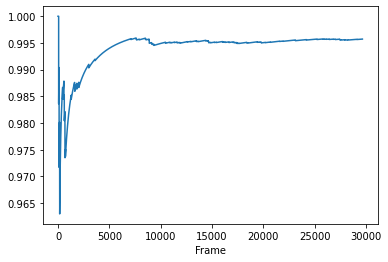

In [8]:
testDat=countFrame.query(
    '(Group==0) and (Rep==1) and (Window==0)'
)
display(testDat.head())
sns.lineplot(x=testDat.Frame,y=testDat.Cumulative_Time/(testDat.Frame+1.))
plt.show()

In [9]:
%%capture --no-stdout --no-display
groupCol='Group'
windowCol='Window'
repCol='Rep'
timeCol='Frame'
groupingColumns=[groupCol,windowCol,repCol]
convergenceGroupings=milestoneData.groupby(groupingColumns)

Ri_frames=[]
Nij_frames=[]

milestoneBins=np.sort(np.unique(np.concatenate(
    [milestoneData['Window'].to_numpy(),milestoneData['X_Index'].to_numpy()]
)))
binMapFrame=pd.DataFrame({
    'binInd':np.arange(len(milestoneBins)),
    'binName':milestoneBins
})

with tqbar(convergenceGroupings) as gbar:
    for convergenceGroup in gbar:
        convergenceGroupName,convergenceGroupData=convergenceGroup
        
        binIndToName=binMapFrame.set_index('binName')
        binNameToInd=binMapFrame.set_index('binInd')
        
        countData=convergenceGroupData.sort_values(timeCol)
        
        ReentryVector=countData[
            [timeCol,'Reentry_Vector']
        ].set_index(timeCol)['Reentry_Vector']
        EscapeVector=countData[
            [timeCol,'Escape_Vector']
        ].set_index(timeCol)['Escape_Vector']
        
        Ri_count=np.array(
            [
                (
                    (ReentryVector==binName)*1.
                ) for binInd,binName in binMapFrame[['binInd','binName']].to_numpy()
            ],
            dtype=int
        )
        Ri_array=np.array(
            [
                (
                    ReentryVector==binName
                ).cumsum() for binInd,binName in binMapFrame[['binInd','binName']].to_numpy()
            ],
            dtype=int
        )
        
        Nij_count=np.array(
            [
                [
                    (
                        (ReentryVector==binName_i) * \
                        (EscapeVector==binName_j)
                    ) for binInd_j,binName_j in binMapFrame[['binInd','binName']].to_numpy()
                ] for binInd_i,binName_i in binMapFrame[['binInd','binName']].to_numpy()
            ],
            dtype=int
        )
        Nij_array=np.array(
            [
                [
                    (
                        (ReentryVector==binName_i) * \
                        (EscapeVector==binName_j)
                    ).cumsum() for binInd_j,binName_j in binMapFrame[['binInd','binName']].to_numpy()
                ] for binInd_i,binName_i in binMapFrame[['binInd','binName']].to_numpy()
            ],
            dtype=int
        )
        
        Ri_nzInds=np.nonzero(Ri_array) #(binNames,Frames)
        Ri_Frame=pd.DataFrame({
            'Group':[convergenceGroupName[0]]*len(Ri_nzInds[0]),
            'Window':[convergenceGroupName[1]]*len(Ri_nzInds[0]),
            'Rep':[convergenceGroupName[2]]*len(Ri_nzInds[0]),
            'Frame':Ri_nzInds[1],
            'BinName':Ri_nzInds[0],
            'Count':Ri_count[Ri_nzInds],
            'Cumulative_Count':Ri_array[Ri_nzInds]
        })
        Ri_frames.append(Ri_Frame.copy())
        
        Nij_nzInds=np.nonzero(Nij_array) #(binNames_i,binNames_j,Frames)
        Nij_Frame=pd.DataFrame({
            'Group':[convergenceGroupName[0]]*len(Nij_nzInds[0]),
            'Window':[convergenceGroupName[1]]*len(Nij_nzInds[0]),
            'Rep':[convergenceGroupName[2]]*len(Nij_nzInds[0]),
            'Frame':Nij_nzInds[2],
            'BinName_i':Nij_nzInds[0],
            'BinName_j':Nij_nzInds[1],
            'Count':Nij_count[Nij_nzInds],
            'Cumulative_Count':Nij_array[Nij_nzInds]
        })
        Nij_frames.append(Nij_Frame.copy())
        
Ri_Frame=pd.concat(Ri_frames)
print('Ri alpha Convergence Data Frame')
display(Ri_Frame.head())
Nij_Frame=pd.concat(Nij_frames)
print('Nij alpha Convergence Data Frame')
display(Nij_Frame)


Ri alpha Convergence Data Frame


,Group,Window,Rep,Frame,BinName,Count,Cumulative_Count
0,0,0,1,54,1,1,1
1,0,0,1,55,1,1,2
2,0,0,1,56,1,1,3
3,0,0,1,57,1,1,4
4,0,0,1,58,1,1,5


Nij alpha Convergence Data Frame


,Group,Window,Rep,Frame,BinName_i,BinName_j,Count,Cumulative_Count
0,0,0,1,54,1,0,1,1
1,0,0,1,55,1,0,1,2
2,0,0,1,56,1,0,1,3
3,0,0,1,57,1,0,1,4
4,0,0,1,58,1,0,1,5
...,...,...,...,...,...,...,...,...
16496,0,52,5,8252,51,52,1,8008
16497,0,52,5,8253,51,52,1,8009
16498,0,52,5,8254,51,52,1,8010
16499,0,52,5,8255,51,52,1,8011


In [10]:
import ipywidgets as widgets
from ipywidgets import interact

In [11]:
(Nij_Frame.query(
    '(Group==0) and (Window==56) and (Rep==1)'
).BinName_j == 1).sum()

0

In [12]:
display(countFrame.head())
Nij_Frame.head()

,Group,Rep,Window,Frame,Escape_Vector,Count,Cumulative_Time,FrameNumber
0,0,1,0,0,0,1.0,1,0
1,0,1,0,1,0,1.0,2,1
2,0,1,0,2,0,1.0,3,2
3,0,1,0,3,0,1.0,4,3
4,0,1,0,4,0,1.0,5,4


,Group,Window,Rep,Frame,BinName_i,BinName_j,Count,Cumulative_Count
0,0,0,1,54,1,0,1,1
1,0,0,1,55,1,0,1,2
2,0,0,1,56,1,0,1,3
3,0,0,1,57,1,0,1,4
4,0,0,1,58,1,0,1,5


In [13]:
display(Ri_Frame.head())
display(Nij_Frame.head())
display(countFrame.head())

,Group,Window,Rep,Frame,BinName,Count,Cumulative_Count
0,0,0,1,54,1,1,1
1,0,0,1,55,1,1,2
2,0,0,1,56,1,1,3
3,0,0,1,57,1,1,4
4,0,0,1,58,1,1,5


,Group,Window,Rep,Frame,BinName_i,BinName_j,Count,Cumulative_Count
0,0,0,1,54,1,0,1,1
1,0,0,1,55,1,0,1,2
2,0,0,1,56,1,0,1,3
3,0,0,1,57,1,0,1,4
4,0,0,1,58,1,0,1,5


,Group,Rep,Window,Frame,Escape_Vector,Count,Cumulative_Time,FrameNumber
0,0,1,0,0,0,1.0,1,0
1,0,1,0,1,0,1.0,2,1
2,0,1,0,2,0,1.0,3,2
3,0,1,0,3,0,1.0,4,3
4,0,1,0,4,0,1.0,5,4


In [14]:
Nij_Frame.to_csv('Nij_Data.cAMP.csv',index=False)
Ri_Frame.to_csv('Ri_Data.cAMP.csv',index=False)
countFrame.to_csv('Count_Data.cAMP.csv',index=False)

## Start here if you already computed Nij and Ri convergence

In [19]:
#Load convergence data
Nij_Frame=pd.read_csv('Nij_Data.cAMP.csv')
display(Nij_Frame.head())
Ri_Frame=pd.read_csv('Ri_Data.cAMP.csv')
display(Ri_Frame.head())
countFrame=pd.read_csv('Count_Data.cAMP.csv')
display(countFrame.head())

,Group,Window,Rep,Frame,BinName_i,BinName_j,Count,Cumulative_Count
0,0,0,1,54,1,0,1,1
1,0,0,1,55,1,0,1,2
2,0,0,1,56,1,0,1,3
3,0,0,1,57,1,0,1,4
4,0,0,1,58,1,0,1,5


,Group,Window,Rep,Frame,BinName,Count,Cumulative_Count
0,0,0,1,54,1,1,1
1,0,0,1,55,1,1,2
2,0,0,1,56,1,1,3
3,0,0,1,57,1,1,4
4,0,0,1,58,1,1,5


,Group,Rep,Window,Frame,Escape_Vector,Count,Cumulative_Time,FrameNumber
0,0,1,0,0,0,1.0,1,0
1,0,1,0,1,0,1.0,2,1
2,0,1,0,2,0,1.0,3,2
3,0,1,0,3,0,1.0,4,3
4,0,1,0,4,0,1.0,5,4


In [5]:
#Plot individual windows of interest
@interact
def plot_escape_data(
    window=Nij_Frame.Window.unique()
):
    subsetData=Nij_Frame.query('Window == {wnd}'.format(wnd=window))
    countSubset=countFrame.query('Window=={wnd}'.format(wnd=window))
    plotGroups=subsetData.groupby(['BinName_i','BinName_j'])
    nrow=subsetData.BinName_i.nunique()
    ncol=subsetData.BinName_j.nunique()
    fig,axs=plt.subplots(nrow,ncol)
    fig.set_figwidth(4*ncol)
    fig.set_figheight(4*nrow)
    for iPlotGroup,plotGroup in enumerate(plotGroups):
        plotGroupName,plotGroupData=plotGroup
        repGroups=plotGroupData.groupby('Rep')
        ax=axs.flatten()[iPlotGroup]
        for repGroup in repGroups:
            repGroupName,repGroupData=repGroup
            countPlotData=countSubset.query(
                'Rep=={rep}'.format(rep=repGroupName)
            ).set_index('FrameNumber')
            plotData=repGroupData.set_index('Frame')
            sns.lineplot(
                x=plotData.index.to_numpy(),
                y=plotData.Cumulative_Count.to_numpy()/countPlotData.Cumulative_Time.loc[plotData.index],
                label=repGroupName,
                alpha=.5,size=1,ax=ax
            )
        ax.set_title(plotGroupName)
    plt.tight_layout()
    plt.show()

interactive(children=(Dropdown(description='window', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14…

In [6]:
display(Nij_Frame.head())
display(countFrame.head())

,Group,Window,Rep,Frame,BinName_i,BinName_j,Count,Cumulative_Count
0,0,0,1,54,1,0,1,1
1,0,0,1,55,1,0,1,2
2,0,0,1,56,1,0,1,3
3,0,0,1,57,1,0,1,4
4,0,0,1,58,1,0,1,5


,Group,Rep,Window,Frame,Escape_Vector,Count,Cumulative_Time,FrameNumber
0,0,1,0,0,0,1.0,1,0
1,0,1,0,1,0,1.0,2,1
2,0,1,0,2,0,1.0,3,2
3,0,1,0,3,0,1.0,4,3
4,0,1,0,4,0,1.0,5,4


In [20]:
convergenceFrame=Nij_Frame.set_index([
    'Group','Rep','Window','Frame'
]).join(
    other=countFrame[['Group','Rep','Window','FrameNumber','Count','Cumulative_Time']].rename(
        columns={'FrameNumber':'Frame'}
    ).set_index(['Group','Rep','Window','Frame']),
    how='outer',
    rsuffix='_Time'
).reset_index().fillna(0)
convergenceFrame.head()

,Group,Rep,Window,Frame,BinName_i,BinName_j,Count,Cumulative_Count,Count_Time,Cumulative_Time
0,0,1,0,0,0.0,0.0,0.0,0.0,1.0,1
1,0,1,0,1,0.0,0.0,0.0,0.0,1.0,2
2,0,1,0,2,0.0,0.0,0.0,0.0,1.0,3
3,0,1,0,3,0.0,0.0,0.0,0.0,1.0,4
4,0,1,0,4,0.0,0.0,0.0,0.0,1.0,5


In [21]:
convergenceFrame['Frequency']=convergenceFrame['Cumulative_Count']/\
    convergenceFrame['Cumulative_Time']
convergenceFrame.head()

,Group,Rep,Window,Frame,BinName_i,BinName_j,Count,Cumulative_Count,Count_Time,Cumulative_Time,Frequency
0,0,1,0,0,0.0,0.0,0.0,0.0,1.0,1,0.0
1,0,1,0,1,0.0,0.0,0.0,0.0,1.0,2,0.0
2,0,1,0,2,0.0,0.0,0.0,0.0,1.0,3,0.0
3,0,1,0,3,0.0,0.0,0.0,0.0,1.0,4,0.0
4,0,1,0,4,0.0,0.0,0.0,0.0,1.0,5,0.0


In [22]:
convergenceMeanFrame=convergenceFrame.drop(
    columns=['Rep','Frequency','Cumulative_Count','Cumulative_Time']
).groupby(
    ['Group','Window','Frame','BinName_i','BinName_j']
).aggregate(
    sum
).reset_index()
#convergenceMeanFrame.groupby(
#    ['Group','Window','Frame','BinName_i','BinName_j']
#)['Count'].cumsum().reset_index()
convergenceMeanFrame.head()

,Group,Window,Frame,BinName_i,BinName_j,Count,Count_Time
0,0,0,0,0.0,0.0,0.0,6.0
1,0,0,1,0.0,0.0,0.0,6.0
2,0,0,2,0.0,0.0,0.0,5.0
3,0,0,2,1.0,0.0,1.0,1.0
4,0,0,3,0.0,0.0,0.0,5.0


In [23]:
convergenceMeanFrame['Cumulative_Count']=convergenceMeanFrame.sort_values('Frame').groupby(
    ['Group','Window','BinName_i','BinName_j']
)['Count'].cumsum()
convergenceMeanFrame['Cumulative_Time']=convergenceMeanFrame.sort_values('Frame').groupby(
    ['Group','Window','BinName_i','BinName_j']
)['Count_Time'].cumsum()
convergenceMeanFrame['MeanFrequency']=convergenceMeanFrame['Cumulative_Count']/\
    convergenceMeanFrame['Cumulative_Time']
convergenceMeanFrame.sort_values(['Group','Window','BinName_i','BinName_j','Frame']).tail(n=18)

,Group,Window,Frame,BinName_i,BinName_j,Count,Count_Time,Cumulative_Count,Cumulative_Time,MeanFrequency
28001761,0,52,11224,51.0,52.0,1.0,1.0,39431.0,40578.0,0.971733
28001763,0,52,11225,51.0,52.0,1.0,1.0,39432.0,40579.0,0.971734
28001765,0,52,11226,51.0,52.0,1.0,1.0,39433.0,40580.0,0.971735
28001767,0,52,11227,51.0,52.0,1.0,1.0,39434.0,40581.0,0.971736
28001769,0,52,11228,51.0,52.0,1.0,1.0,39435.0,40582.0,0.971736
28001771,0,52,11229,51.0,52.0,1.0,1.0,39436.0,40583.0,0.971737
28001773,0,52,11230,51.0,52.0,1.0,1.0,39437.0,40584.0,0.971738
28001775,0,52,11231,51.0,52.0,1.0,1.0,39438.0,40585.0,0.971738
28001777,0,52,11232,51.0,52.0,1.0,1.0,39439.0,40586.0,0.971739
28001779,0,52,11233,51.0,52.0,1.0,1.0,39440.0,40587.0,0.971740


In [24]:
rmsfGroups=convergenceMeanFrame.groupby(['Group','Window','BinName_i','BinName_j'])
rmsfFrames=[]

for rmsfGroup in tqbar(rmsfGroups):
    rmsfGroupName,rmsfGroupData=rmsfGroup
    rmsfFrame=rmsfGroupData[['Group','Window','BinName_i','BinName_j','Frame','MeanFrequency']]
    rmsfFrame['RMSD']=rmsfFrame[['Frame','MeanFrequency']].sort_values('Frame').rolling(
        window=10000,min_periods=5000,on='Frame',center=True,
        #win_type='bartlett',
    ).std().fillna(0)['MeanFrequency']
    rmsfFrames.append(rmsfFrame.copy())
windowedRMSDFrame=pd.concat(rmsfFrames)
windowedRMSDFrame=windowedRMSDFrame.sort_values(['Group','Window','BinName_i','BinName_j','Frame'])
windowedRMSDFrame.iloc[-16020:-16000]

/home/wesley/.local/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



/home/wesley/.local/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Group,Window,BinName_i,BinName_j,Frame,MeanFrequency,RMSD
27992238,0,52,51.0,51.0,6463,0.029273,0.000329
27992240,0,52,51.0,51.0,6464,0.029269,0.000329
27992242,0,52,51.0,51.0,6465,0.029265,0.000329
27992244,0,52,51.0,51.0,6466,0.029261,0.000329
27992246,0,52,51.0,51.0,6467,0.029258,0.000329
27992248,0,52,51.0,51.0,6468,0.029254,0.000329
27992250,0,52,51.0,51.0,6469,0.029250,0.000329
27992252,0,52,51.0,51.0,6470,0.029246,0.000329
27992254,0,52,51.0,51.0,6471,0.029242,0.000328
27992256,0,52,51.0,51.0,6472,0.029238,0.000328


In [25]:
windowedRMSDFrame.iloc[-27020:-27000]

,Group,Window,BinName_i,BinName_j,Frame,MeanFrequency,RMSD
27952646,0,51,52.0,52.0,13727,0.018778,0.000215
27952652,0,51,52.0,52.0,13728,0.018777,0.000215
27952658,0,51,52.0,52.0,13729,0.018776,0.000215
27952664,0,51,52.0,52.0,13730,0.018774,0.000215
27952670,0,51,52.0,52.0,13731,0.018773,0.000215
27952676,0,51,52.0,52.0,13732,0.018771,0.000215
27952682,0,51,52.0,52.0,13733,0.018770,0.000215
27952688,0,51,52.0,52.0,13734,0.018769,0.000215
27952694,0,51,52.0,52.0,13735,0.018767,0.000215
27952700,0,51,52.0,52.0,13736,0.018766,0.000215


In [26]:
display(windowedRMSDFrame.sort_values(['Group','Window','BinName_i','BinName_j','Frame']).iloc[-16020:-16000])
convergenceMeanFrame.sort_values(['Group','Window','BinName_i','BinName_j','Frame']).iloc[-16020:-16000]

,Group,Window,BinName_i,BinName_j,Frame,MeanFrequency,RMSD
27992238,0,52,51.0,51.0,6463,0.029273,0.000329
27992240,0,52,51.0,51.0,6464,0.029269,0.000329
27992242,0,52,51.0,51.0,6465,0.029265,0.000329
27992244,0,52,51.0,51.0,6466,0.029261,0.000329
27992246,0,52,51.0,51.0,6467,0.029258,0.000329
27992248,0,52,51.0,51.0,6468,0.029254,0.000329
27992250,0,52,51.0,51.0,6469,0.029250,0.000329
27992252,0,52,51.0,51.0,6470,0.029246,0.000329
27992254,0,52,51.0,51.0,6471,0.029242,0.000328
27992256,0,52,51.0,51.0,6472,0.029238,0.000328


,Group,Window,Frame,BinName_i,BinName_j,Count,Count_Time,Cumulative_Count,Cumulative_Time,MeanFrequency
27992238,0,52,6463,51.0,51.0,1.0,4.0,893.0,30506.0,0.029273
27992240,0,52,6464,51.0,51.0,0.0,4.0,893.0,30510.0,0.029269
27992242,0,52,6465,51.0,51.0,0.0,4.0,893.0,30514.0,0.029265
27992244,0,52,6466,51.0,51.0,0.0,4.0,893.0,30518.0,0.029261
27992246,0,52,6467,51.0,51.0,0.0,4.0,893.0,30522.0,0.029258
27992248,0,52,6468,51.0,51.0,0.0,4.0,893.0,30526.0,0.029254
27992250,0,52,6469,51.0,51.0,0.0,4.0,893.0,30530.0,0.029250
27992252,0,52,6470,51.0,51.0,0.0,4.0,893.0,30534.0,0.029246
27992254,0,52,6471,51.0,51.0,0.0,4.0,893.0,30538.0,0.029242
27992256,0,52,6472,51.0,51.0,0.0,4.0,893.0,30542.0,0.029238


In [27]:
#windowedRMSDFrame=windowedRMSDFrame.drop(columns=['level_4'])
rmsdPlotData=convergenceMeanFrame.set_index(
    ['Group','Window','BinName_i','BinName_j','Frame']
).join(
    other=windowedRMSDFrame[
        ['Group','Window','BinName_i','BinName_j','Frame','RMSD']
    ].set_index(
        ['Group','Window','BinName_i','BinName_j','Frame']
    ),
    how='left',
).reset_index().fillna(-1)
rmsdPlotData.sort_values(['Group','Window','BinName_i','BinName_j','Frame']).iloc[-16020:-16000]

,Group,Window,BinName_i,BinName_j,Frame,Count,Count_Time,Cumulative_Count,Cumulative_Time,MeanFrequency,RMSD
27992238,0,52,51.0,51.0,6463,1.0,4.0,893.0,30506.0,0.029273,0.000329
27992240,0,52,51.0,51.0,6464,0.0,4.0,893.0,30510.0,0.029269,0.000329
27992242,0,52,51.0,51.0,6465,0.0,4.0,893.0,30514.0,0.029265,0.000329
27992244,0,52,51.0,51.0,6466,0.0,4.0,893.0,30518.0,0.029261,0.000329
27992246,0,52,51.0,51.0,6467,0.0,4.0,893.0,30522.0,0.029258,0.000329
27992248,0,52,51.0,51.0,6468,0.0,4.0,893.0,30526.0,0.029254,0.000329
27992250,0,52,51.0,51.0,6469,0.0,4.0,893.0,30530.0,0.029250,0.000329
27992252,0,52,51.0,51.0,6470,0.0,4.0,893.0,30534.0,0.029246,0.000329
27992254,0,52,51.0,51.0,6471,0.0,4.0,893.0,30538.0,0.029242,0.000328
27992256,0,52,51.0,51.0,6472,0.0,4.0,893.0,30542.0,0.029238,0.000328


In [28]:
rmsdPlotData['RelativeRMSD']=rmsdPlotData['RMSD']/rmsdPlotData['MeanFrequency']
#rmsdPlotData=rmsdPlotData.fillna(0)
rmsdPlotData.sort_values(['Group','Window','BinName_i','BinName_j','Frame']).tail(n=18)

,Group,Window,BinName_i,BinName_j,Frame,Count,Count_Time,Cumulative_Count,Cumulative_Time,MeanFrequency,RMSD,RelativeRMSD
28001761,0,52,51.0,52.0,11224,1.0,1.0,39431.0,40578.0,0.971733,0.000302,0.000311
28001763,0,52,51.0,52.0,11225,1.0,1.0,39432.0,40579.0,0.971734,0.000302,0.000311
28001765,0,52,51.0,52.0,11226,1.0,1.0,39433.0,40580.0,0.971735,0.000302,0.000311
28001767,0,52,51.0,52.0,11227,1.0,1.0,39434.0,40581.0,0.971736,0.000302,0.000311
28001769,0,52,51.0,52.0,11228,1.0,1.0,39435.0,40582.0,0.971736,0.000302,0.000311
28001771,0,52,51.0,52.0,11229,1.0,1.0,39436.0,40583.0,0.971737,0.000302,0.000311
28001773,0,52,51.0,52.0,11230,1.0,1.0,39437.0,40584.0,0.971738,0.000302,0.000310
28001775,0,52,51.0,52.0,11231,1.0,1.0,39438.0,40585.0,0.971738,0.000302,0.000310
28001777,0,52,51.0,52.0,11232,1.0,1.0,39439.0,40586.0,0.971739,0.000302,0.000310
28001779,0,52,51.0,52.0,11233,1.0,1.0,39440.0,40587.0,0.971740,0.000301,0.000310


In [29]:
@interact
def plot_escape_data(
    window=rmsdPlotData.Window.unique()
):
    display('Generating Plots')
    subsetData=rmsdPlotData.query(
        'Window == {wnd}'.format(wnd=window)
    ).query('not ((BinName_i == 0) and (BinName_j == 0))')
    plotGroups=subsetData.groupby(['BinName_i','BinName_j'])
    nrow=subsetData.BinName_i.nunique()
    ncol=subsetData.BinName_j.nunique()
    fig,axs=plt.subplots(nrow,ncol)
    fig.set_figwidth(3*ncol)
    fig.set_figheight(2*nrow)
    maxFreqN=subsetData.query('abs(BinName_i - BinName_j)!=1')['MeanFrequency'].quantile(q=.995)*1.1
    maxFreqR=subsetData.query('abs(BinName_i - BinName_j)==1')['MeanFrequency'].max()
    for iPlotGroup,plotGroup in enumerate(plotGroups):
        plotGroupName,plotGroupData=plotGroup
        plotData=plotGroupData.set_index('Frame')
        #display(plotGroupData.iloc[-6020:-6000])
        ax=axs.flatten()[iPlotGroup]
        sns.lineplot(
            x=plotGroupData.index.to_numpy()/1000.,
            y=plotGroupData['MeanFrequency'].to_numpy(),
            ax=ax
        )
        ax.fill_between(
            x=plotGroupData.index.to_numpy()/1000.,
            y1=(plotGroupData['MeanFrequency']-plotGroupData['RMSD']).clip(lower=1E-15).to_numpy(),
            y2=(plotGroupData['MeanFrequency']+plotGroupData['RMSD']).to_numpy(),
            #label='RMSD',
            color='grey',
            alpha=.5,
        )
        ax.set_xlabel('Time (ns)')
        if np.abs(plotGroupName[0]-plotGroupName[1])==1:
            ax.set_ylim(0,maxFreqR)
        else:
            ax.set_ylim(0,maxFreqN)
        #ax.legend()
    plt.tight_layout()
    display('Renderging Plots')
    plt.show()
    display('Done')

interactive(children=(Dropdown(description='window', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14…

In [21]:
?pd.DataFrame.rolling

Signature:
pd.DataFrame.rolling(
    self,
    window,
    min_periods=None,
    center=False,
    win_type=None,
    on=None,
    axis=0,
    closed=None,
)
Docstring:
Provide rolling window calculations.

Parameters
----------
window : int, offset, or BaseIndexer subclass
    Size of the moving window. This is the number of observations used for
    calculating the statistic. Each window will be a fixed size.

    If its an offset then this will be the time period of each window. Each
    window will be a variable sized based on the observations included in
    the time-period. This is only valid for datetimelike indexes.

    If a BaseIndexer subclass is passed, calculates the window boundaries
    based on the defined ``get_window_bounds`` method. Additional rolling
    keyword arguments, namely `min_periods`, `center`, and
    `closed` will be passed to `get_window_bounds`.
min_periods : int, default None
    Minimum number of observations in window required to have a value
    (o

In [32]:
convergenceFrame.to_csv('Convergence_Data.cAMP.csv',index=False)
convergenceMeanFrame.to_csv('Convergence_Mean_Data.cAMP.csv',index=False)
windowedRMSDFrame.to_csv('Windowed_Convergence_RMSD_Data.cAMP.csv',index=False)
rmsdPlotData.to_csv('convergence_RMSD_plotData.cAMP.csv',index=False)

# Start Here to load and plot rmsd convergence data

In [33]:
convergenceFrame=pd.read_csv('Convergence_Data.cAMP.csv')
display(convergenceFrame.head())
convergenceMeanFrame=pd.read_csv('Convergence_Mean_Data.cAMP.csv')
display(convergenceMeanFrame.head())
rmsdPlotData=pd.read_csv('convergence_RMSD_plotData.cAMP.csv')
rmsdPlotData.head()

,Group,Rep,Window,Frame,BinName_i,BinName_j,Count,Cumulative_Count,Count_Time,Cumulative_Time,Frequency
0,0,1,0,0,0.0,0.0,0.0,0.0,1.0,1,0.0
1,0,1,0,1,0.0,0.0,0.0,0.0,1.0,2,0.0
2,0,1,0,2,0.0,0.0,0.0,0.0,1.0,3,0.0
3,0,1,0,3,0.0,0.0,0.0,0.0,1.0,4,0.0
4,0,1,0,4,0.0,0.0,0.0,0.0,1.0,5,0.0


,Group,Window,Frame,BinName_i,BinName_j,Count,Count_Time,Cumulative_Count,Cumulative_Time,MeanFrequency
0,0,0,0,0.0,0.0,0.0,6.0,0.0,6.0,0.0
1,0,0,1,0.0,0.0,0.0,6.0,0.0,12.0,0.0
2,0,0,2,0.0,0.0,0.0,5.0,0.0,17.0,0.0
3,0,0,2,1.0,0.0,1.0,1.0,1.0,1.0,1.0
4,0,0,3,0.0,0.0,0.0,5.0,0.0,22.0,0.0


,Group,Window,BinName_i,BinName_j,Frame,Count,Count_Time,Cumulative_Count,Cumulative_Time,MeanFrequency,RMSD,RelativeRMSD
0,0,0,0.0,0.0,0,0.0,6.0,0.0,6.0,0.0,0.000000,NaN
1,0,0,0.0,0.0,1,0.0,6.0,0.0,12.0,0.0,0.000000,NaN
2,0,0,0.0,0.0,2,0.0,5.0,0.0,17.0,0.0,0.000000,NaN
3,0,0,1.0,0.0,2,1.0,1.0,1.0,1.0,1.0,0.011569,0.011569
4,0,0,0.0,0.0,3,0.0,5.0,0.0,22.0,0.0,0.000000,NaN


--- Window 0 ---


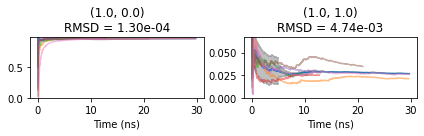

--- Window 1 ---


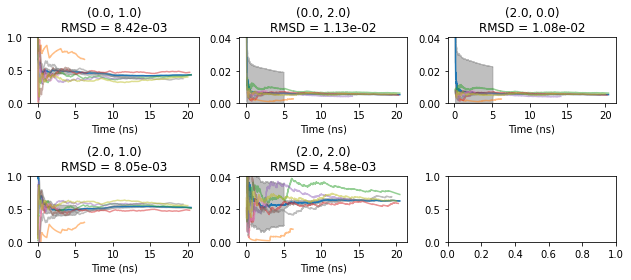

--- Window 2 ---


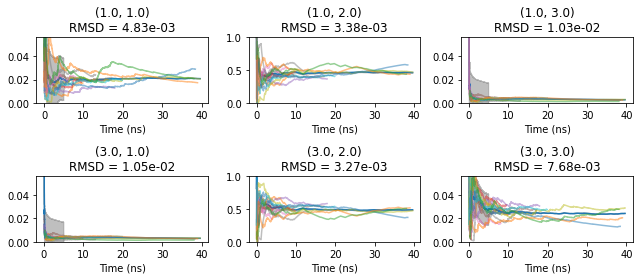

--- Window 3 ---


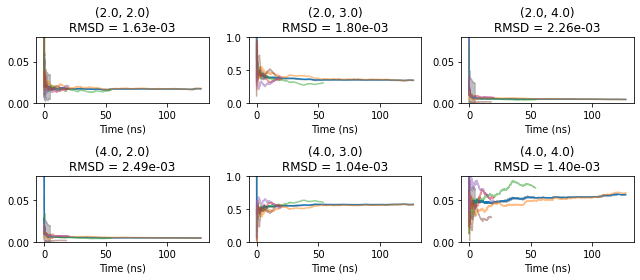

--- Window 4 ---


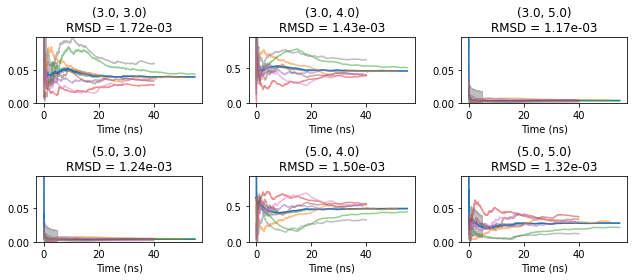

--- Window 5 ---


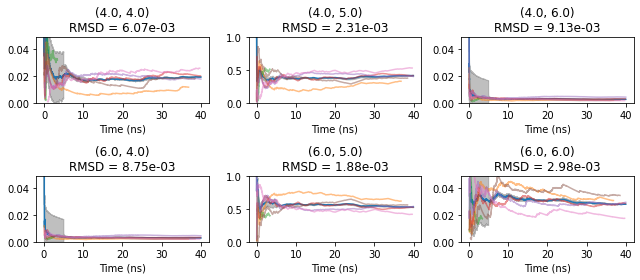

--- Window 6 ---


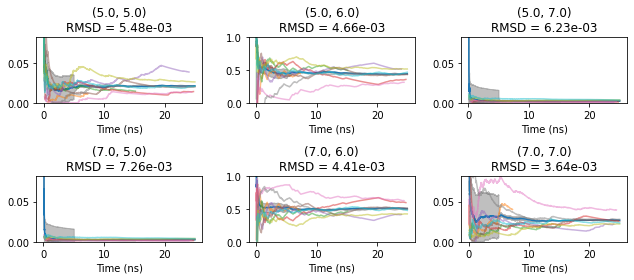

--- Window 7 ---


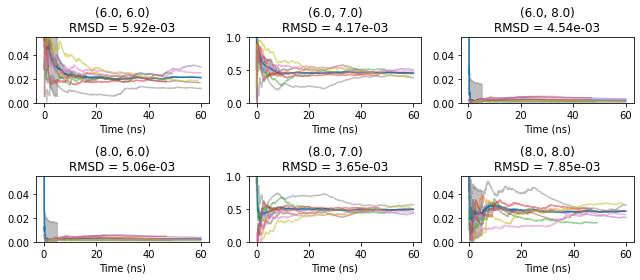

--- Window 8 ---


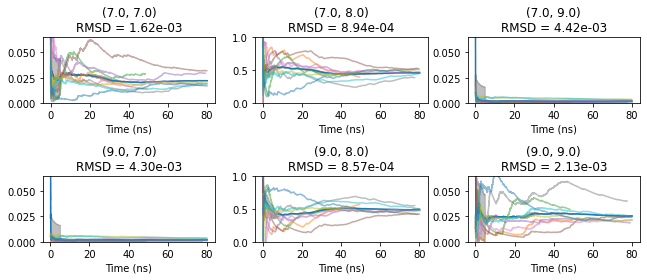

--- Window 9 ---


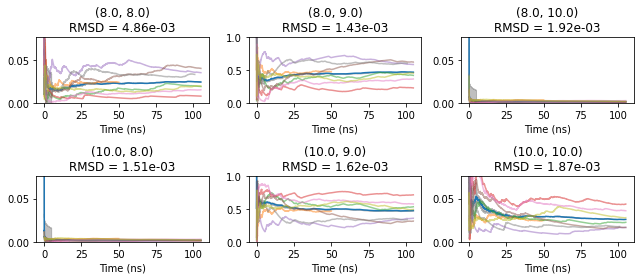

--- Window 10 ---


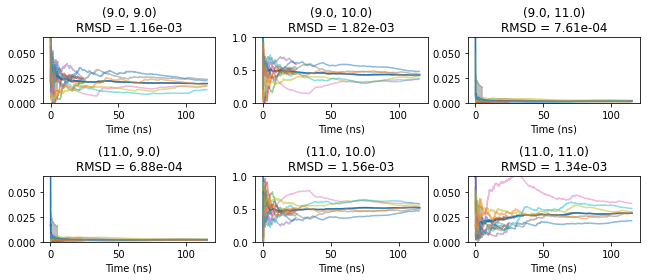

--- Window 11 ---


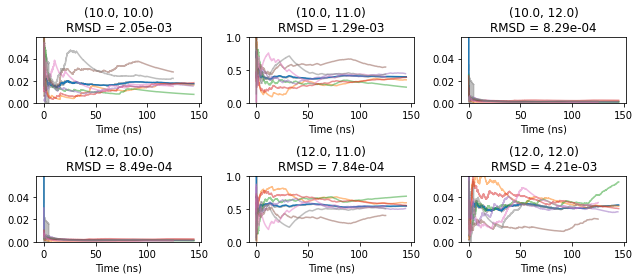

--- Window 12 ---


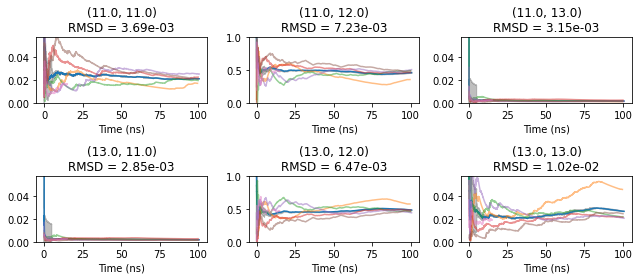

--- Window 13 ---


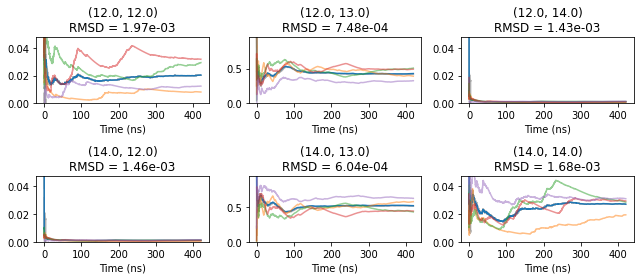

--- Window 14 ---


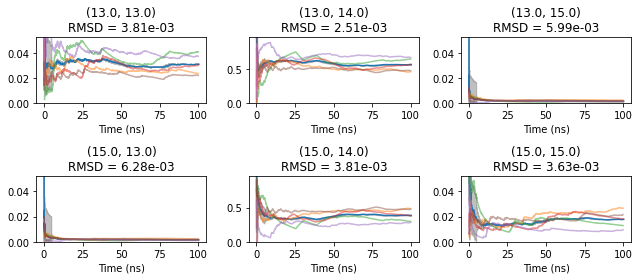

--- Window 15 ---


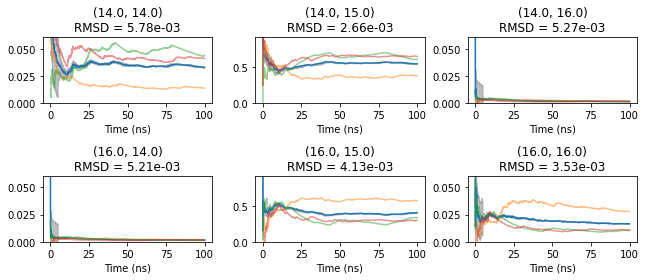

--- Window 16 ---


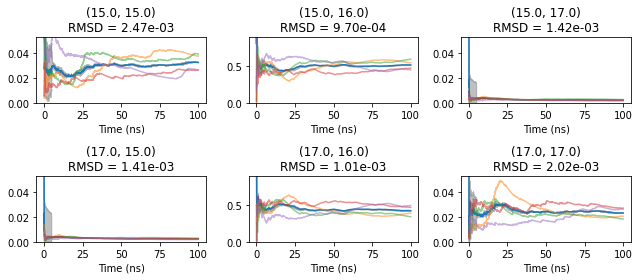

--- Window 17 ---


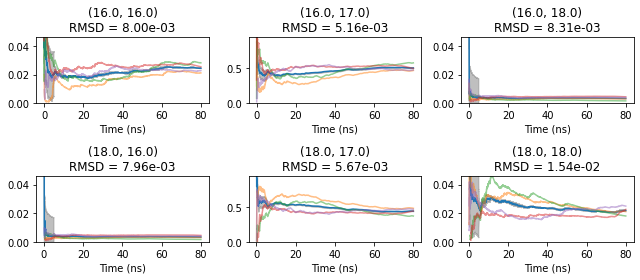

--- Window 18 ---


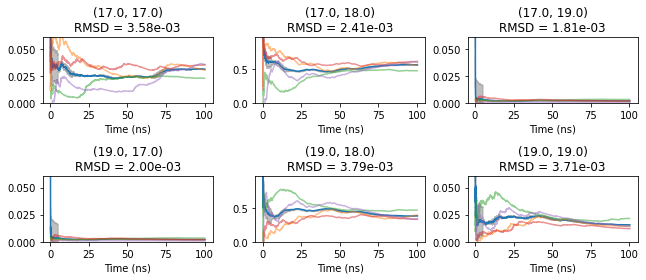

--- Window 19 ---


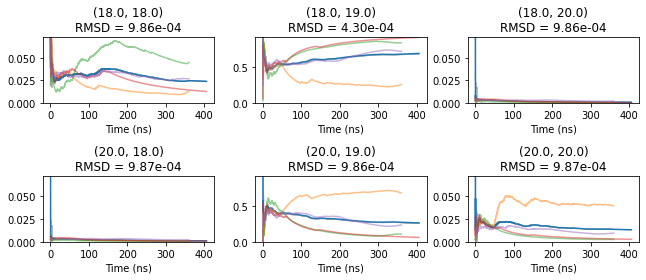

--- Window 20 ---


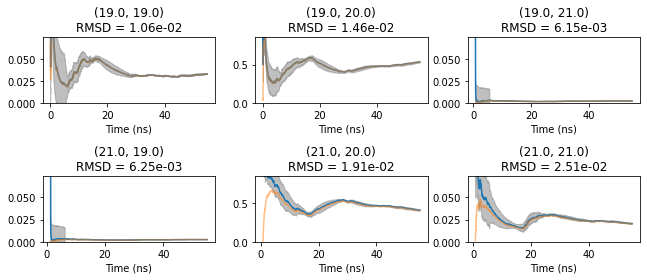

--- Window 21 ---


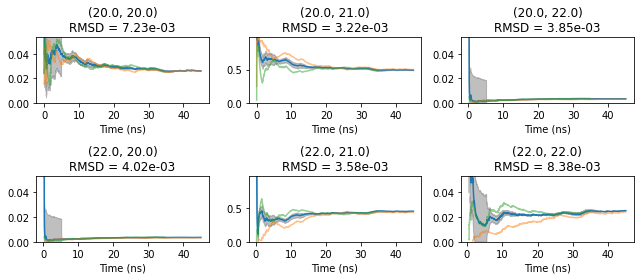

--- Window 22 ---


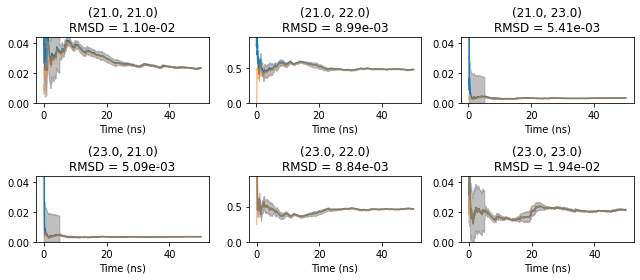

--- Window 23 ---


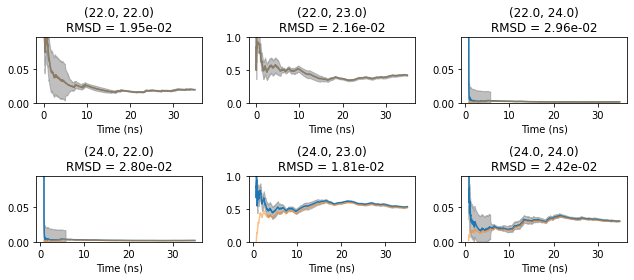

--- Window 24 ---


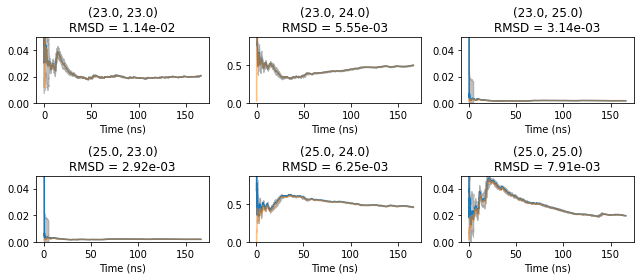

--- Window 25 ---


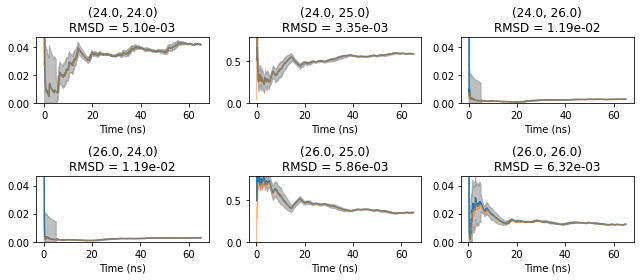

--- Window 26 ---


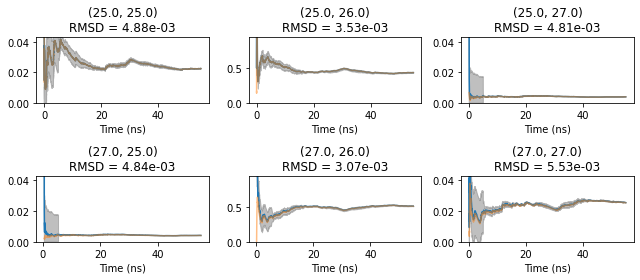

--- Window 27 ---


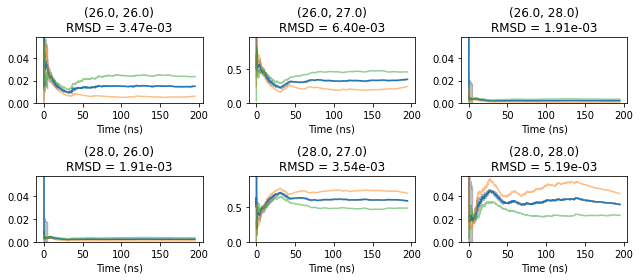

--- Window 28 ---


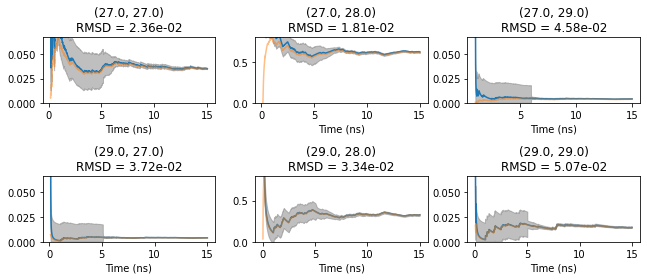

--- Window 29 ---


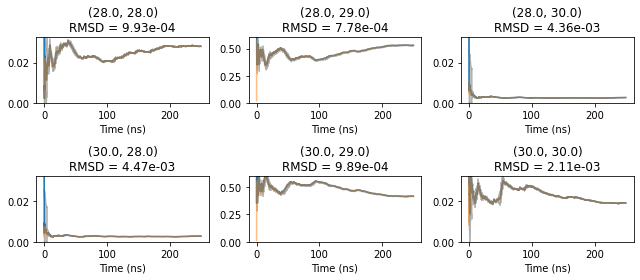

--- Window 30 ---


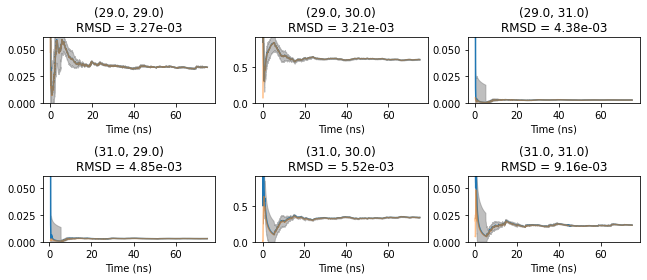

--- Window 31 ---


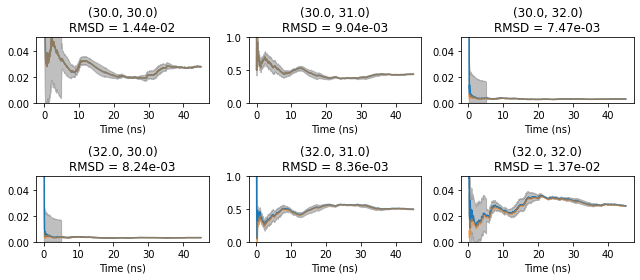

--- Window 32 ---


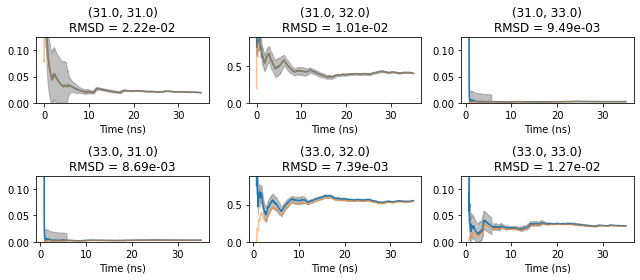

--- Window 33 ---


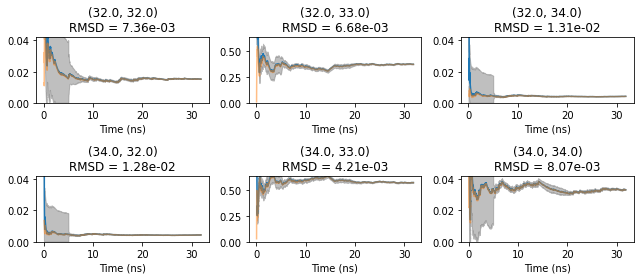

--- Window 34 ---


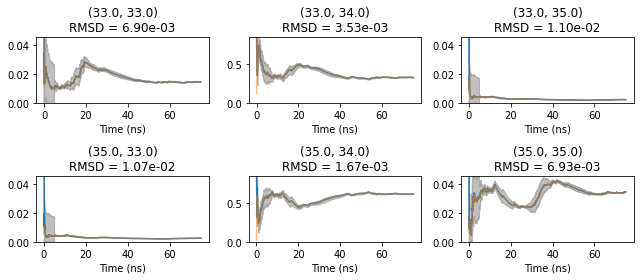

--- Window 35 ---


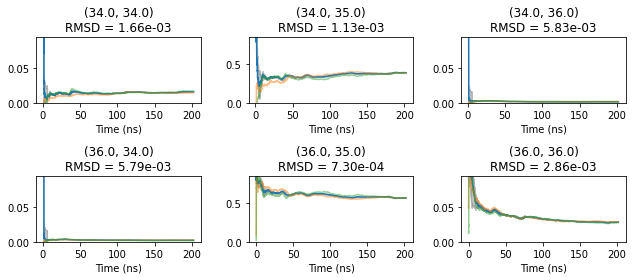

--- Window 36 ---


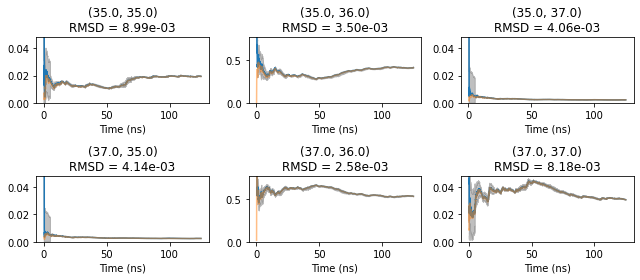

--- Window 37 ---


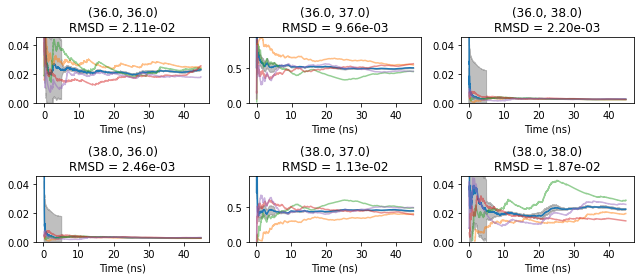

--- Window 38 ---


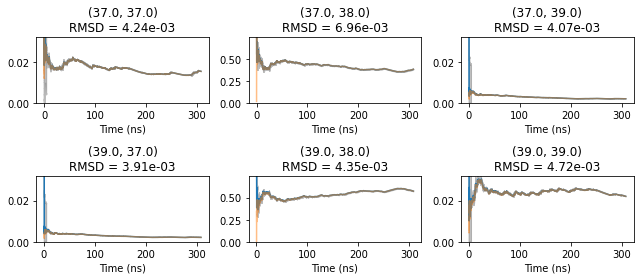

--- Window 39 ---


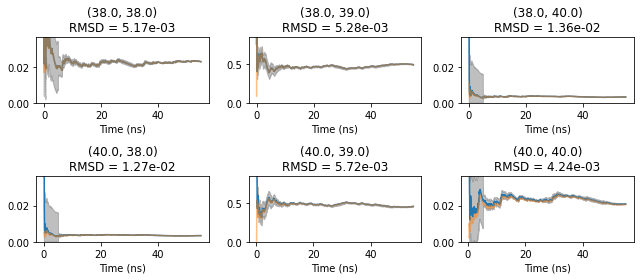

--- Window 40 ---


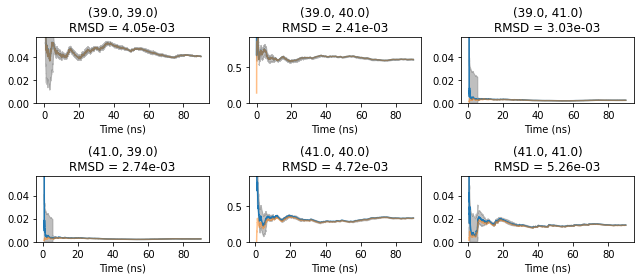

--- Window 41 ---


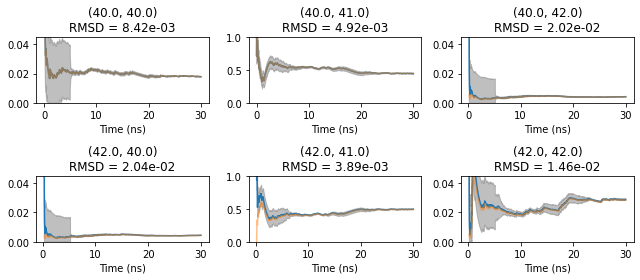

--- Window 42 ---


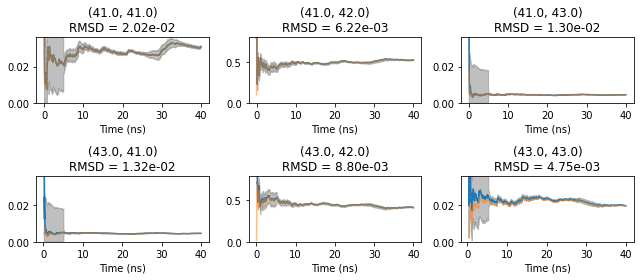

--- Window 43 ---


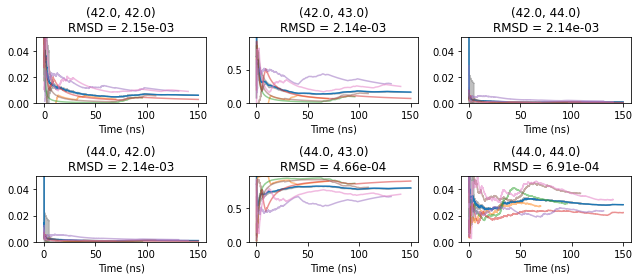

--- Window 44 ---


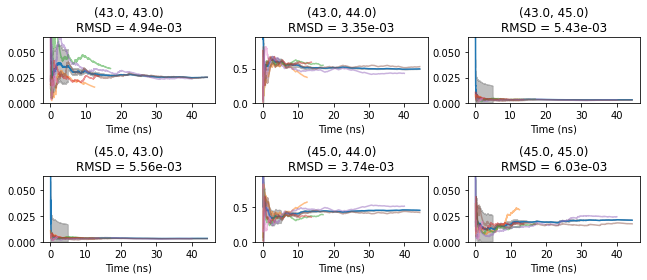

--- Window 45 ---


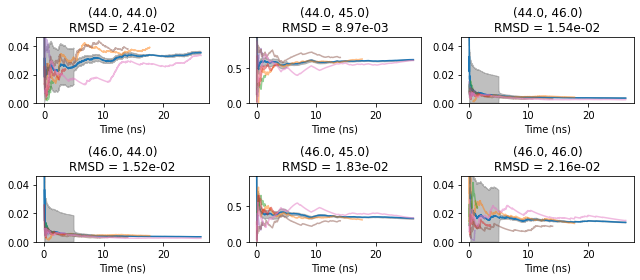

--- Window 46 ---


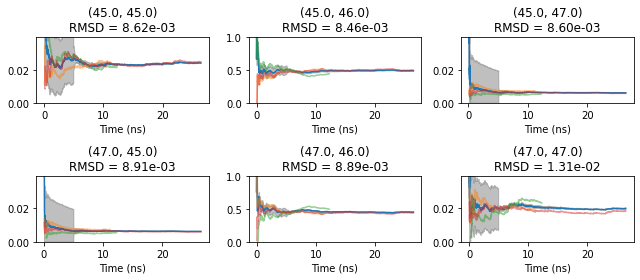

--- Window 47 ---


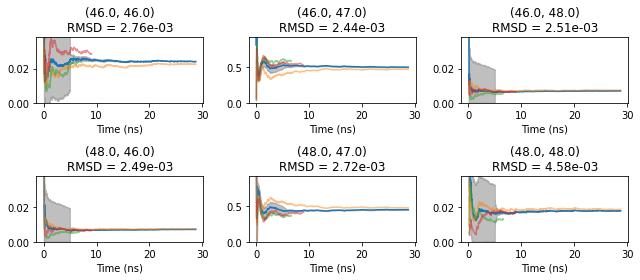

--- Window 48 ---


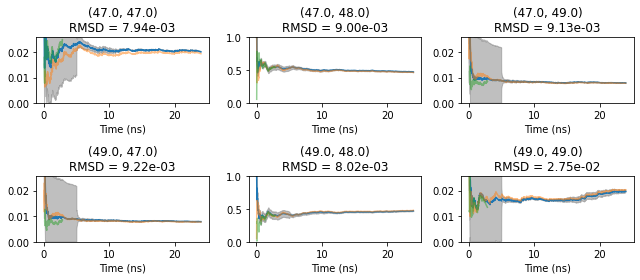

--- Window 49 ---


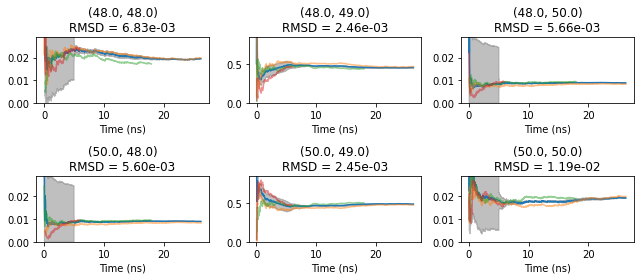

--- Window 50 ---


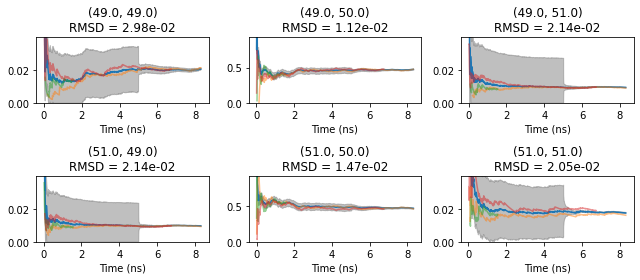

--- Window 51 ---


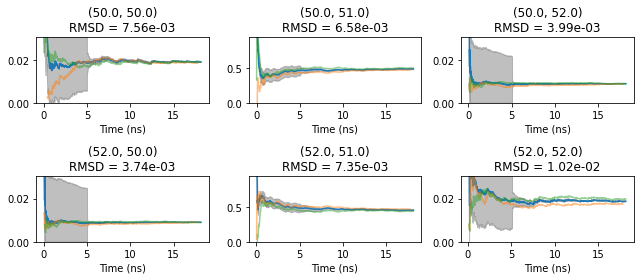

--- Window 52 ---


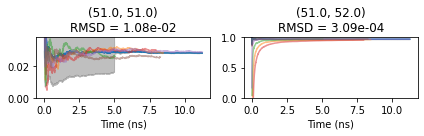

In [31]:
#Plot all windows (This will take a long time!)
for window in convergenceMeanFrame.Window.unique():
    print('--- Window {wnd} ---'.format(wnd=window))
    subsetData=convergenceFrame.query(
        'Window == {wnd}'.format(wnd=window)
    ).query('not ((BinName_i == 0) and (BinName_j == 0))')
    plotGroups=subsetData.groupby(['BinName_i','BinName_j'])
    nrow=subsetData.BinName_i.nunique()
    ncol=subsetData.BinName_j.nunique()
    fig,axs=plt.subplots(nrow,ncol)
    fig.set_figwidth(3*ncol)
    fig.set_figheight(2*nrow)
    maxFreqN=subsetData.query('abs(BinName_i - BinName_j)!=1')['Frequency'].quantile(q=.995)*1.1
    maxFreqR=subsetData.query('abs(BinName_i - BinName_j)==1')['Frequency'].max()
    for iPlotGroup,plotGroup in enumerate(plotGroups):
        plotGroupName,plotGroupData=plotGroup
        repGroups=plotGroupData.groupby('Rep')
        ax=axs.flatten()[iPlotGroup]
        aggData=rmsdPlotData.query(
            '(Window == {wnd}) and (BinName_i == {iBin}) and (BinName_j == {jBin})'.format(
                wnd=window,iBin=plotGroupName[0],jBin=plotGroupName[1])
        ).query('not ((BinName_i == 0) and (BinName_j == 0))').set_index('Frame')
        tempPlot=sns.lineplot(
            x=aggData.index.to_numpy()/1000.,
            y=aggData.MeanFrequency.to_numpy(),
            #label='Mean',
            ax=ax
        )
        #tempPlot.legend_.remove()
        ax.fill_between(
            x=aggData.index.to_numpy()/1000.,
            y1=(aggData['MeanFrequency']-aggData['RMSD']).clip(lower=1E-15).to_numpy(),
            y2=(aggData['MeanFrequency']+aggData['RMSD']).to_numpy(),
            #label='RMSD',
            color='grey',
            alpha=.5,
        )
        for repGroup in repGroups:
            repGroupName,repGroupData=repGroup
            plotData=repGroupData.set_index('Frame')
            ax.plot(
                plotData.index.to_numpy()/1000.,
                plotData['Frequency'].to_numpy(),
                alpha=.5
            )
        ax.set_title(str(plotGroupName)+'\nRMSD = %.2e'%aggData['RelativeRMSD'].iloc[-1])
        if np.abs(plotGroupName[0]-plotGroupName[1])==1:
            ax.set_ylim(0,maxFreqR)
        else:
            ax.set_ylim(0,maxFreqN)
        #ax.legend()
        ax.set_xlabel('Time (ns)')
        
    plt.tight_layout()
    plt.show()

In [ ]:
rmsdPlotData.to_csv('Nij_Convergence_RMSD_Data.cAMP.csv')

In [55]:
?plt.fill_between

Signature:
plt.fill_between(
    x,
    y1,
    y2=0,
    where=None,
    interpolate=False,
    step=None,
    *,
    data=None,
    **kwargs,
)
Docstring:
Fill the area between two horizontal curves.

The curves are defined by the points (*x*, *y1*) and (*x*,
*y2*).  This creates one or multiple polygons describing the filled
area.

You may exclude some horizontal sections from filling using *where*.

By default, the edges connect the given points directly.  Use *step*
if the filling should be a step function, i.e. constant in between
*x*.

Parameters
----------
x : array (length N)
    The x coordinates of the nodes defining the curves.

y1 : array (length N) or scalar
    The y coordinates of the nodes defining the first curve.

y2 : array (length N) or scalar, default: 0
    The y coordinates of the nodes defining the second curve.

where : array of bool (length N), optional
    Define *where* to exclude some horizontal regions from being filled.
    The filled regions are defined

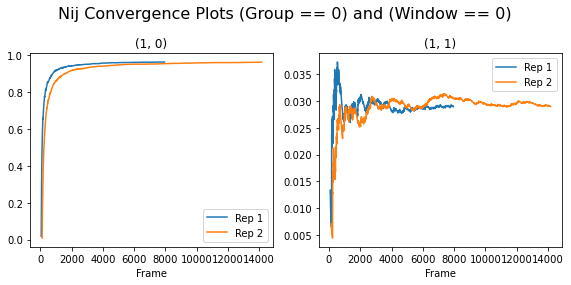

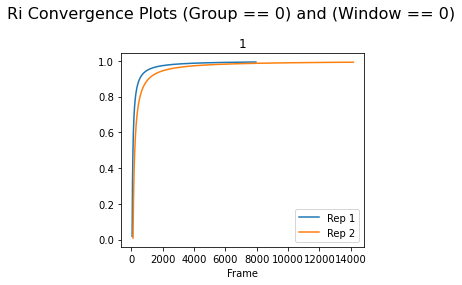

--- --- --- --- ---


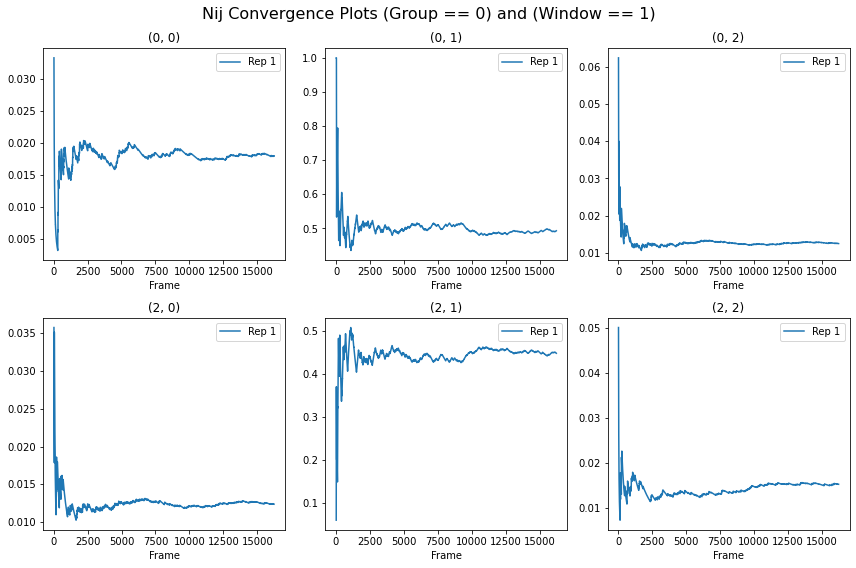

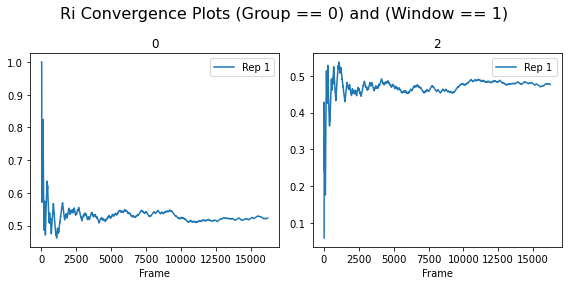

--- --- --- --- ---


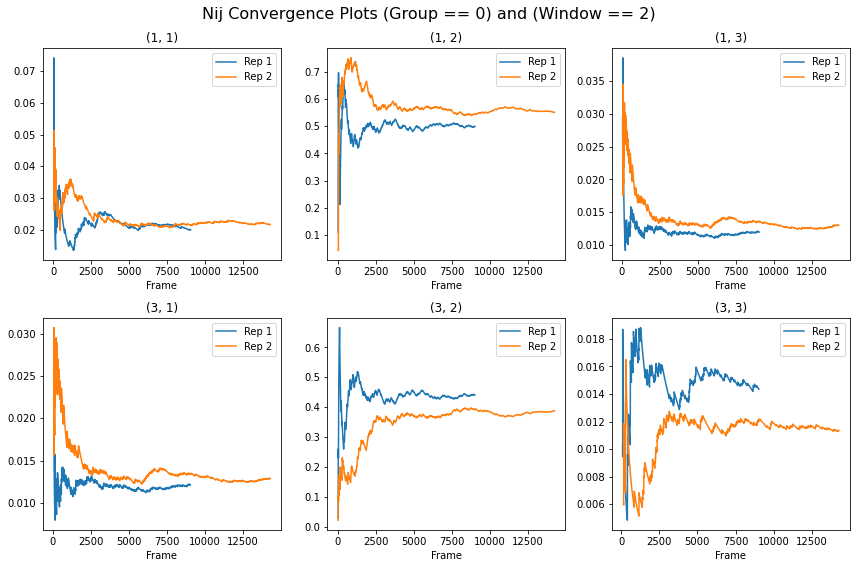

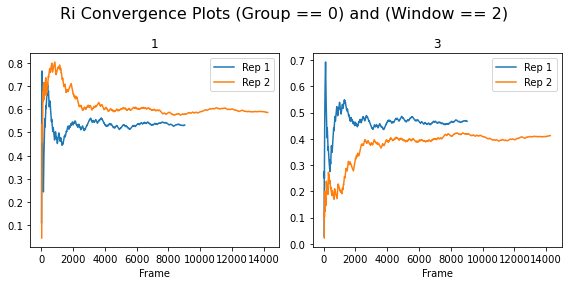

--- --- --- --- ---


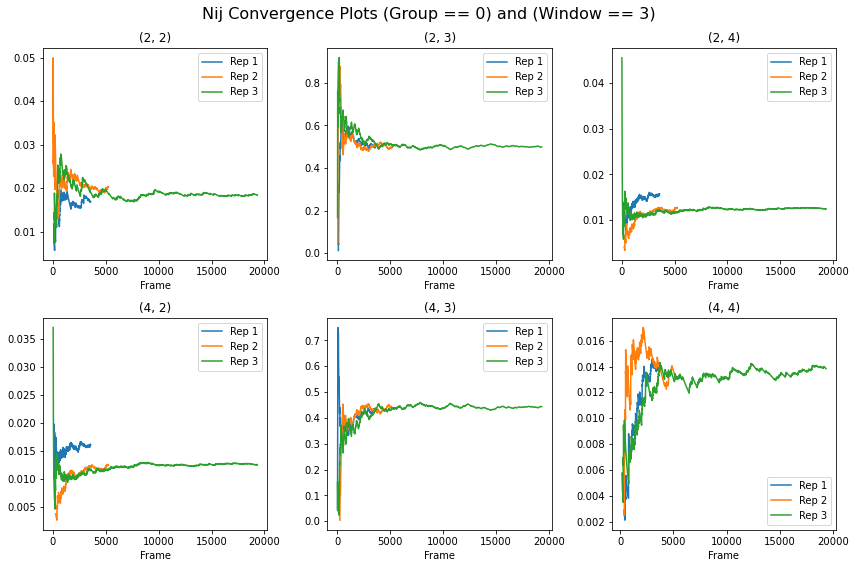

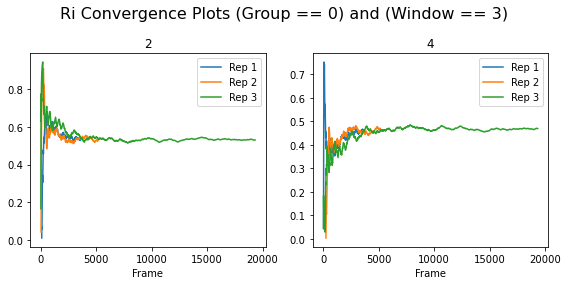

--- --- --- --- ---


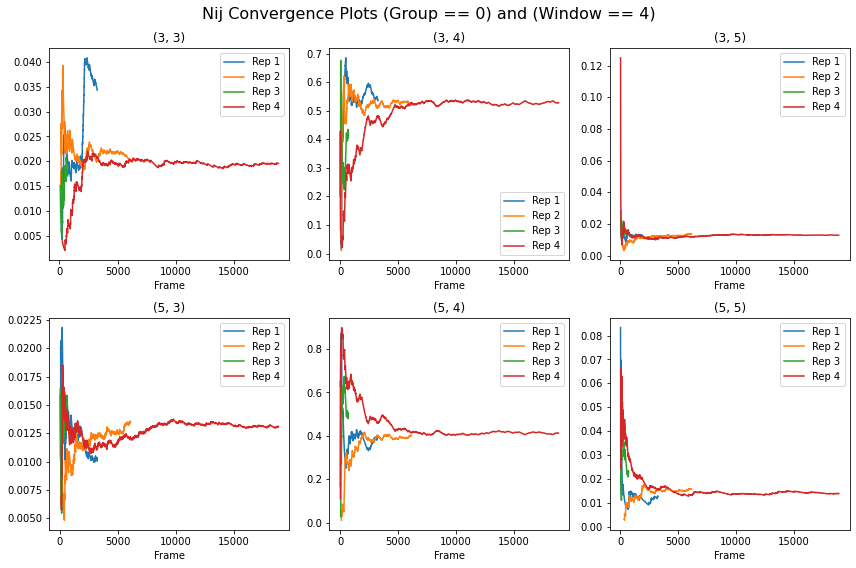

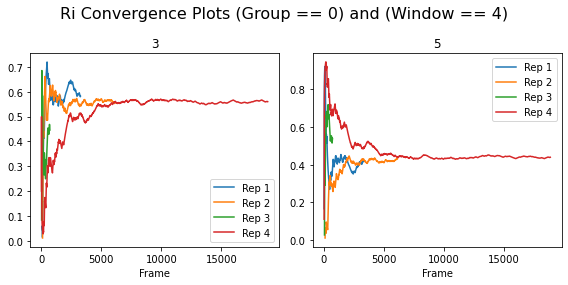

--- --- --- --- ---


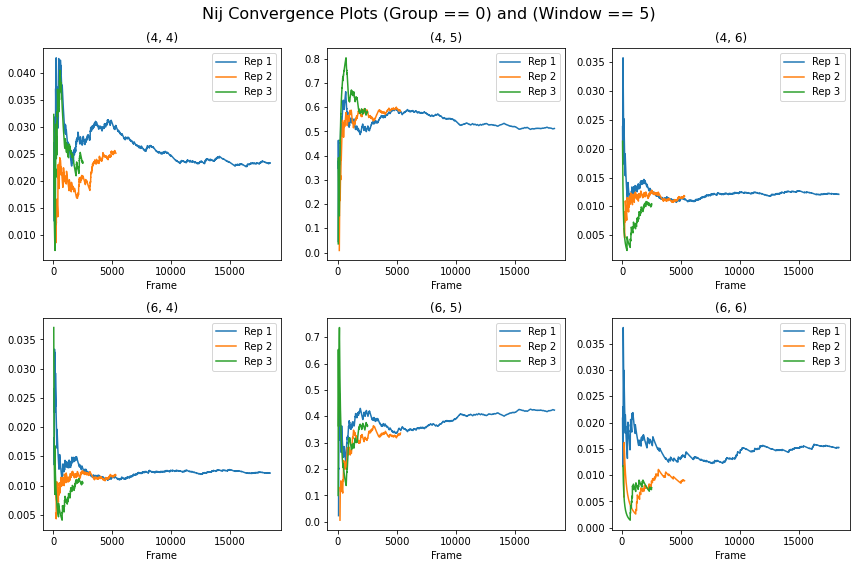

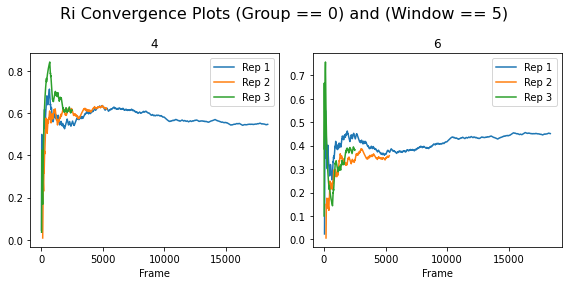

--- --- --- --- ---


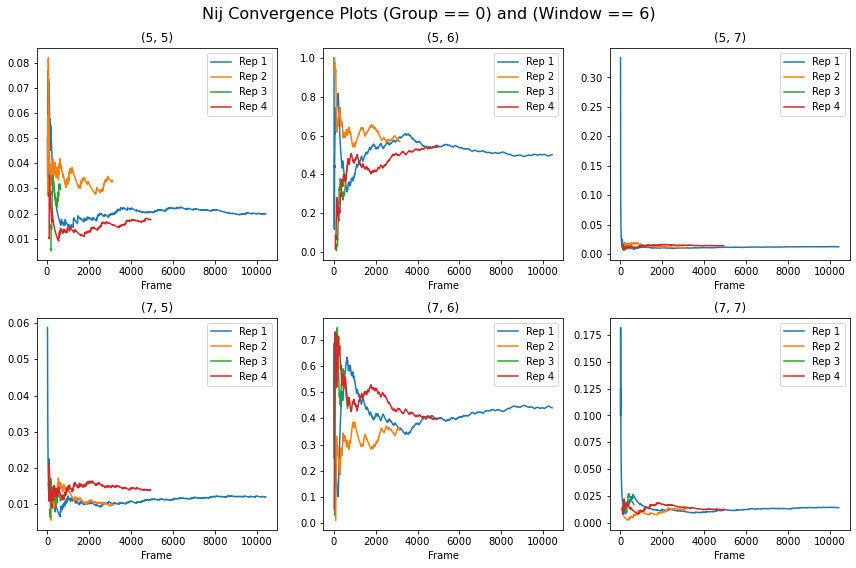

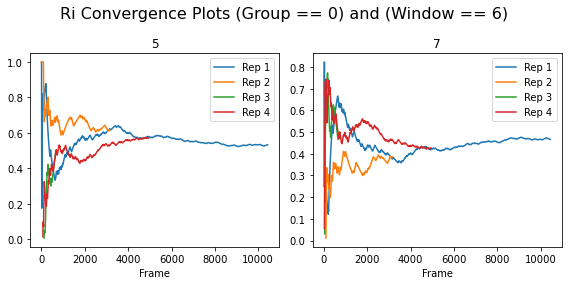

--- --- --- --- ---


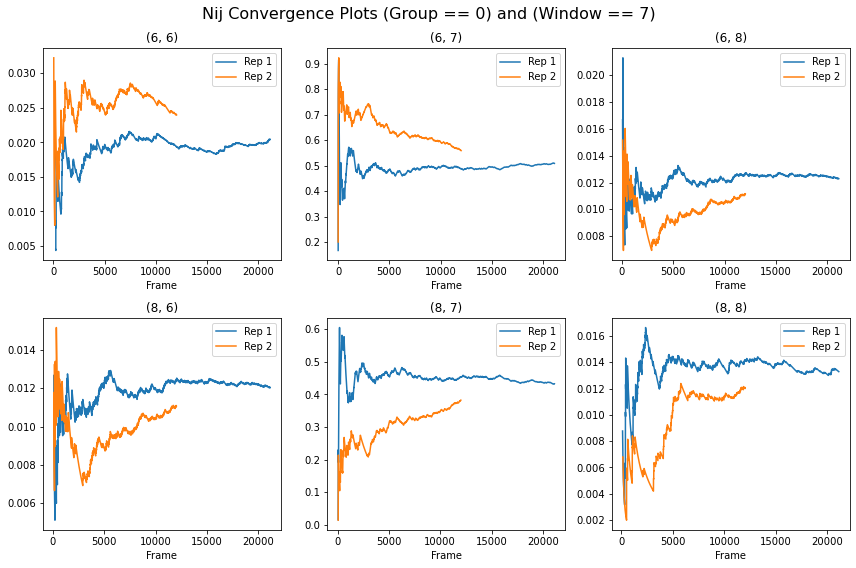

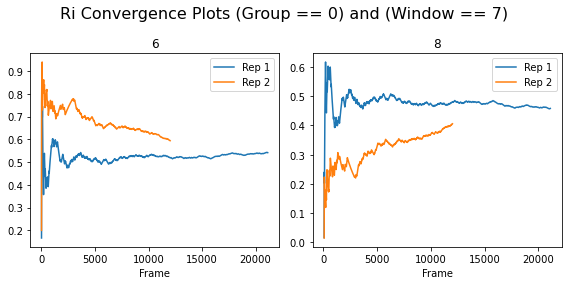

--- --- --- --- ---


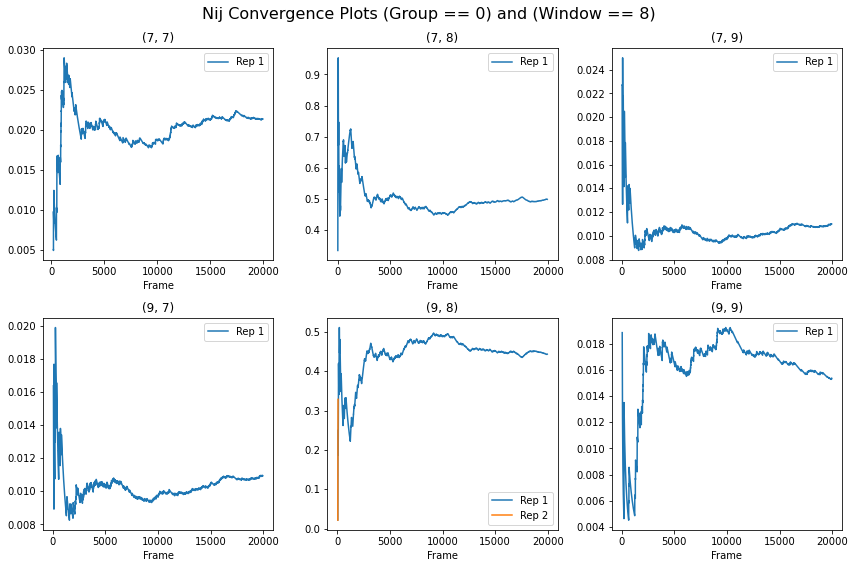

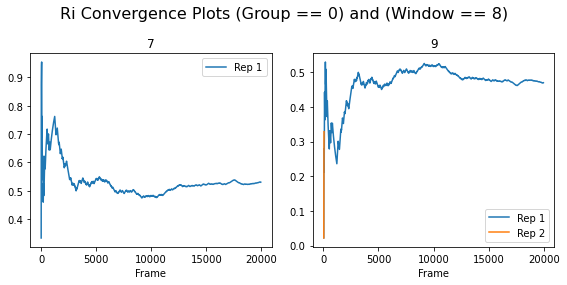

--- --- --- --- ---


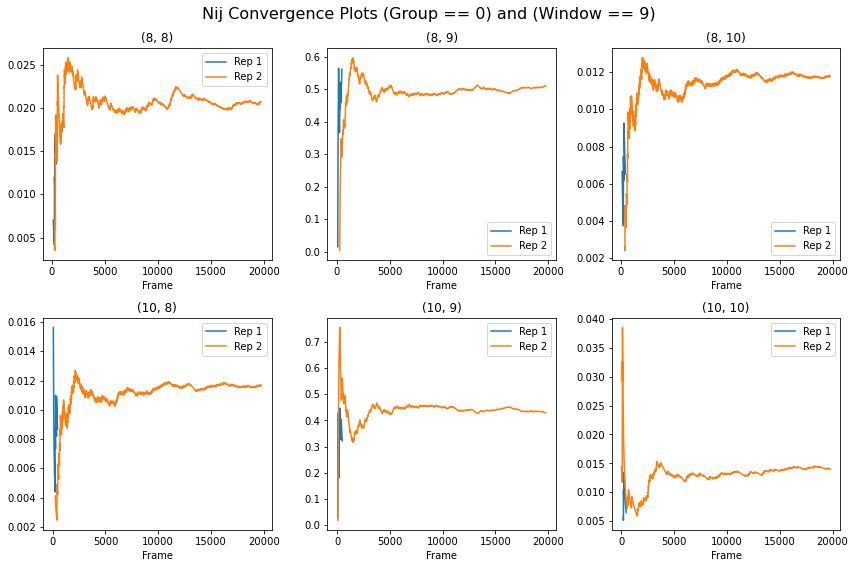

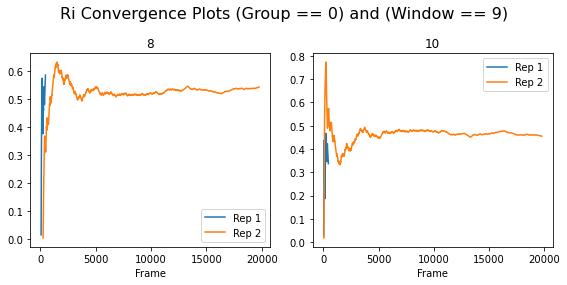

--- --- --- --- ---


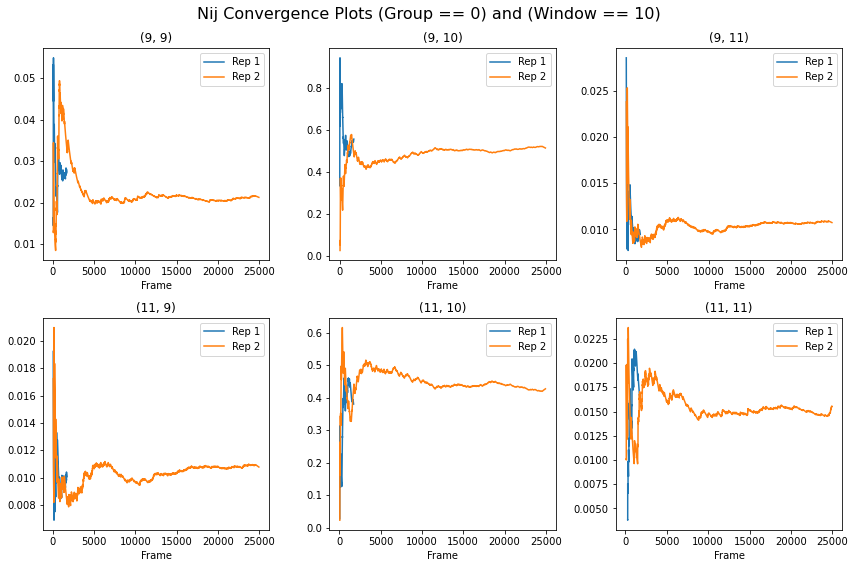

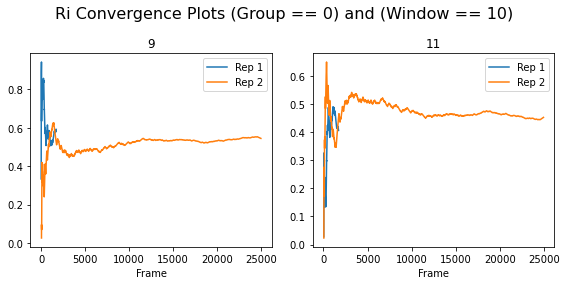

--- --- --- --- ---


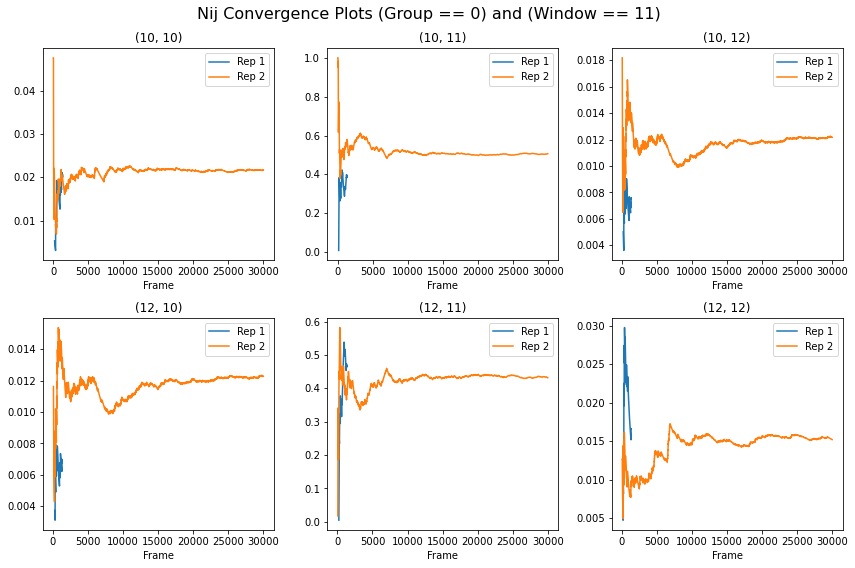

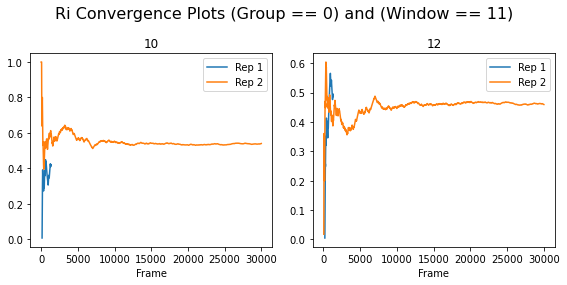

--- --- --- --- ---


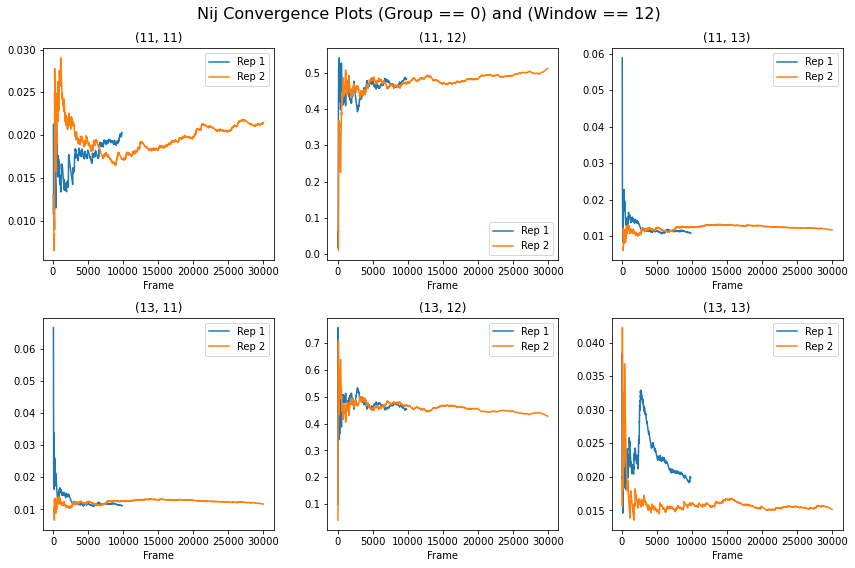

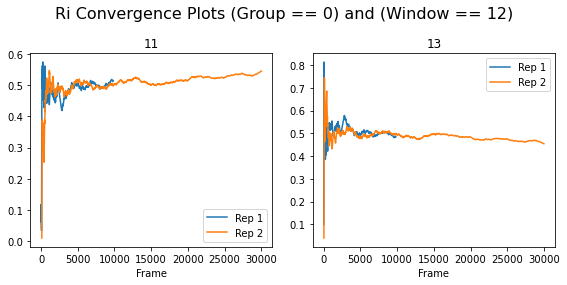

--- --- --- --- ---


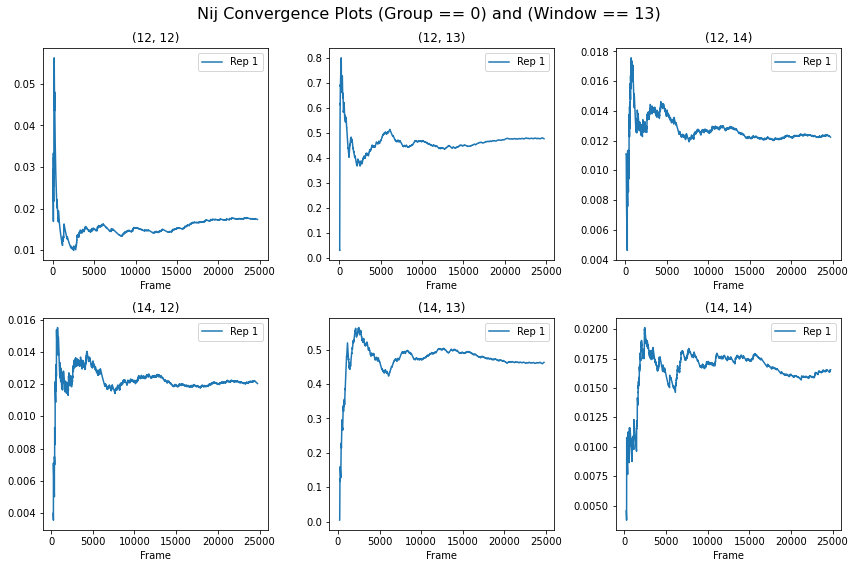

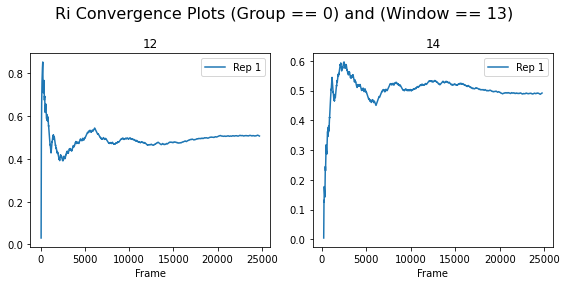

--- --- --- --- ---


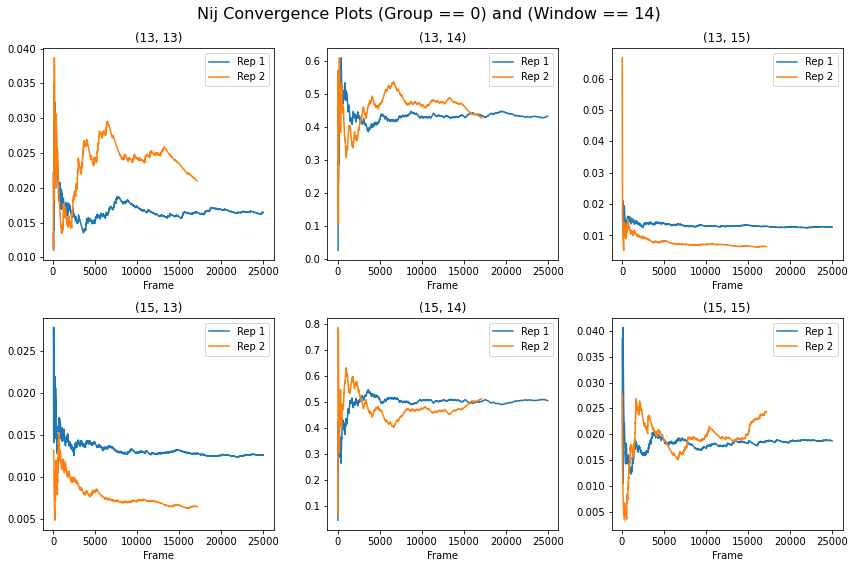

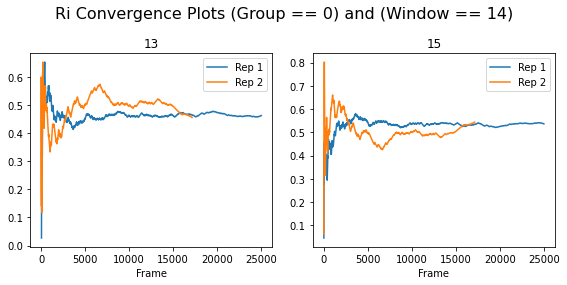

--- --- --- --- ---


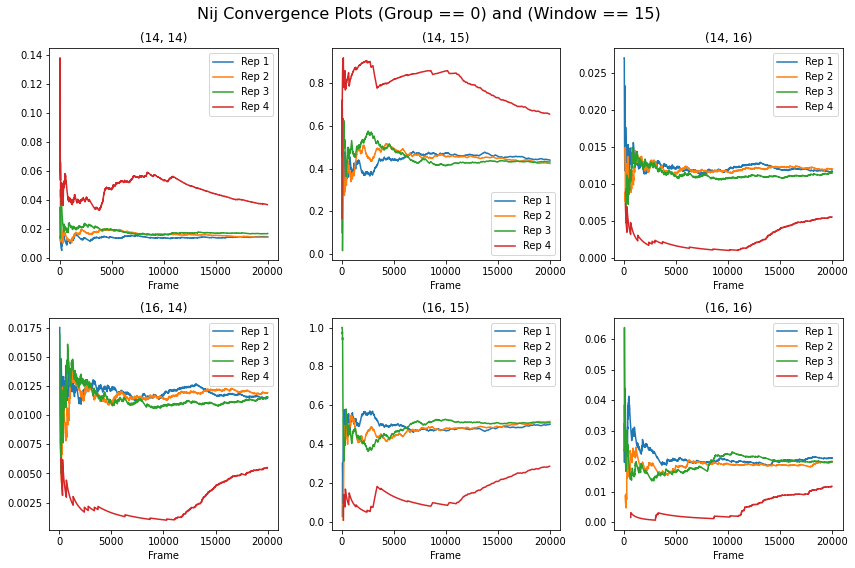

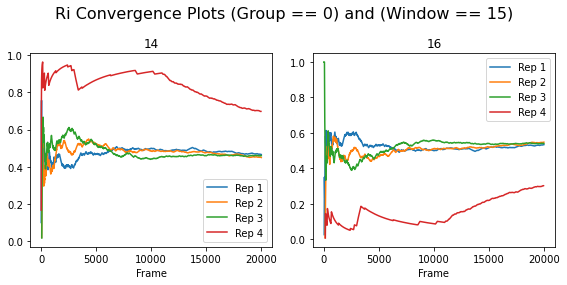

--- --- --- --- ---


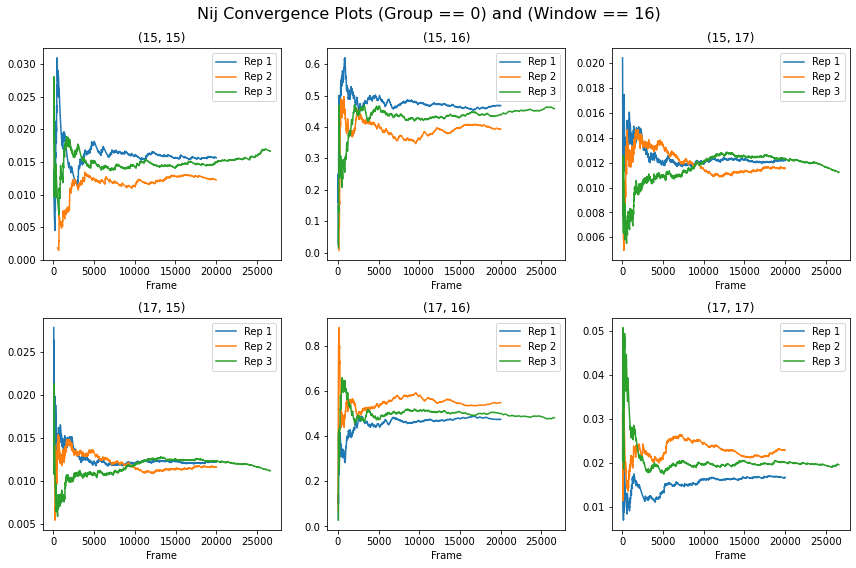

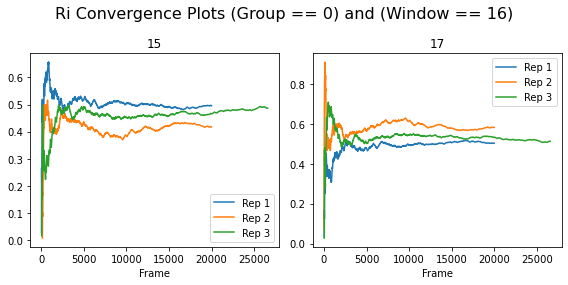

--- --- --- --- ---


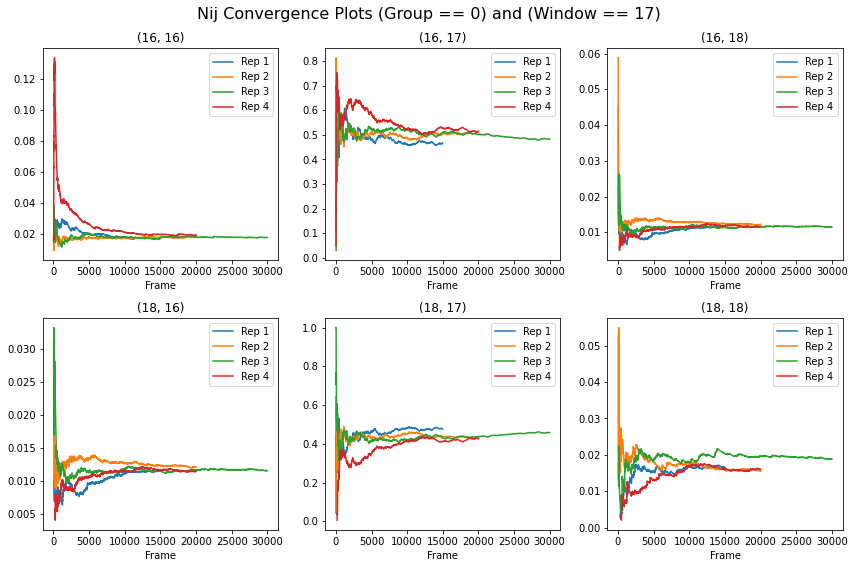

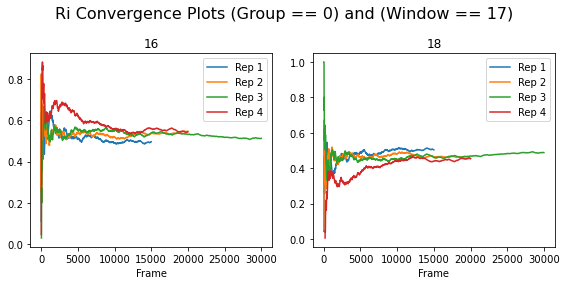

--- --- --- --- ---


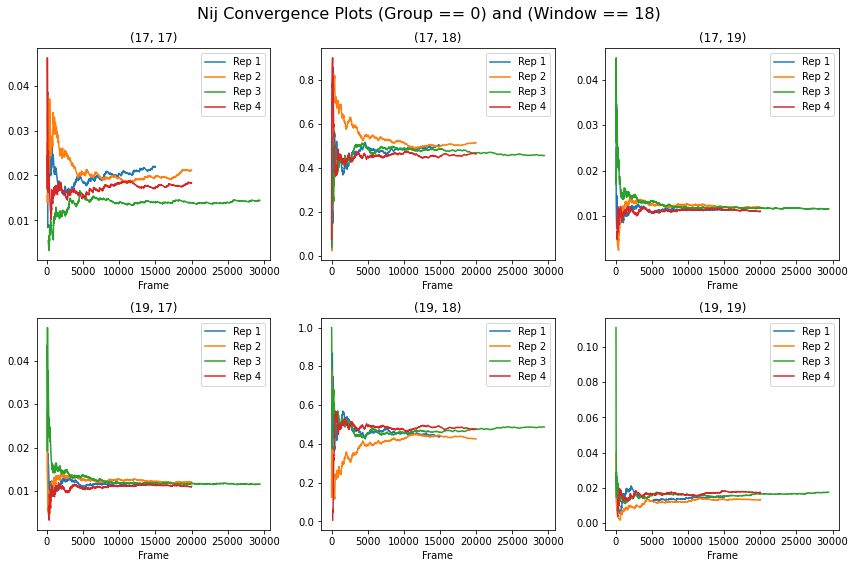

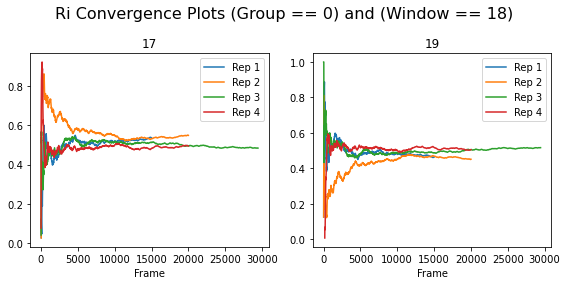

--- --- --- --- ---


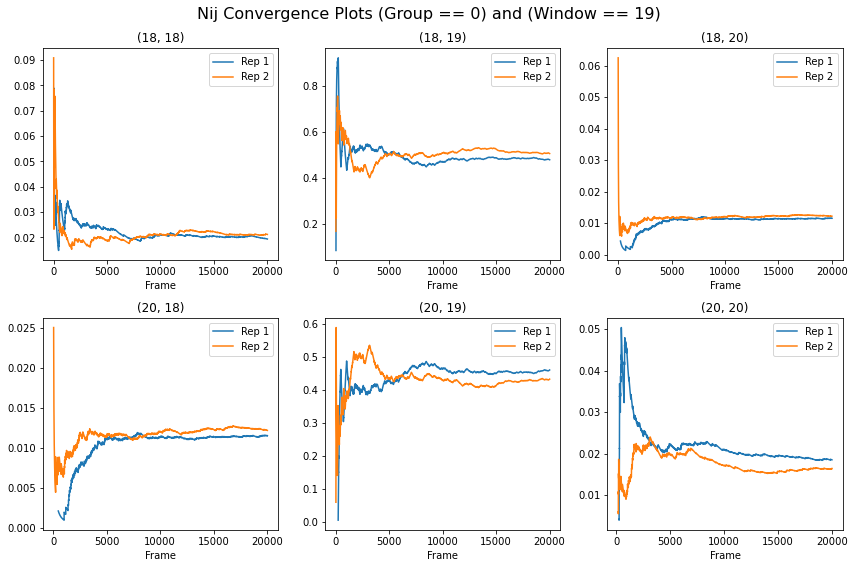

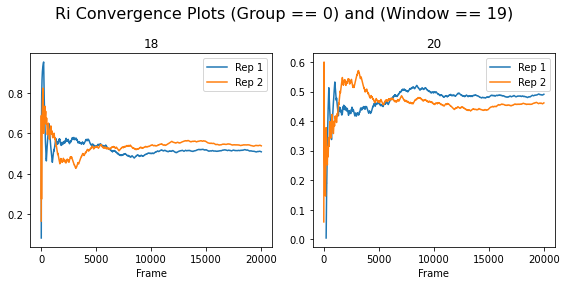

--- --- --- --- ---


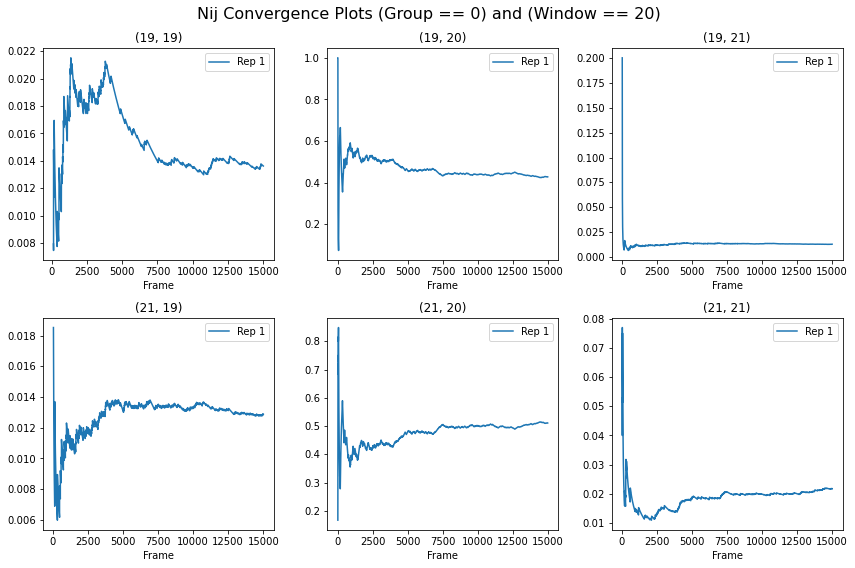

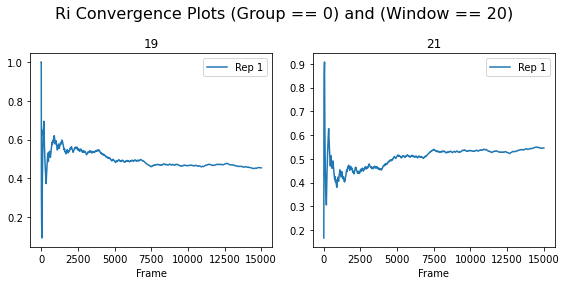

--- --- --- --- ---


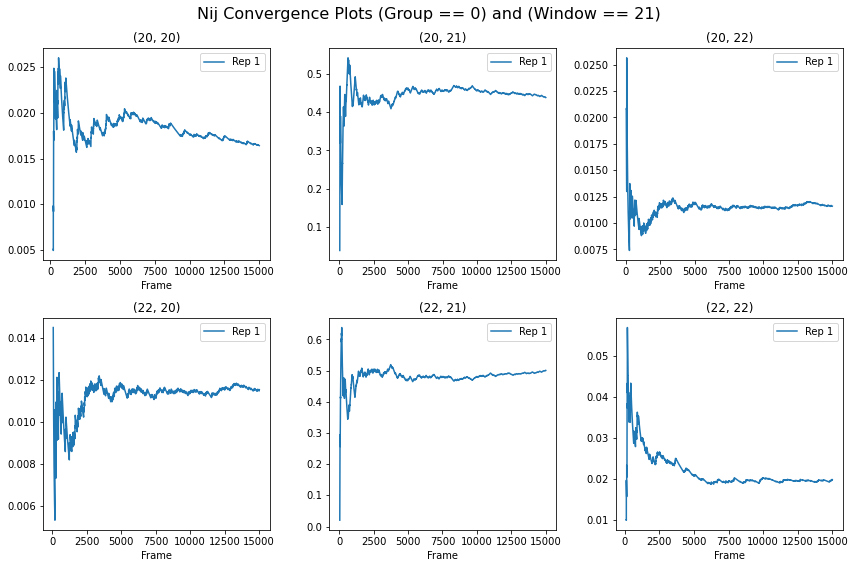

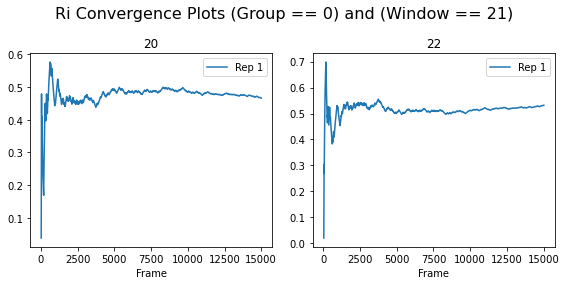

--- --- --- --- ---


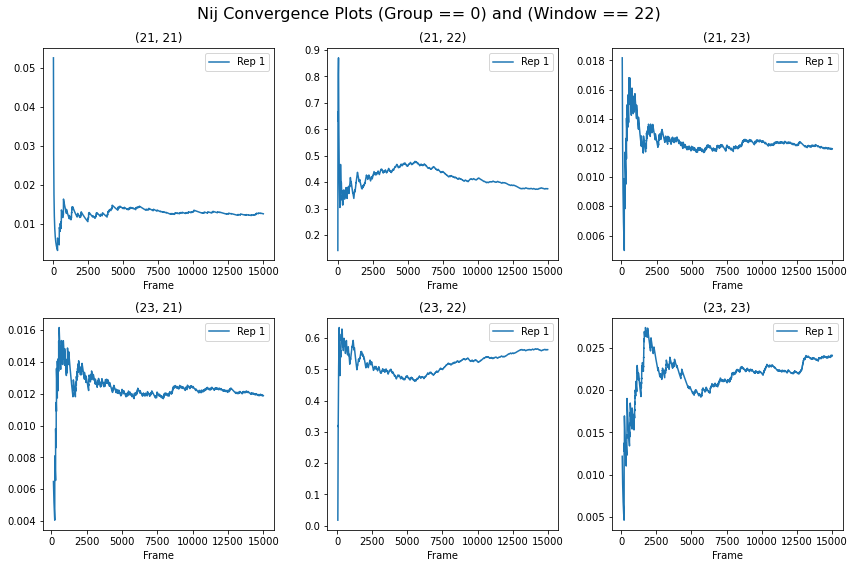

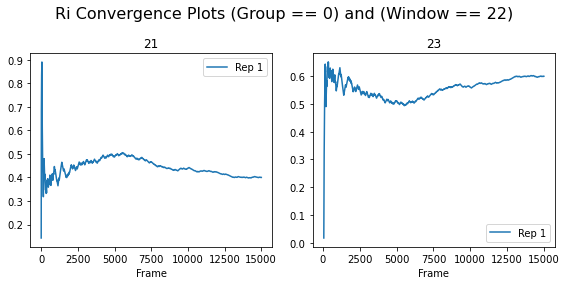

--- --- --- --- ---


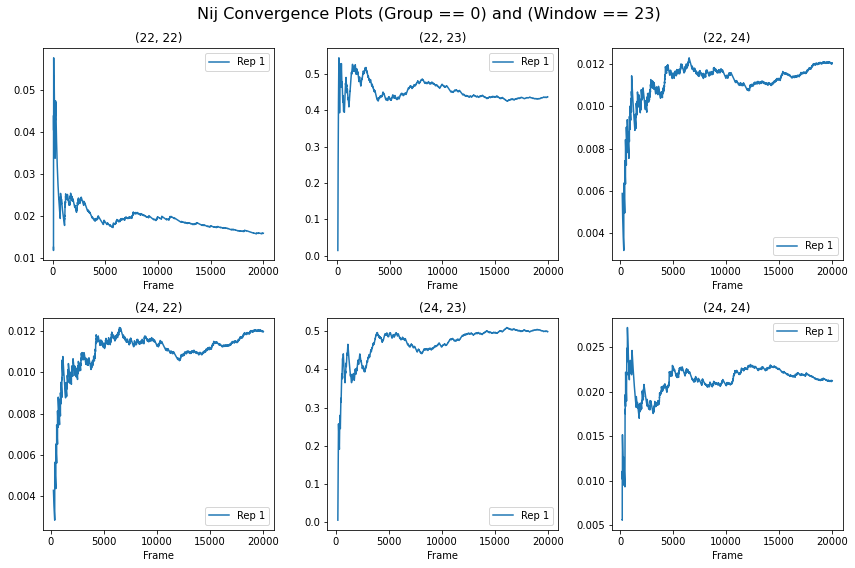

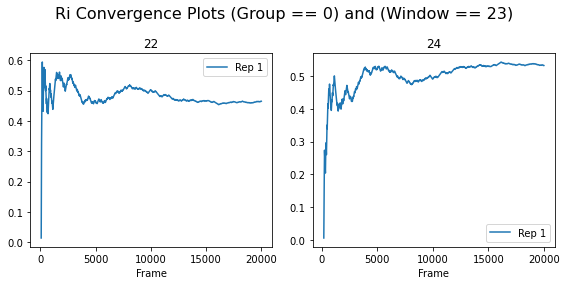

--- --- --- --- ---


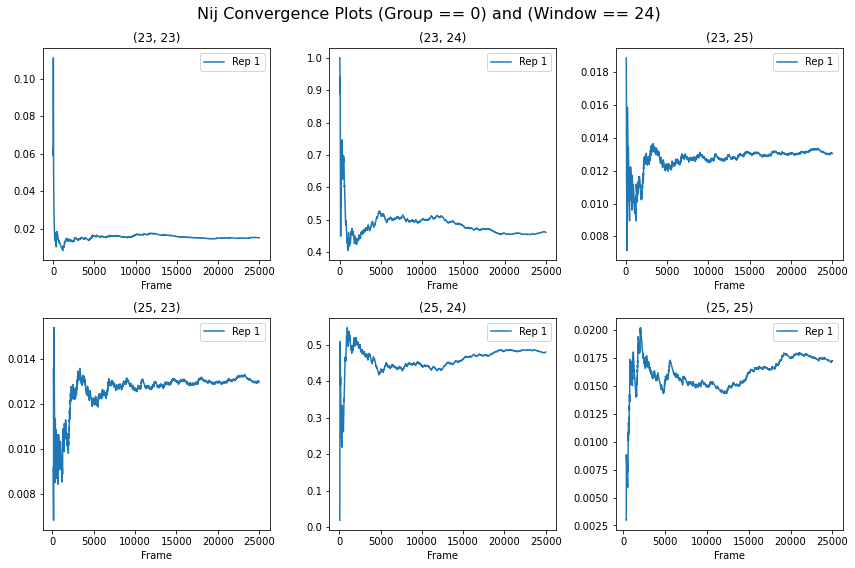

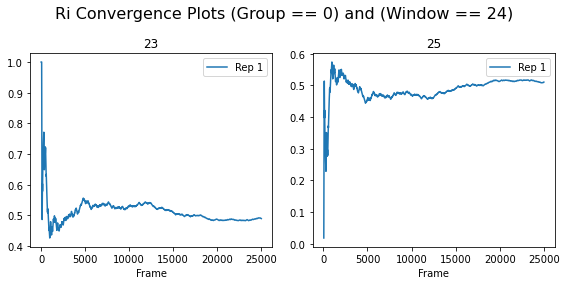

--- --- --- --- ---


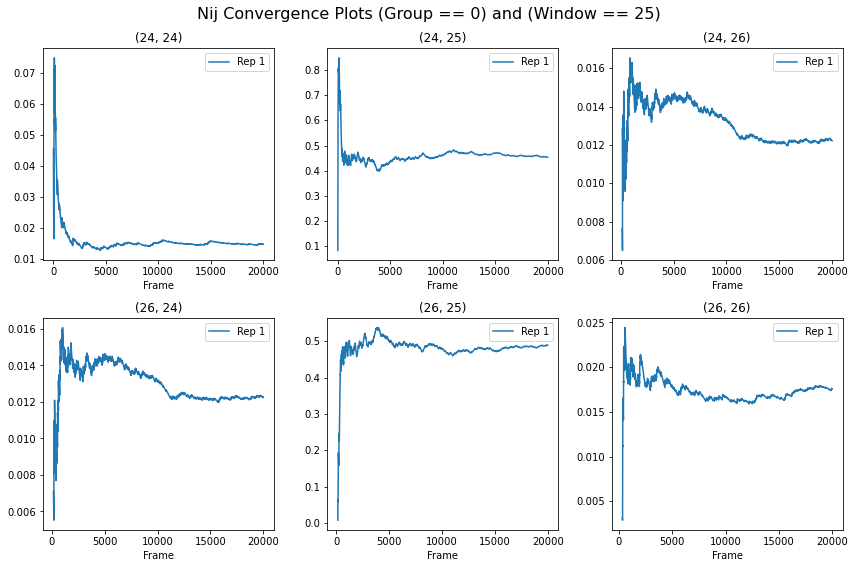

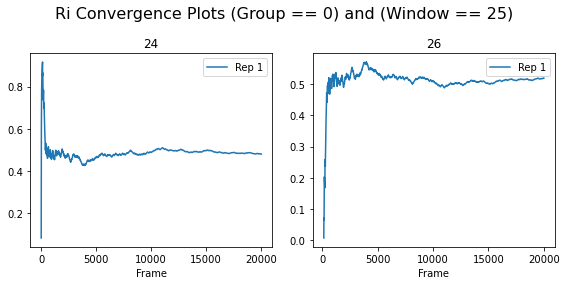

--- --- --- --- ---


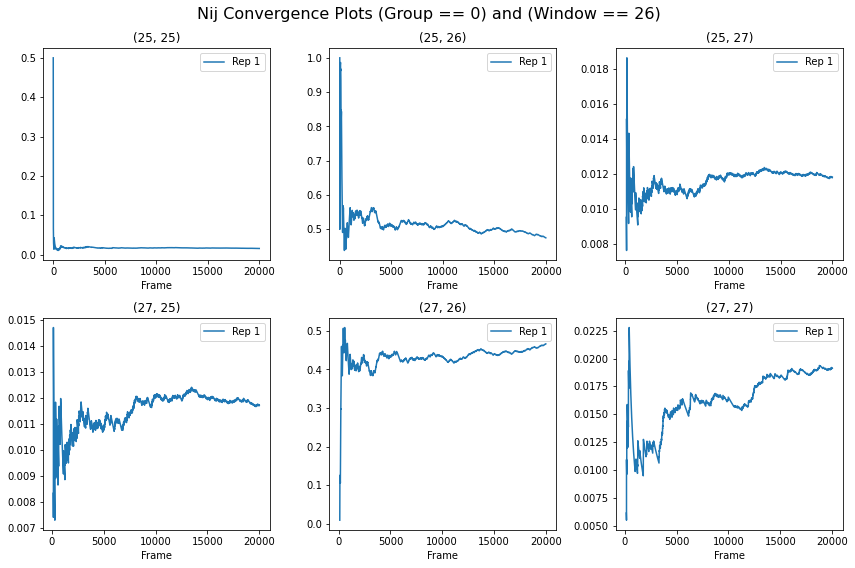

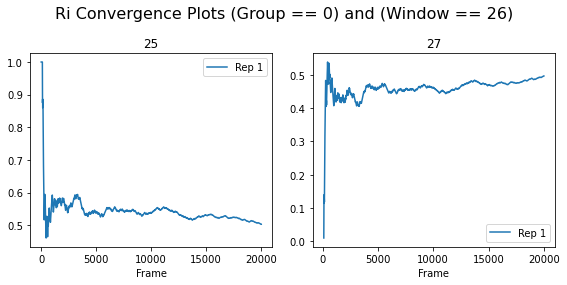

--- --- --- --- ---


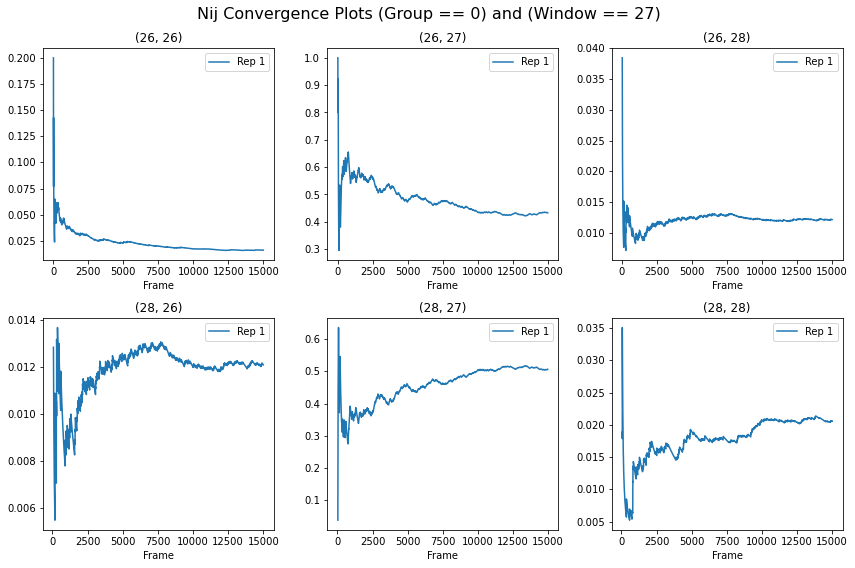

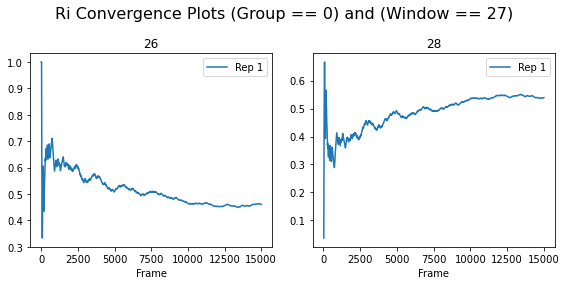

--- --- --- --- ---


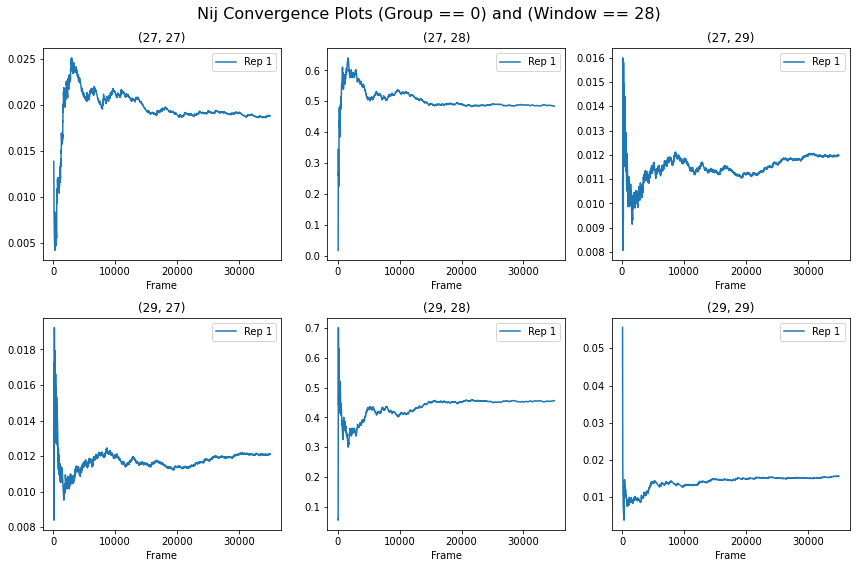

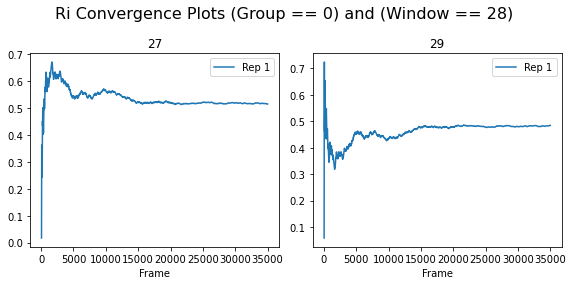

--- --- --- --- ---


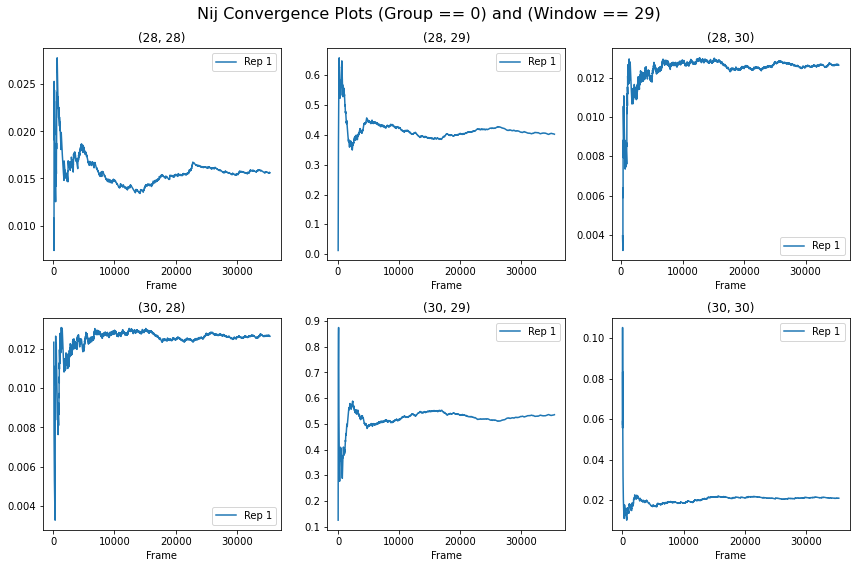

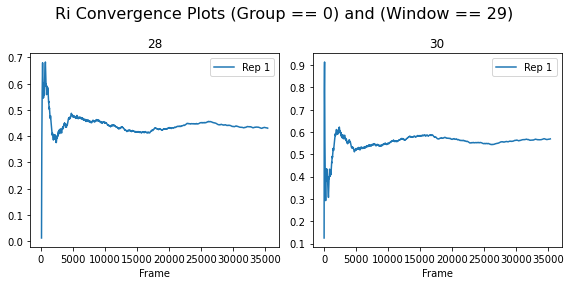

--- --- --- --- ---


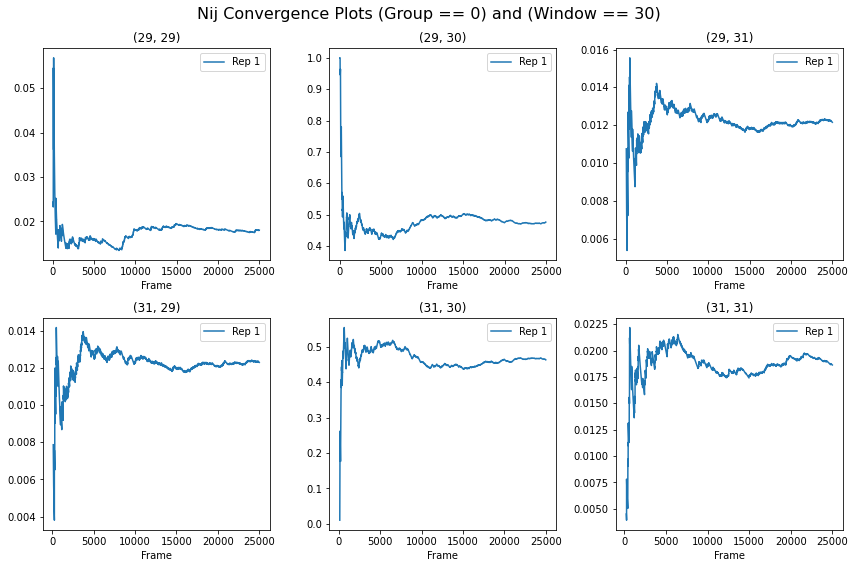

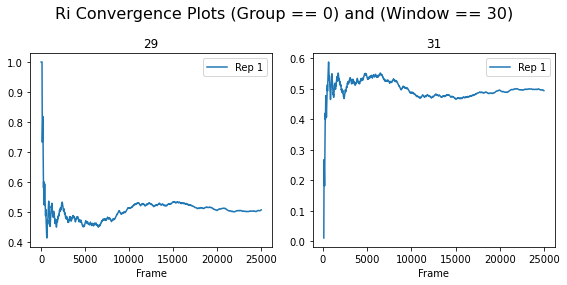

--- --- --- --- ---


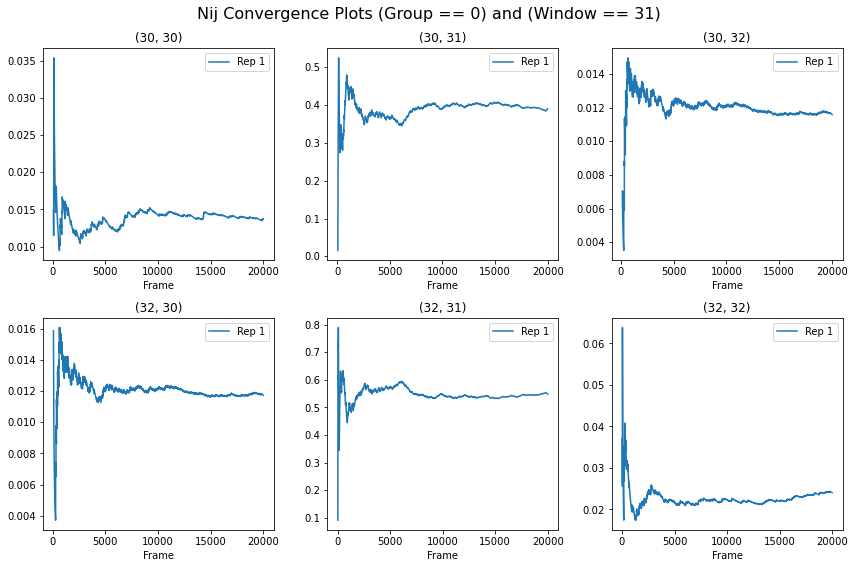

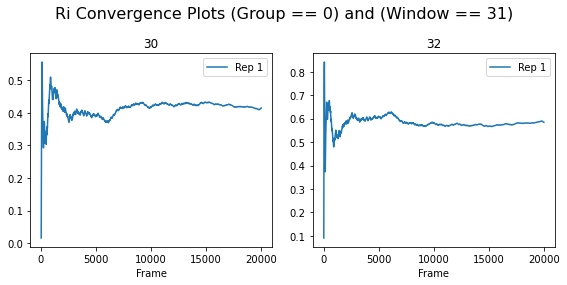

--- --- --- --- ---


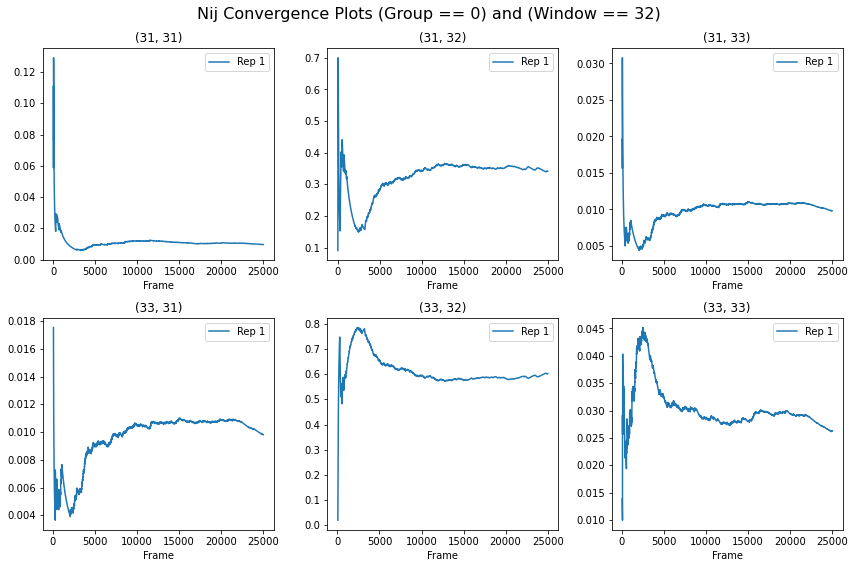

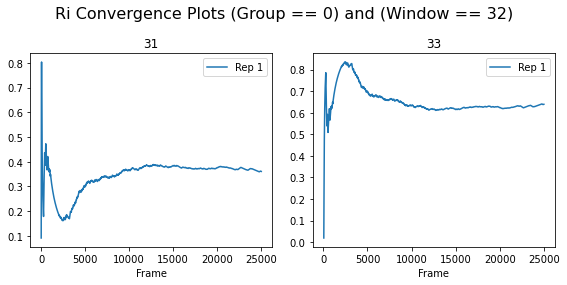

--- --- --- --- ---


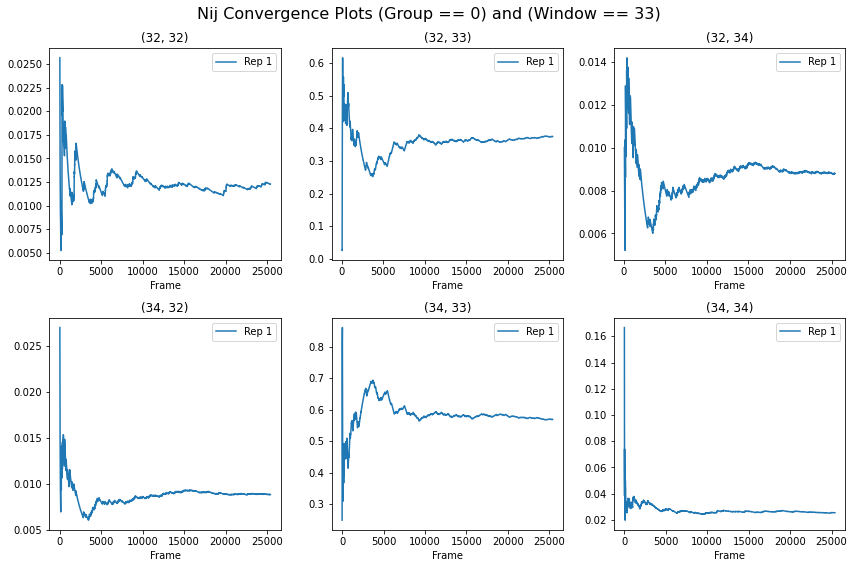

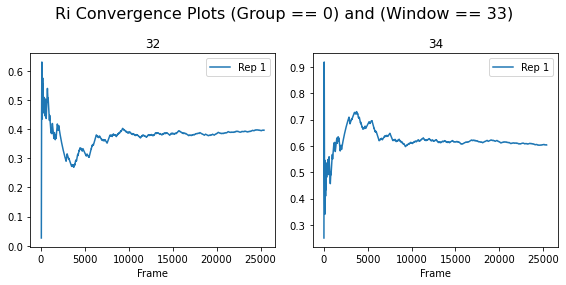

--- --- --- --- ---


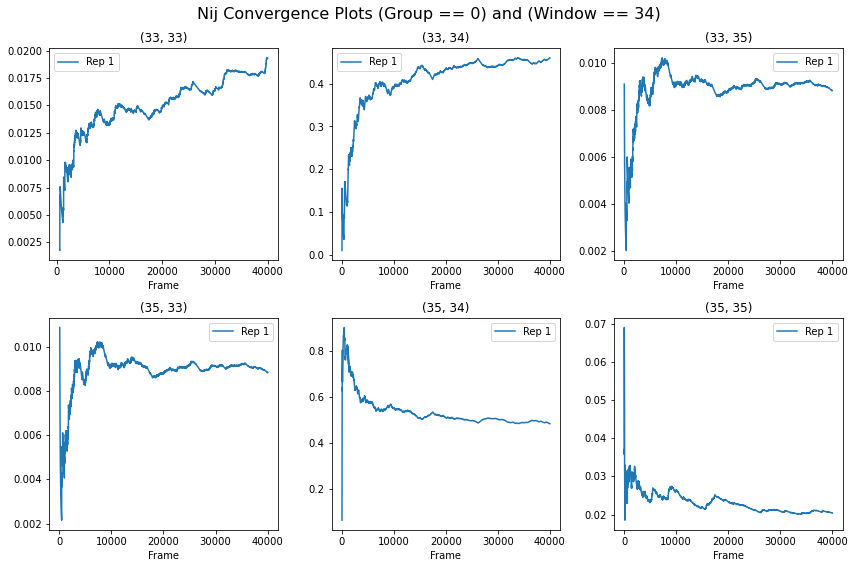

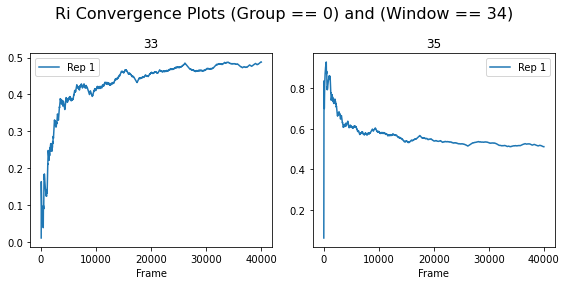

--- --- --- --- ---


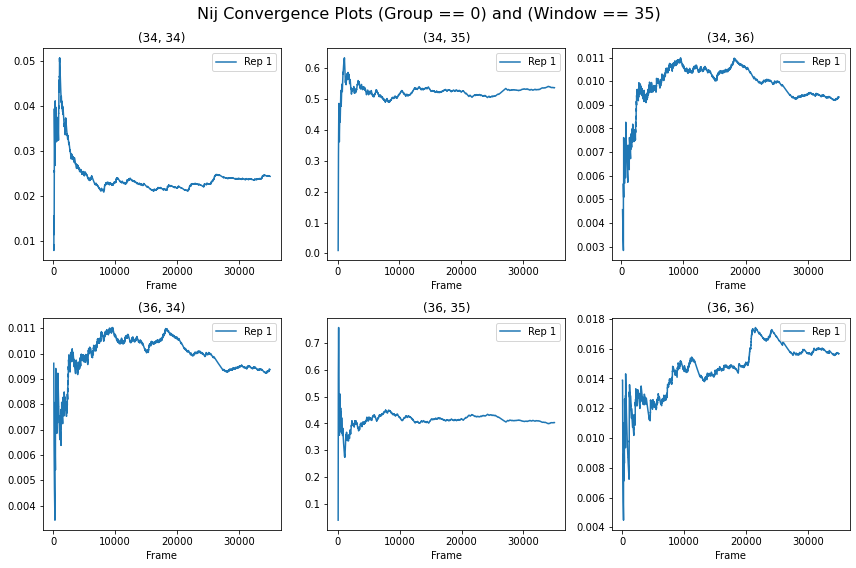

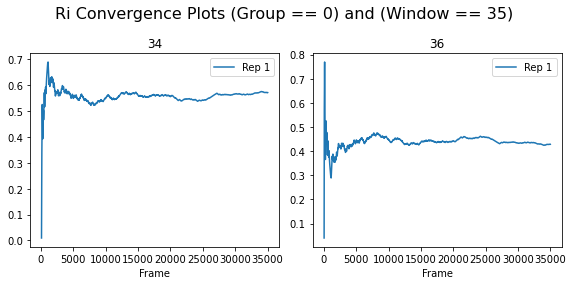

--- --- --- --- ---


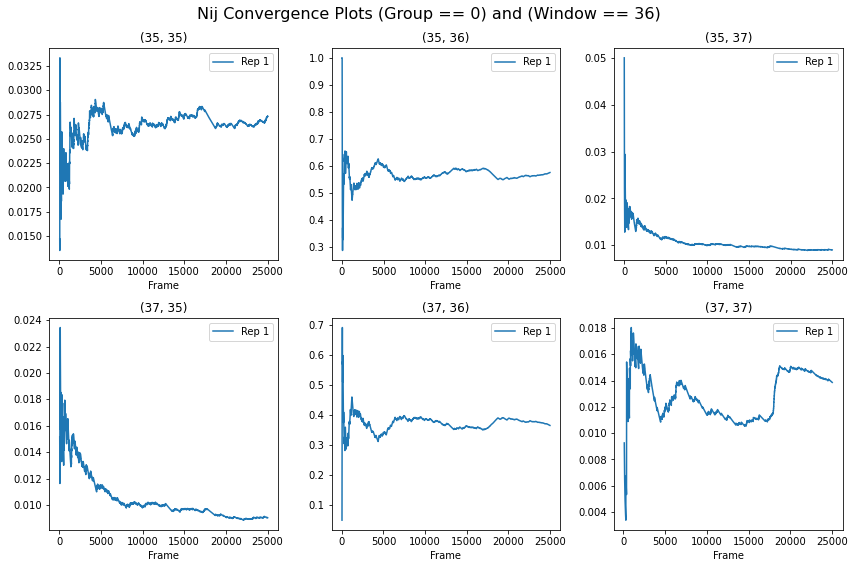

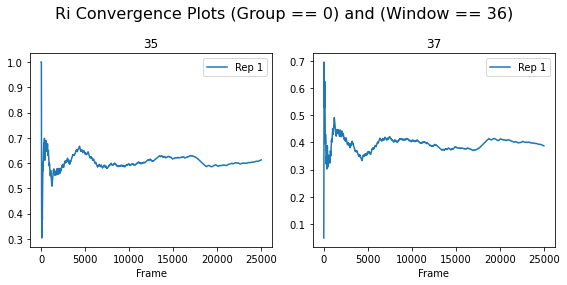

--- --- --- --- ---


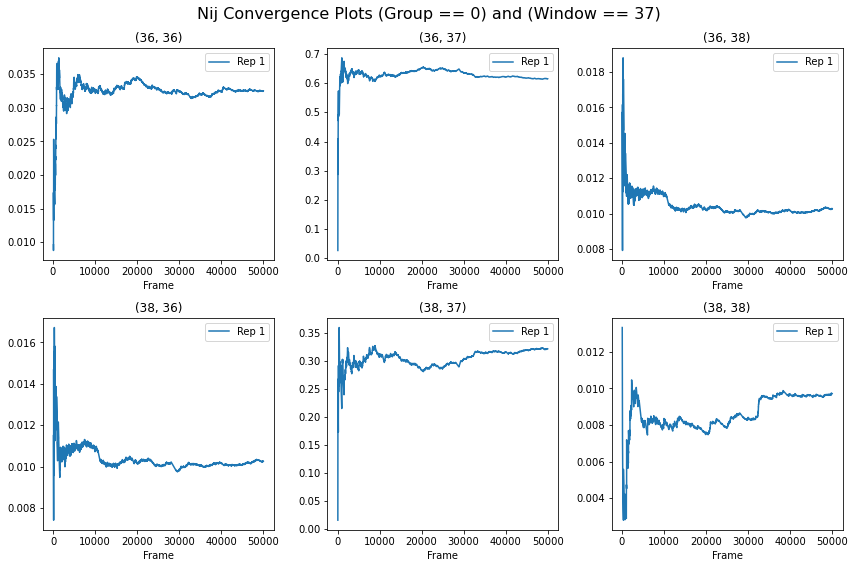

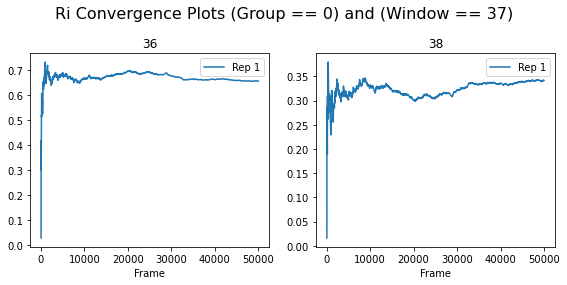

--- --- --- --- ---


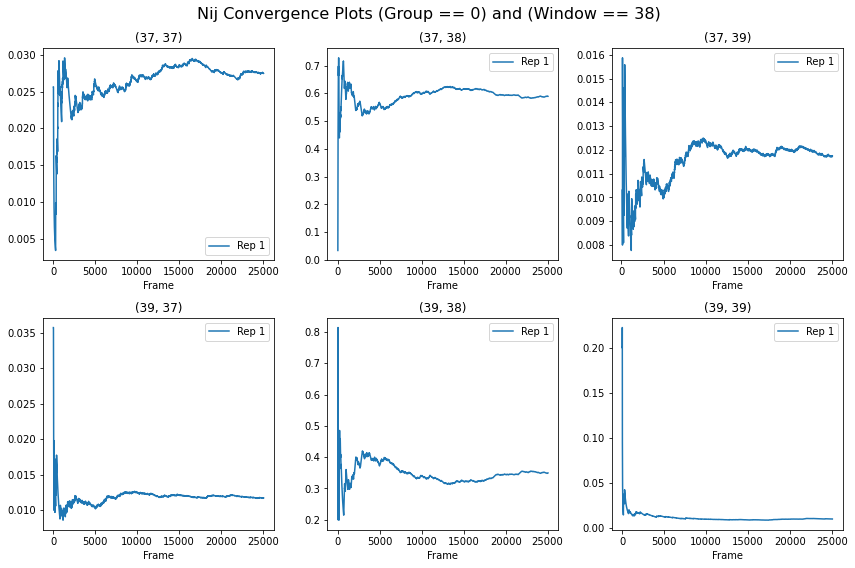

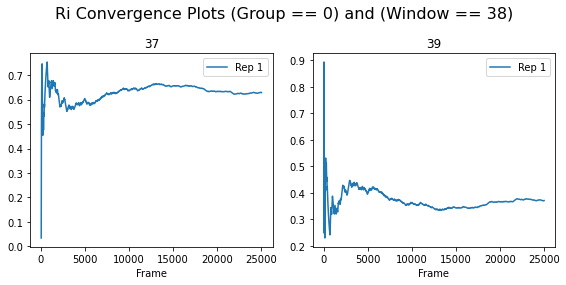

--- --- --- --- ---


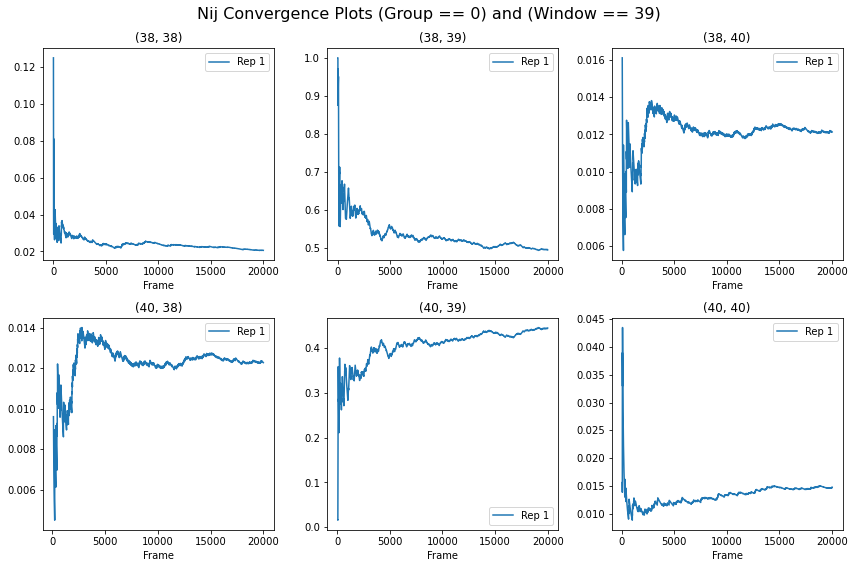

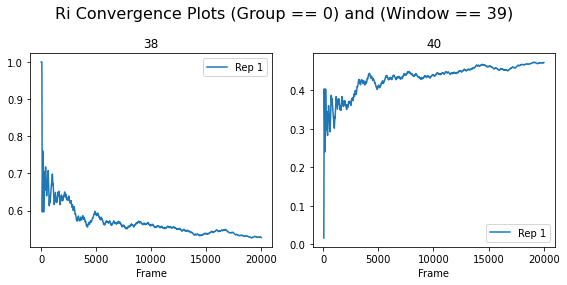

--- --- --- --- ---


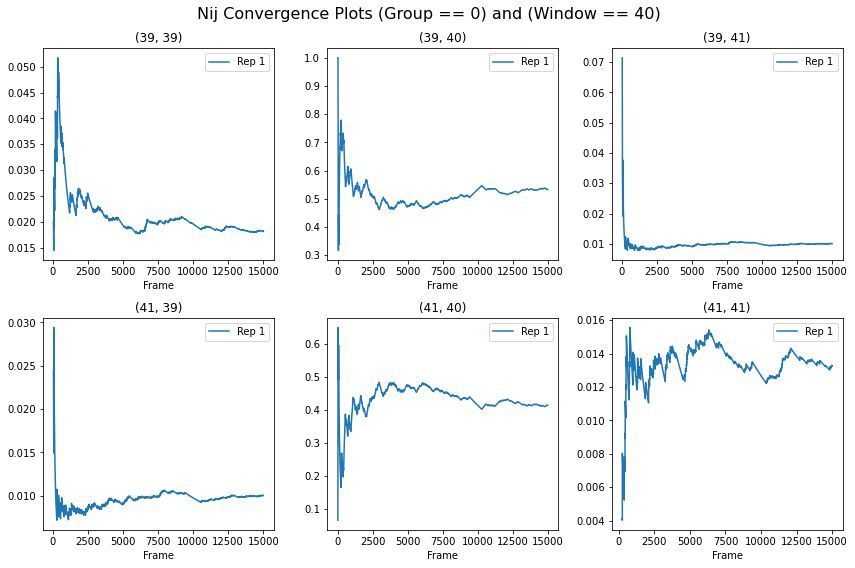

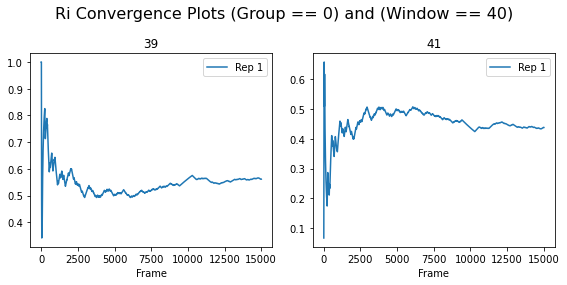

--- --- --- --- ---


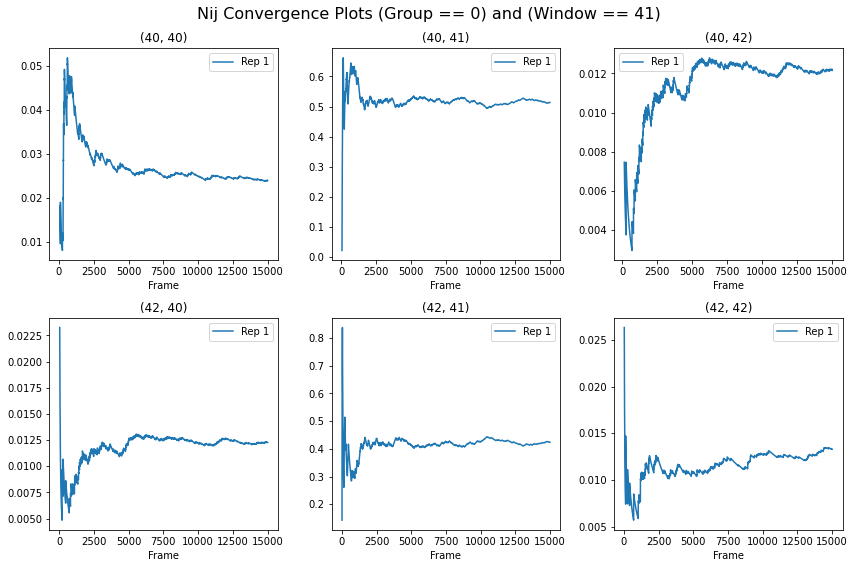

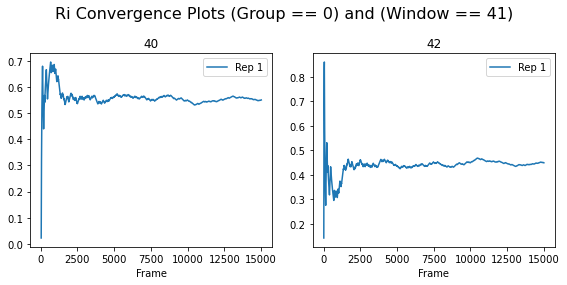

--- --- --- --- ---


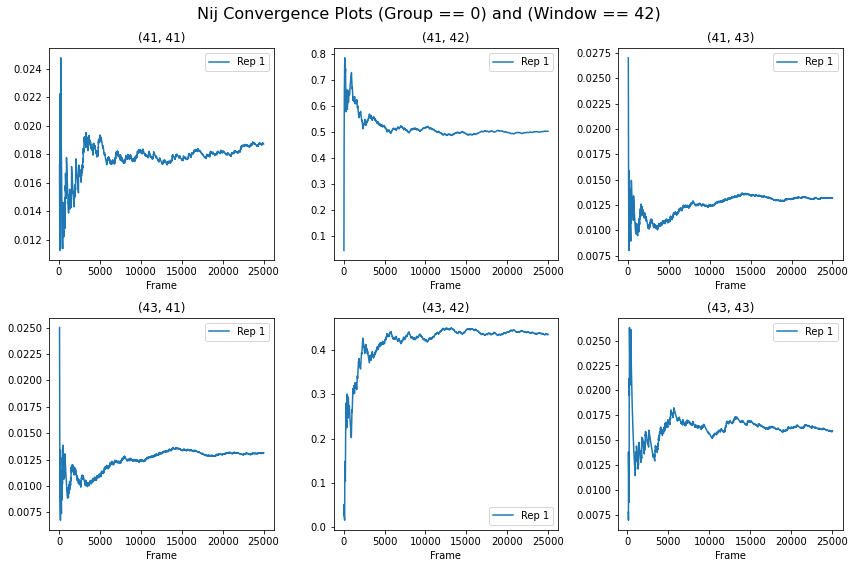

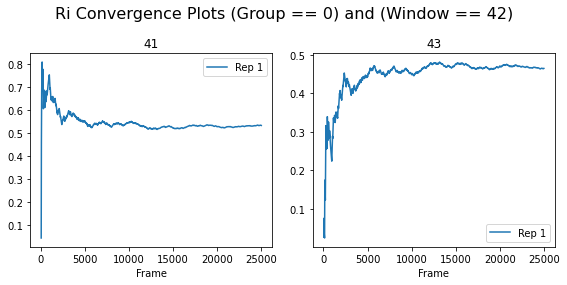

--- --- --- --- ---


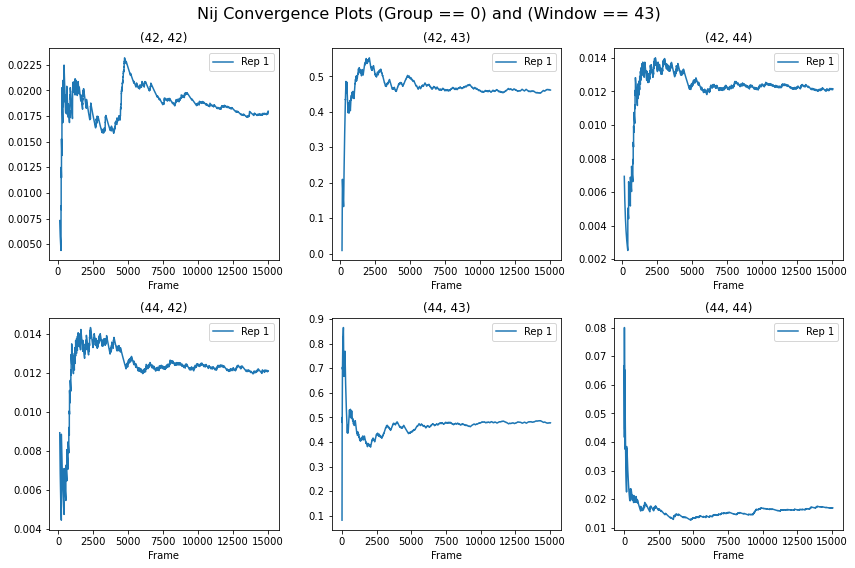

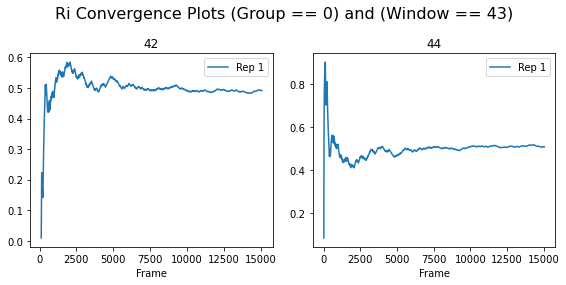

--- --- --- --- ---


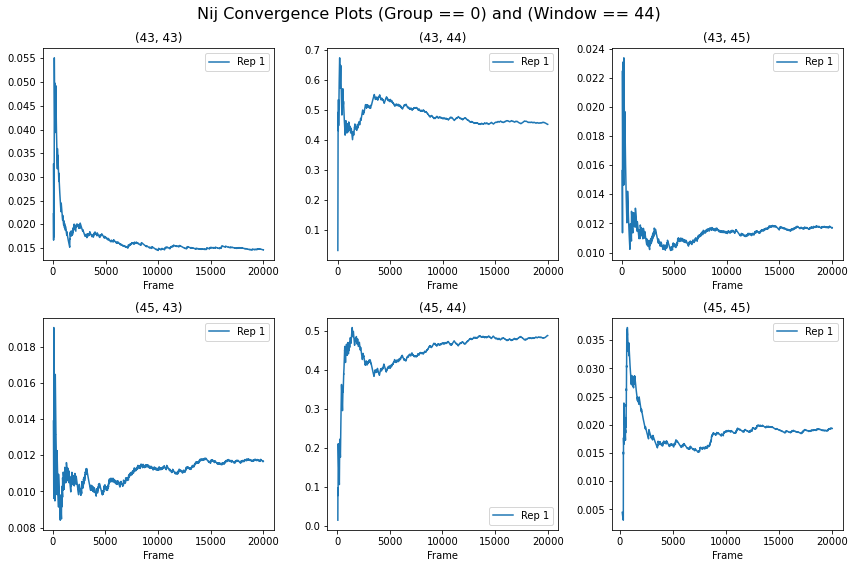

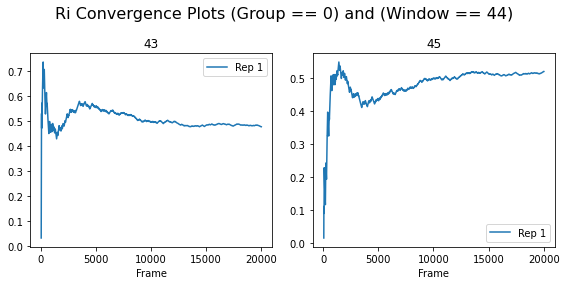

--- --- --- --- ---


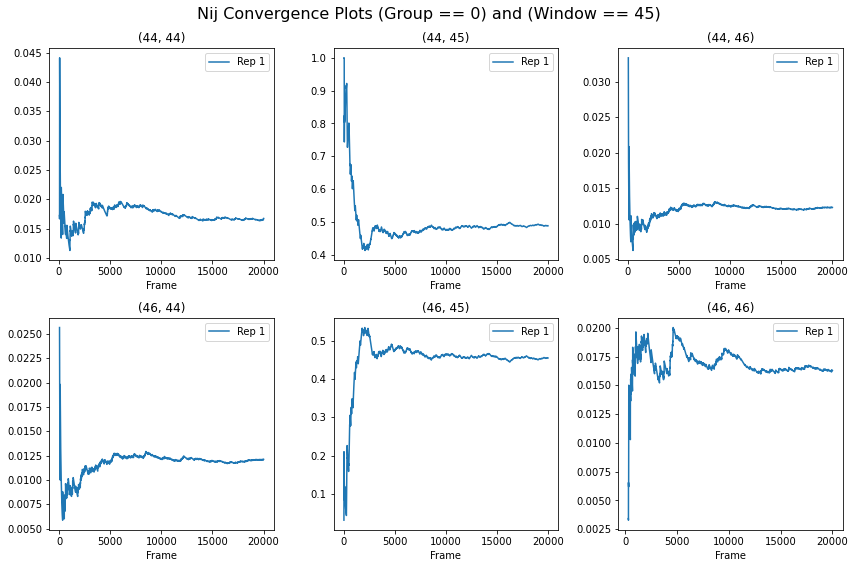

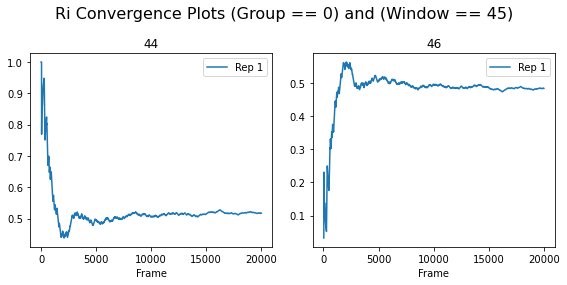

--- --- --- --- ---


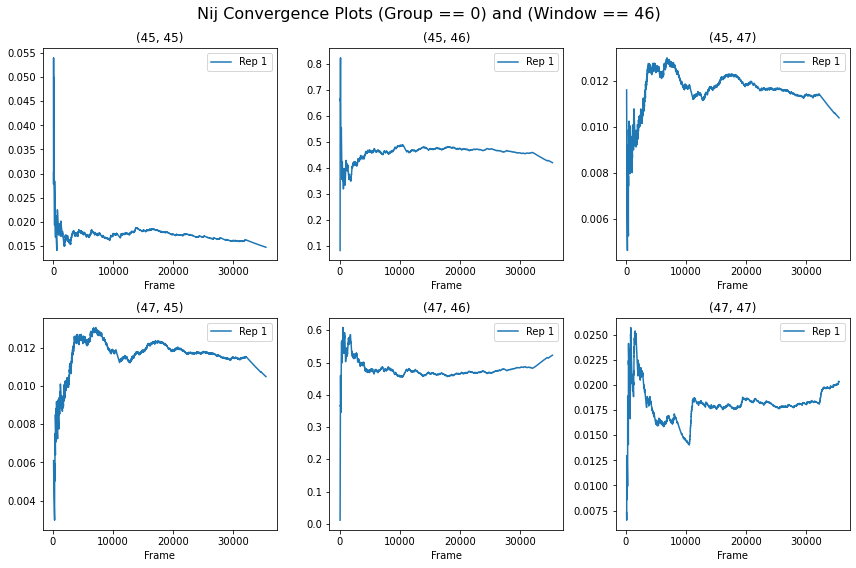

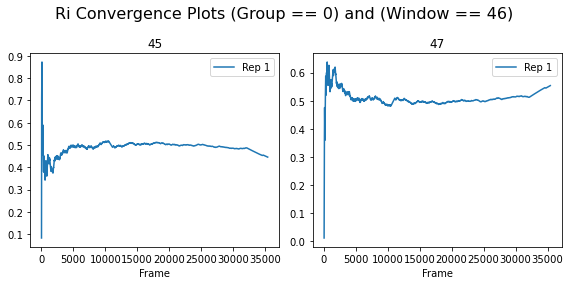

--- --- --- --- ---


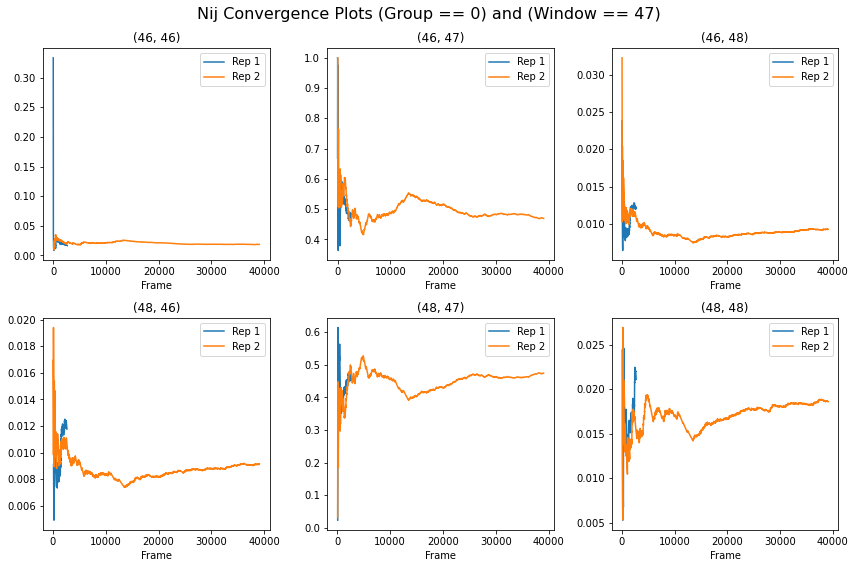

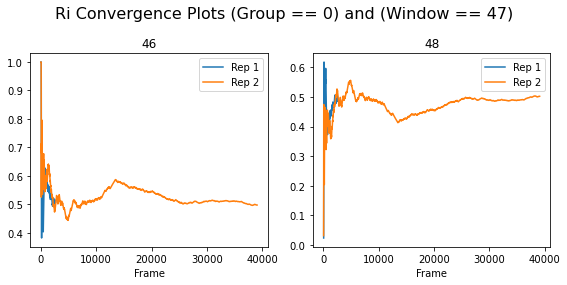

--- --- --- --- ---


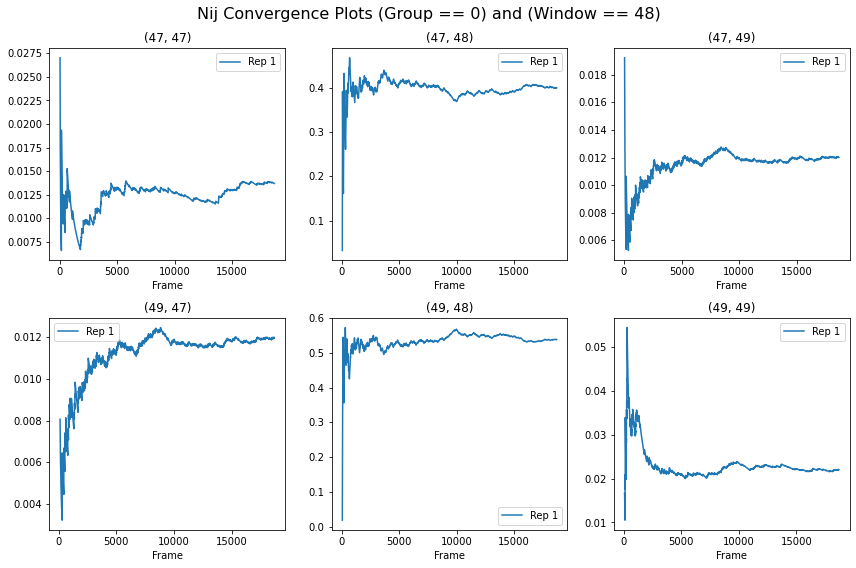

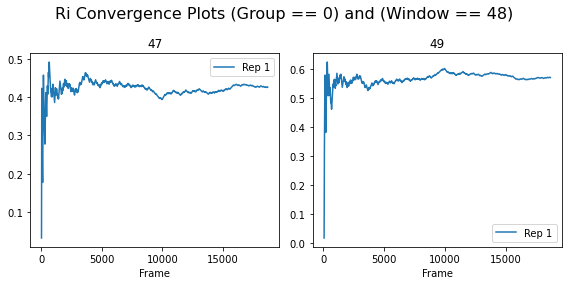

--- --- --- --- ---


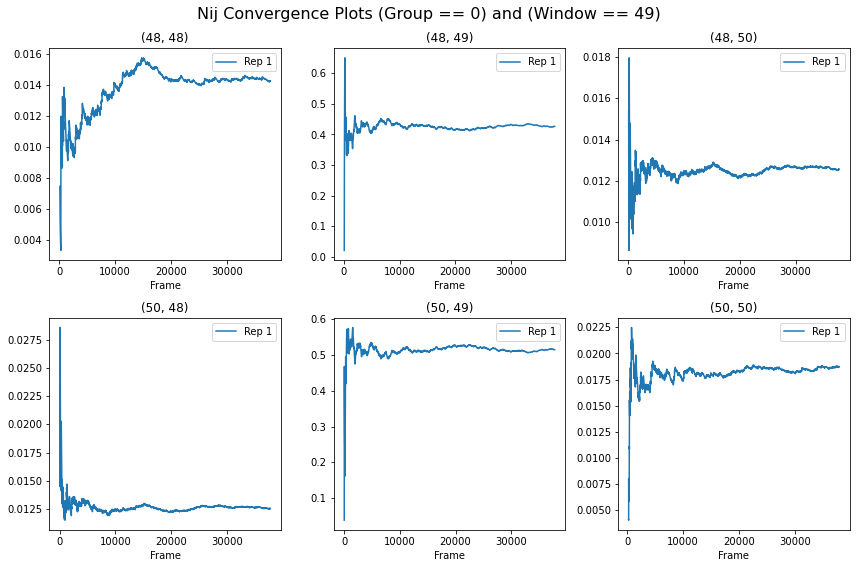

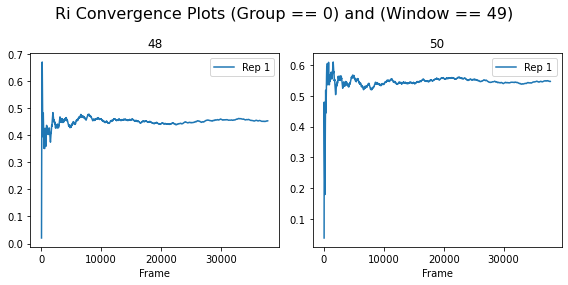

--- --- --- --- ---


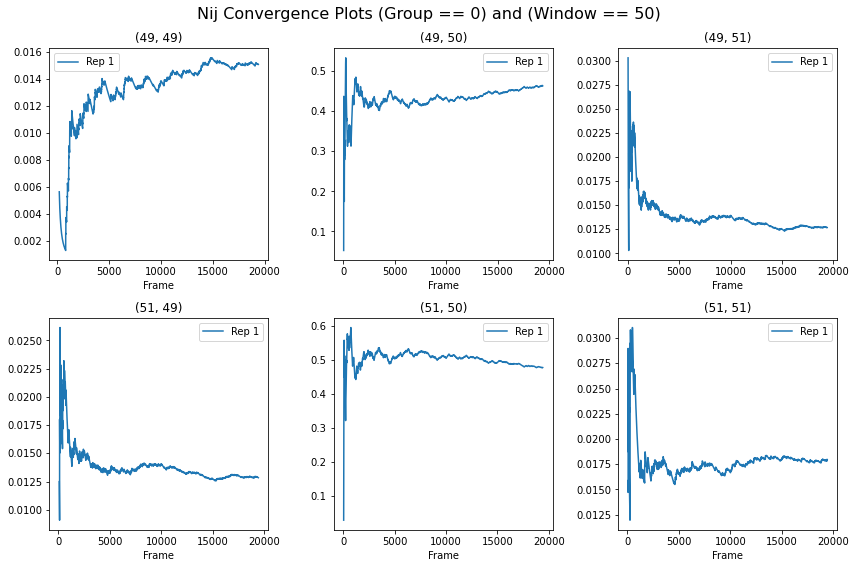

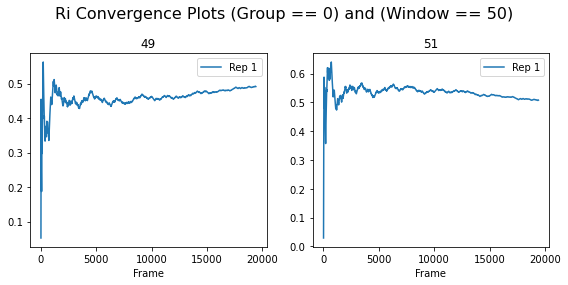

--- --- --- --- ---


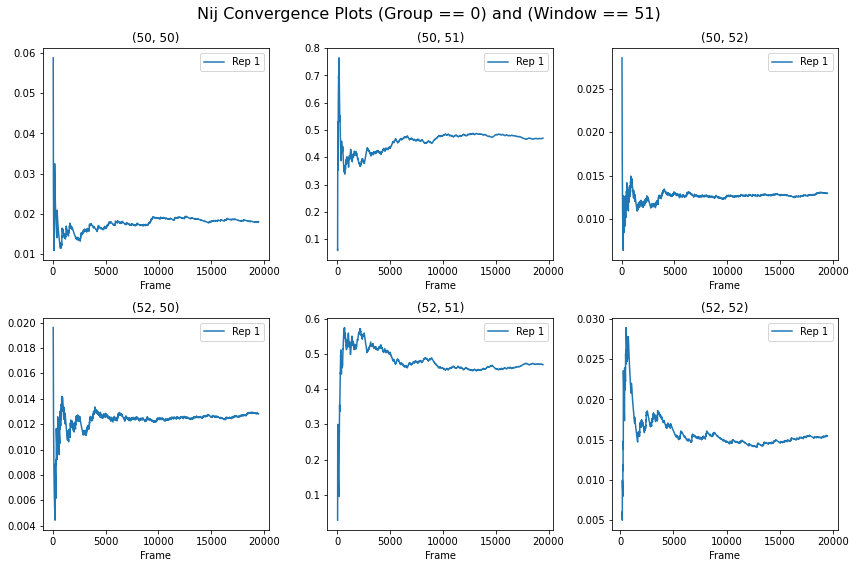

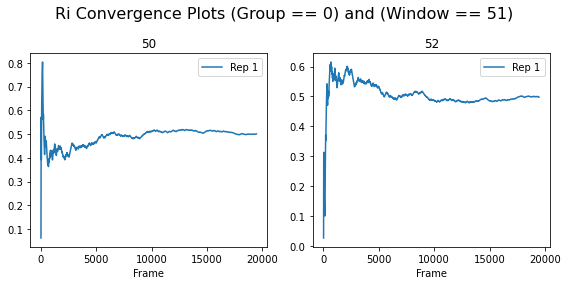

--- --- --- --- ---


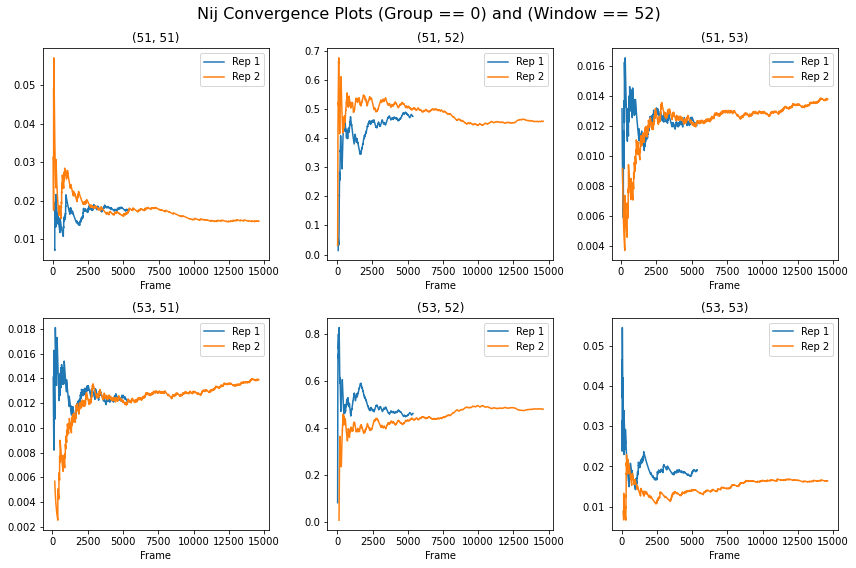

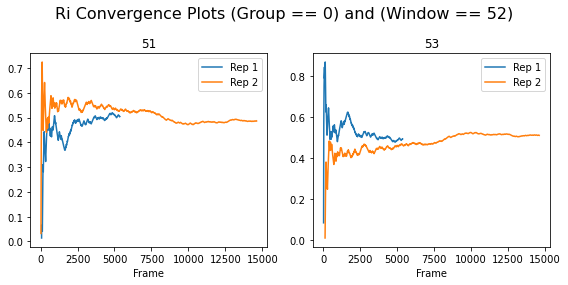

--- --- --- --- ---


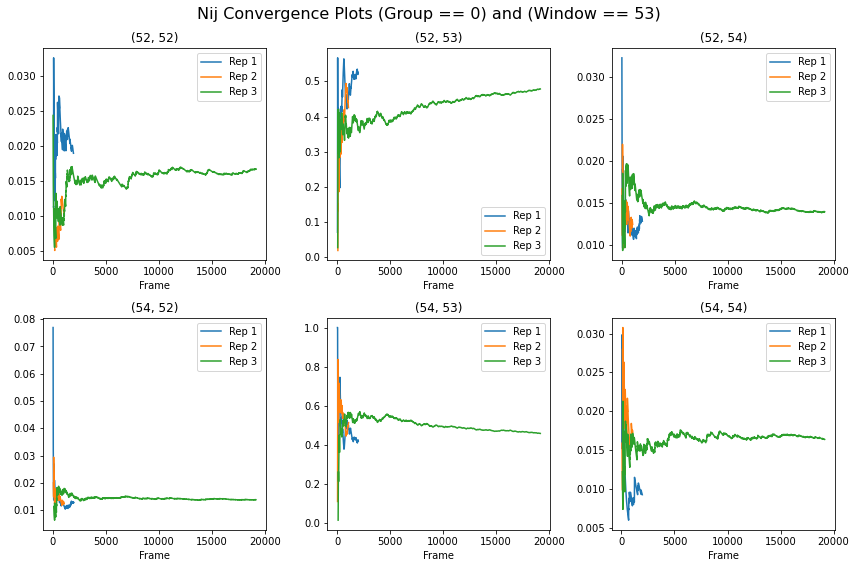

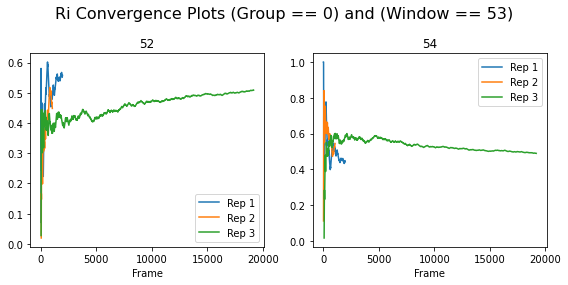

--- --- --- --- ---


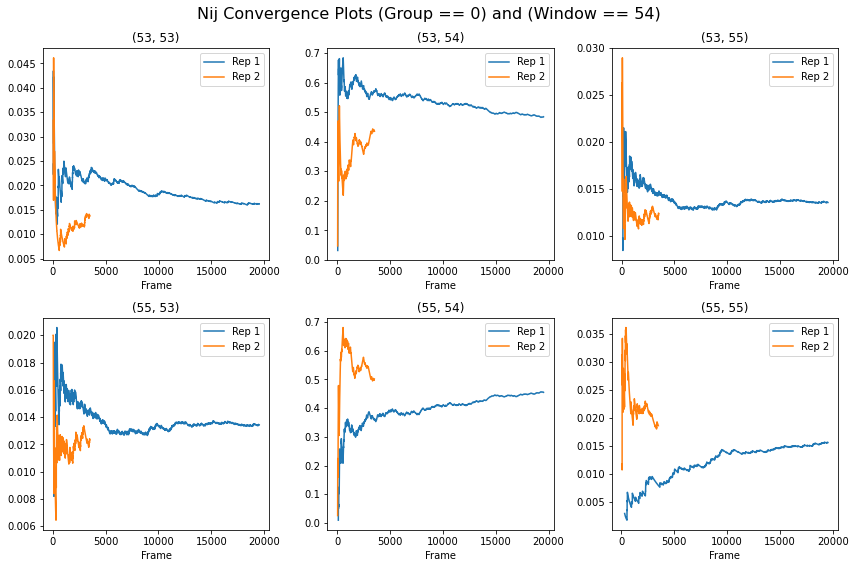

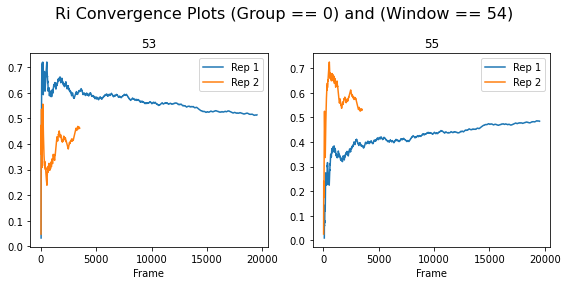

--- --- --- --- ---


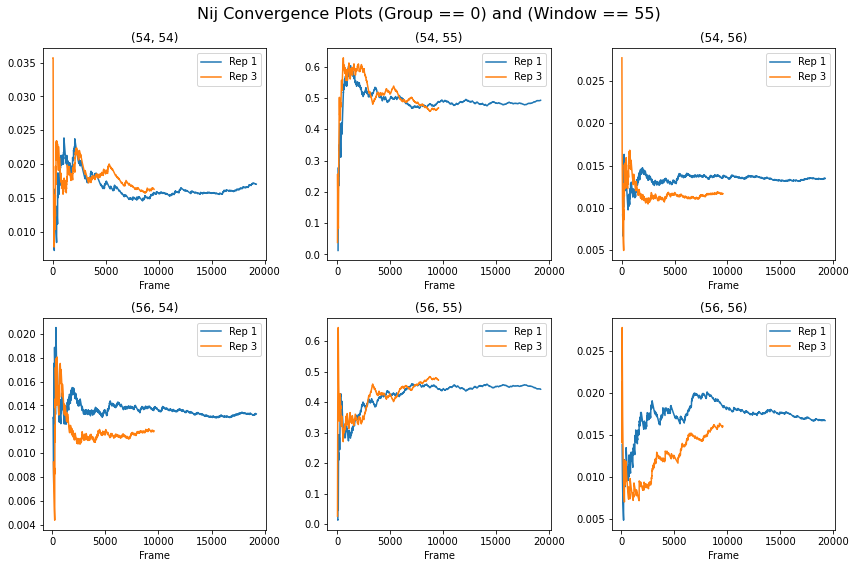

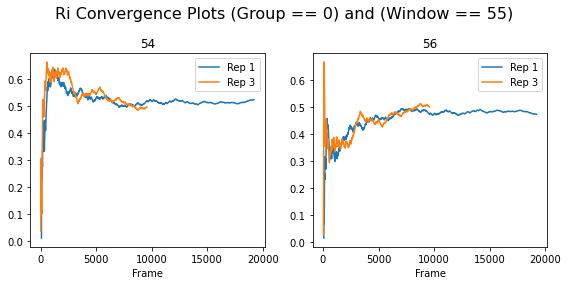

--- --- --- --- ---


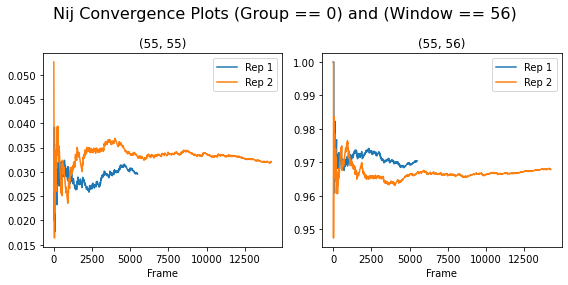

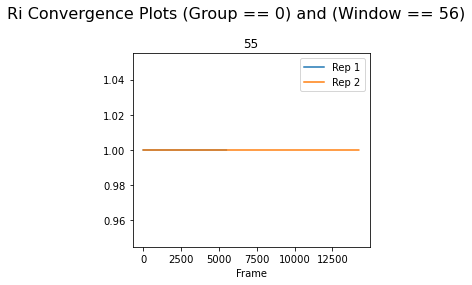

--- --- --- --- ---


In [64]:
#Plot all windows (will take up to an hour or more!)
groupingColumns=['Group','Window']

for group in Nij_Frame.groupby(groupingColumns):
    groupName,group_NijData=group
    
    group_NijData=group_NijData
    groupQuery=' and '.join([
        '({colname} == {colval})'.format(
            colname=colName,colval=colVal
        ) for colName,colVal in zip(groupingColumns,groupName)
    ])
    
    group_RiData=Ri_Frame.query(groupQuery)
    
    group_CountData=countFrame.query(groupQuery)
    
    nijPlotGroups=group_NijData.groupby(['BinName_i','BinName_j'])
    nijFig,nijAxs=plt.subplots(group_NijData.BinName_i.nunique(),group_NijData.BinName_j.nunique())
    nijFig.suptitle(
        'Nij Convergence Plots '+groupQuery,
        fontsize=16)
    nijFig.set_figwidth(4*group_NijData.BinName_j.nunique())
    nijFig.set_figheight(4*group_NijData.BinName_i.nunique())
    for i_nijPlotGroup,nijPlotGroup in enumerate(nijPlotGroups):
        nijPlotGroupName,nijPlotGroupData=nijPlotGroup
        ax=nijAxs.flatten()[i_nijPlotGroup]
        for repGroup in nijPlotGroupData.groupby('Rep'):
            repGroupName,repGroupData=repGroup
            plotData=repGroupData.set_index('Frame')
            plotCountData=group_CountData.query('Rep=={rep}'.format(rep=repGroupName)).set_index('FrameNumber')
            sns.lineplot(
                x=plotData.index,
                y=plotData.Cumulative_Count/plotCountData.Cumulative_Time.loc[plotData.index],
                label='Rep {rep}'.format(rep=repGroupName),
                ax=ax
            )
            ax.set_title(str(nijPlotGroupName))
    plt.tight_layout()
    plt.show()
    
    riPlotGroups=group_RiData.groupby('BinName')
    riFig,riAxs=plt.subplots(1,len(riPlotGroups))
    riFig.suptitle(
        'Ri Convergence Plots '+groupQuery,fontsize=16)
    riFig.set_figwidth(4*len(riPlotGroups))
    riFig.set_figheight(4)
    for i_riPlotGroup,riPlotGroup in enumerate(riPlotGroups):
        riPlotGroupName,riPlotGroupData=riPlotGroup
        if len(riPlotGroups)>1:
            ax=riAxs[i_riPlotGroup]
        else:
            ax=riAxs
        for repGroup in riPlotGroupData.groupby('Rep'):
            repGroupName,repGroupData=repGroup
            plotData=repGroupData.set_index('Frame')
            plotCountData=group_CountData.query('Rep=={rep}'.format(rep=repGroupName)).set_index('FrameNumber')
            sns.lineplot(
                x=plotData.index,
                y=plotData.Cumulative_Count/plotCountData.Cumulative_Time.loc[plotData.index],
                label='Rep {rep}'.format(rep=repGroupName),
                ax=ax
            )
            ax.set_title(str(riPlotGroupName))
    plt.tight_layout()
    plt.show()
    
    print('--- --- --- --- ---')

In [ ]:
!rsync -auvz ../cx26_milestoning_convergence_testing wesley@pharmacycluster.westernu.edu:/home/wesley/work/Connexin_Project/

In [65]:
import scipy as sp

In [66]:
from scipy import stats

In [67]:
import importlib
importlib.reload(analysis_functions)

import correlation_data_utilities as corr_utils

Loading BokehJS ...

In [57]:
milestoneData.head()

,Window,X_Index,Group,Rep,Frame,Escape_Vector,Reentry_Vector
0,0,0,0,1,0,0,-1
1,0,0,0,1,1,0,-1
2,0,0,0,1,2,0,-1
3,0,0,0,1,3,0,-1
4,0,0,0,1,4,0,-1


Computing R and N: ( 0 : 1 2 ) ( 1 : 1 ) ( 2 : 1 2 ) ( 3 : 1 2 3 ) ( 4 : 1 2 3 4 ) ( 5 : 1 2 3 ) ( 6 : 1 2 3 4 ) ( 7 : 1 2 ) ( 8 : 1 2 ) ( 9 : 1 2 ) ( 10 : 1 2 ) ( 11 : 1 2 ) ( 12 : 1 2 ) ( 13 : 1 ) ( 14 : 1 2 ) ( 15 : 1 2 3 4 ) ( 16 : 1 2 3 ) ( 17 : 1 2 3 4 ) ( 18 : 1 2 3 4 ) ( 19 : 1 2 ) ( 20 : 1 ) ( 21 : 1 ) ( 22 : 1 ) ( 23 : 1 ) ( 24 : 1 ) ( 25 : 1 ) ( 26 : 1 ) ( 27 : 1 ) ( 28 : 1 ) ( 29 : 1 ) ( 30 : 1 ) ( 31 : 1 ) ( 32 : 1 ) ( 33 : 1 ) ( 34 : 1 ) ( 35 : 1 ) ( 36 : 1 ) ( 37 : 1 ) ( 38 : 1 ) ( 39 : 1 ) ( 40 : 1 ) ( 41 : 1 ) ( 42 : 1 ) ( 43 : 1 ) ( 44 : 1 ) ( 45 : 1 ) ( 46 : 1 ) ( 47 : 1 2 ) ( 48 : 1 ) ( 49 : 1 ) ( 50 : 1 ) ( 51 : 1 ) ( 52 : 1 2 ) ( 53 : 1 2 3 ) ( 54 : 1 2 ) ( 55 : 1 3 ) ( 56 : 1 2 ) 


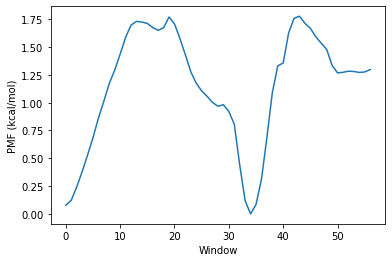

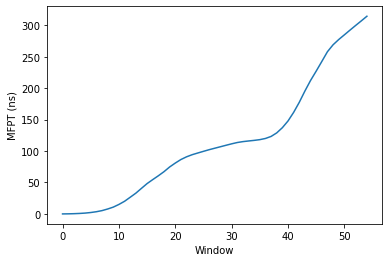

In [96]:
milestoneBinSet=milestoneData['Window'].unique()

milestoning_analysis_dict=analysis_functions.compute_analysis_group_Qdata(
    groupDataFrame=milestoneData,
    windowColumn='Window',binSet=milestoneBinSet,
    sourceWindows=None,sinkWindows=None,
    repColumn='Rep',givePiVec=True,
    giveBins=False,giveBinMap=True,
    giveEscapeMat=True,giveCounts=True,
    giveCountsMat=True,giveEdgeMap=True,
    giveRiVec=True,giveNijMat=True,
    giveQtargets=True)

kbT=.6
pmfVec=-kbT*np.log(milestoning_analysis_dict['piVec'])
pmfVec=pmfVec-np.min(pmfVec)
sns.lineplot(
    x=np.arange(len(pmfVec)),
    y=pmfVec)
plt.ylabel('PMF (kcal/mol)')
plt.xlabel('Window')
plt.show()
tauvec=milestoning_analysis_dict['tauVec']
dt=1e-3
mfptVec=dt*(np.max(tauvec)-tauvec)
sns.lineplot(
    x=np.arange(len(mfptVec)),
    y=mfptVec)
plt.ylabel('MFPT (ns)')
plt.xlabel('Window')
plt.show()

In [72]:
np.array(list(map(
    np.min,
    milestoning_analysis_dict['edgeMap']['edgeIndToPair'])))

array([ 0,  0,  0, ..., 54, 54, 55])

In [73]:
Rvec[Rvec_nzInds]

NameError: name 'Rvec' is not defined

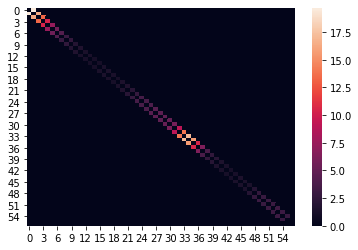

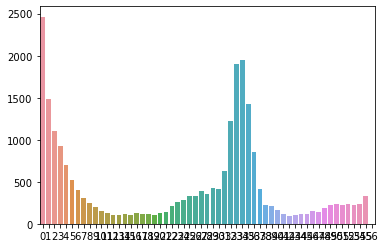

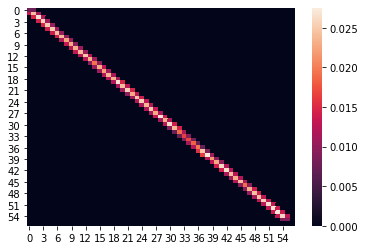

In [76]:
Qmat=milestoning_analysis_dict['Qmat'].todense()
Rvec=milestoning_analysis_dict['RiVec']
Nmat=milestoning_analysis_dict['NijMat'].todense()

edgeMap=milestoning_analysis_dict['edgeMap']
edgeIndTo1D=np.array(list(map(
    np.min,
    milestoning_analysis_dict['edgeMap']['edgeIndToPair'])))

Qmat_nzInds=np.nonzero(Qmat)
Rvec_nzInds=np.nonzero(Rvec)
Nmat_nzInds=np.nonzero(Nmat)

Qmat1D_nzInds=(
    edgeIndTo1D[Qmat_nzInds[0]],
    edgeIndTo1D[Qmat_nzInds[1]]
)
Rvec1D_nzInds=edgeIndTo1D[Rvec_nzInds]
Nmat1D_nzInds=(
    edgeIndTo1D[Nmat_nzInds[0]],
    edgeIndTo1D[Nmat_nzInds[1]]
)

nWindows=57
Qmat1D=sp.sparse.coo_matrix(
    (np.array(Qmat)[Qmat_nzInds],
     (Qmat1D_nzInds[0],Qmat1D_nzInds[1])),
    shape=(nWindows,nWindows)
).todense()
Qmat1D=-corr_utils.matLap(Qmat1D)
Rvec1D=np.zeros(nWindows)
Rvec1D[Rvec1D_nzInds]=Rvec[Rvec_nzInds]
Nmat1D=sp.sparse.coo_matrix(
    (np.array(Nmat)[Nmat_nzInds],
     (Nmat1D_nzInds[0],Nmat1D_nzInds[1])),
    shape=(nWindows,nWindows)
).todense()

sns.heatmap(Nmat1D)
plt.show()
sns.barplot(x=np.arange(len(Rvec1D)),y=Rvec1D)
plt.show()
sns.heatmap(np.abs(Qmat1D))
plt.show()

In [81]:
import math
from numpy import random
from math import log
from scipy import linalg as la
from scipy.stats import gamma as gamma

def _calc_MFPT_vec(Q):
	Q_hat = Q[:-1,:-1]

	#if verbose: print Q_hat

	I = np.zeros(len(Q_hat[0]))
		#I[:] = np.sqrt(len(Q_hat[0]))
	I[:] = 1
	
	T= la.solve(Q_hat,-I)

		#MFPT = T[0]
		#if verbose: print "MFPT =", T, "fs"

		#k_off = 1e15/MFPT

		#print "T", T  

	return T

def monte_carlo_milestoning_error(
    #model, bound_indices, 
    Q0, N_pre, R_pre, p_equil, T_tot, 
    do_on = False, num = 1000, skip = 100, stride =1,  verbose= False,
    pbar=None):
	'''Calculates an error estimate by sampling a distribution of rate matrices assumming 
	a poisson (gamma) distribution with parameters Nij and Ri using Markov chain Monte Carlo
		
	Enforces detailed Balance-- using a modified version of Algorithm 4 form Noe 2008 for rate matrices.--  
	Distribution is:  p(Q|N) = p(Q)p(N|Q)/p(N) = p(Q) PI(q_ij**N_ij * exp(-q_ij * Ri))
	Parameters
	----------
	model : object
		milestoning model object containing all transition and milestone information
	bound_indices : list
		list of indices of all milestones to be treated as bound states
	Q0 : numpy array
		Initial rate matrix (from MLE estimate) on which perturbations will be made to obtain a distribution
	N_pre : numpy array
		inital count matrix used to generate rate matrix perturbations from a gamma distribution
	R_pre : numpy arrray
		initial transition time matrix used to generate rate matrix perturbations from a gamma distribution
	p_equil : numpy array
		equilibrium probabilities oof each Voronoi cell (generated from MLE estimate)
	T_tot : numpy array
		total simulation time in each Voronoi cell
	num : int
		number of rate matrix (Q) samples to be generated
	skip : int
		number of inital rate matrix samples to skip for "burn in"
	stride : int
		frequency at which rate matrix samples are recorded- larger frequency reduces correlation between samples
	verbose : bool
		allow additional verbosity/printing
	Returns
	-------
	k_off_list : list
		list of calculated k off values calculated from rate matrix samples
	running_avg : list
		average k off calculated at each sampling interval (used for plotting convergence)
	running_std : list
		standard deviation of k off calculated at each interval (used for plotting convergence)
	k_on_list : list
		list of calculated k on values calculated from rate matrix samples
	k_on_avg : list
		average k on calculated at each sampling interval (used for plotting convergence)
	k_on_std : list
		standard deviation of k on calculated at each interval (used for plotting convergence)
	'''
	m = N_pre.shape[0] #get size of count matrix
	Q = Q0
	Q_mats = []
	mfptList= []
	N = []
	R = []
	k_off_list = []
	running_avg = []
	running_std = []
	k_on_list = []
	k_on_avg = []
	k_on_std =[]
	
	
	N = N_pre
	R = R_pre

	if verbose: print("Q", Q.shape)
	if verbose: print(Q)
	P = np.zeros((m,m))
	Q_test = np.zeros((m,m))
	tau = np.zeros(m)


	if verbose: print("N", N)
	if verbose: print("R", R)
	
	Qnew = Q
	if verbose: print("collecting ", num, " MCMC samples from ", num*(stride)+ skip, " total moves")
	if pbar is None:
		loopIterator=range(num*(stride)+ skip)
	else:
		loopIterator=tqbar(range(num*(stride)+ skip))
	for counter in loopIterator:
		if verbose: print("MCMC stepnum: ", counter)
		Qnew = np.zeros((m,m)) #np.matrix(np.copy(T))
		for i in range(m): # rows
			for j in range(m): # columns
				Qnew[i,j] = Q[i,j]


		for i in range(m): # rows
			for j in range(m): # columns
				if i == j: continue
				if Qnew[i,j] == 0.0: continue
				if Qnew[j,j] == 0.0: continue


				Q_gamma = 0
				delta = Qnew[i,j]
				while ((delta) >= (Qnew[i,j])):# or (Qnew[i,j] - Q_gamma) >= abs(Qnew[i,i])):
					Q_gamma = gamma.rvs(a=N[i,j], scale = 1/R[i],)
					
					delta =  Qnew[i,j] - Q_gamma
	

				log_p_Q_old = N[i,j] * log(Qnew[i,j])  - Qnew[i,j] * R[i] #+ -Qnew[i,i] * R[i]

				log_p_Q_new = N[i,j] * log(Qnew[i,j] - delta) - (Qnew[i,j] - delta) * R[i] #+ -(Qnew[i,i] + delta) * R[i]

				if verbose: print("log P(Q_new)", log_p_Q_new)
				if verbose: print("log P(Q_old)", log_p_Q_old)

				r2 = random.random()  
				p_acc =  log_p_Q_new - log_p_Q_old
				#if verbose: print("p_acc", p_acc, "r", log(r2))
					
				if log(r2) <= p_acc: #log(r) can be directly compared to log-likeliehood acceptance, p_acc
					#if verbose: print("performing non-reversible element shift...")
						

					Qnew[i,i] = (Qnew[i,i]) + delta
					Qnew[i,j] = Qnew[i,j] - delta


					if verbose: print(Qnew)

		if counter > skip and counter % stride == 0:
				Q_mats.append(copy.deepcopy(Qnew))
				try:
					T_err = _calc_MFPT_vec(Qnew)
					mfptList.append(copy.deepcopy(T_err))
					k_off_list.append(1/T_err[0])
					running_avg.append(np.average(k_off_list))
					running_std.append(np.std(k_off_list))
				except la.LinAlgError as e:
					print(e)
					print('Exciting early, returning data collected so far.')
					if verbose: print("final MCMC matrix", Q)
					return mfptList, Q_mats, k_off_list, running_avg, running_std, k_on_list, k_on_avg, k_on_std 
				#if do_on:
					#k_on_list.append(calc_kon_from_bd(model,bound_indices, Qnew))
					#k_on_avg.append(np.average(k_on_list))
					#k_on_std.append(np.std(k_on_list))	
 
		Q = Qnew
	if verbose: print("final MCMC matrix", Q)
	return mfptList, Q_mats, k_off_list, running_avg, running_std, k_on_list, k_on_avg, k_on_std 

In [91]:
nsamples=10000
errorAnalysisDataList=monte_carlo_milestoning_error(
    #model, bound_indices, 
    Q0=Qmat1D, N_pre=Nmat1D, R_pre=Rvec1D, 
    p_equil=milestoning_analysis_dict['piVec'], 
    T_tot=milestoning_analysis_dict['countVec'], 
    do_on = False, num = nsamples, skip = 100, stride =1,  verbose= False,
    pbar=tqbar)

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:108: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=1.25107e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=5.59384e-19): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=4.26354e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=2.8138e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=4.01643e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_la

Matrix is singular.
Exciting early, returning data collected so far.



/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=1.32112e-17): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=9.01635e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=4.95231e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=7.36958e-18): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_launcher.py:16: LinAlgWarning:

Ill-conditioned matrix (rcond=7.75134e-19): result may not be accurate.

/Users/wbotellosmith/anaconda2/envs/py_3/lib/python3.6/site-packages/ipykernel_l

Collected a total of 3125 out of 10000
Procedure stopped short, likely due to a singular matrix.
Plotting last matrix


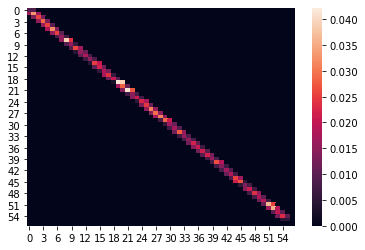

In [95]:
print('Collected a total of {niter} out of {nsamp}'.format(
    niter=len(errorAnalysisDataList[1]),
    nsamp=nsamples))
if len(errorAnalysisDataList[1]) < nsamples:
    print('Procedure stopped short, likely due to a singular matrix.')
    print('Plotting last matrix')
    sns.heatmap(np.abs(np.array(errorAnalysisDataList[1][-1])))
    plt.show()

Be sure to check output from above. It is not uncommon for the MCMC to fail due to generating a singular matrix.

In [ ]:
mfptData=errorAnalysisDataList[0]
tauMC_Deltas=list(map(
    lambda x: x[1:]-x[:-1],
    mfptData
))

In [ ]:
alpha=.1
np.array(list(map(
    lambda x:np.quantile(x,q=alpha/2.),
    np.array(tauMC_Deltas).T))).T


In [ ]:
dt=1e-3
mfptData=np.array(errorAnalysisDataList[0])*dt
tauMC_Deltas=np.array(list(map(
    lambda x: x[:-1]-x[1:],
    mfptData
)))

alpha=.1
tauMC_UB=np.array(list(map(
    lambda x:np.quantile(x,q=1-alpha/2.),
    np.array(tauMC_Deltas).T))).T
tauMC_LB=np.array(list(map(
    lambda x:np.quantile(x,q=alpha/2.),
    np.array(tauMC_Deltas).T))).T
tauMC_Mean=np.array(list(map(
    lambda x:np.mean(x),
    np.array(tauMC_Deltas).T))).T
tauMC_HarmonicMean=np.array(list(map(
    lambda x:1./np.mean(1./x),
    np.array(tauMC_Deltas).T))).T
tauMC_Median=np.array(list(map(
    lambda x:np.median(x),
    np.array(tauMC_Deltas).T))).T


tauDeltas=milestoning_analysis_dict['tauVec']*dt
tauDeltas=tauDeltas[:-1]-tauDeltas[1:]

sns.lineplot(
    np.arange(len(tauDeltas)),
    tauDeltas,
    label='Sim',
    color='black'
)

sns.lineplot(
    np.arange(len(tauMC_UB)),
    tauMC_UB,
    label='MC {a:.2f} Inner Quantile Bounds'.format(a=1-alpha),
    color='red'
)
sns.lineplot(
    np.arange(len(tauMC_LB)),
    tauMC_LB,
    #label='MC {a:.2f} Inner Quantile Bounds'.format(a=1-alpha),
    color='red'
)

sns.lineplot(
    np.arange(len(tauMC_Mean)),
    tauMC_Mean,
    label='MC Mean',
    color='green'
)
sns.lineplot(
    np.arange(len(tauMC_Median)),
    tauMC_Median,
    label='MC Median',
    color='cyan'
)
sns.lineplot(
    np.arange(len(tauMC_HarmonicMean)),
    tauMC_HarmonicMean,
    label='MC HarmonicMean',
    color='blue'
)

plt.yscale('log')
plt.show()

kbT=.6
pmfVec=-kbT*np.log(milestoning_analysis_dict['piVec'])
pmfVec=pmfVec-np.min(pmfVec)
sns.lineplot(np.arange(len(pmfVec)),pmfVec)
plt.show()

In [ ]:
import ipywidgets as widgets
from ipywidgets import interact

In [ ]:
@interact
def plot_milestone_delta_hist(
    mInd=np.arange(len(tauMC_Deltas.T))
):
    plt.hist(tauMC_Deltas.T[mInd])
    plt.yscale('log')
    plt.show()

In [ ]:
sns.distplot(np.abs(sp.linalg.eig(Qmat1D)[0]))
plt.show()

In [ ]:
np.argmin((np.sum(Qmat1D,axis=0)))

In [ ]:
np.sum(Qmat1D[:,50])

In [ ]:
sns.lineplot(np.arange(len(errorAnalysisDataList[2])),
             np.cumsum(errorAnalysisDataList[2]) / \
             np.arange(len(errorAnalysisDataList[2]))
            )
plt.show()

In [5]:
1100-400-240-40-385

35